# Data Prediction Using LSTM, GRU, and RNN

## Data Preparation

### Import all library used 

In [990]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from keras.optimizers import SGD
import math
from sklearn.metrics import mean_squared_error
sc = MinMaxScaler(feature_range=(0,1)) #normalisasi dari 0 - 1

### Path for Data

In [991]:
data_path = "../data_after_prep"

### Get Data from path

In [992]:
list_data = os.listdir(data_path)
list_data

['ADRO2001-2407.csv',
 'AMMN2001-2407.csv',
 'AMRT2001-2407.csv',
 'ASII2001-2407.csv',
 'BBCA2001-2407.csv',
 'GOTO2001-2407.csv',
 'KLBF2001-2407.csv',
 'MAPI2001-2407.csv',
 'TLKM2001-2407.csv']

### Dataset for each stock code

In [993]:
ADRO = pd.read_csv(data_path + "/" + list_data[0], index_col='date', parse_dates=['date'])
AMMN = pd.read_csv(data_path + "/" + list_data[1], index_col='date', parse_dates=['date'])
AMRT = pd.read_csv(data_path + "/" + list_data[2], index_col='date', parse_dates=['date'])
ASII = pd.read_csv(data_path + "/" + list_data[3], index_col='date', parse_dates=['date'])
BBCA = pd.read_csv(data_path + "/" + list_data[4], index_col='date', parse_dates=['date'])
GOTO = pd.read_csv(data_path + "/" + list_data[5], index_col='date', parse_dates=['date'])
KLBF = pd.read_csv(data_path + "/" + list_data[6], index_col='date', parse_dates=['date'])
MAPI = pd.read_csv(data_path + "/" + list_data[7], index_col='date', parse_dates=['date'])
TLKM = pd.read_csv(data_path + "/" + list_data[8], index_col='date', parse_dates=['date'])



### Method for see data and see RMSE

In [994]:
# Some functions to help out with
def plot_predictions(stock_title,test,predicted, title):
    plt.plot(test, color='red',label='Real '+ stock_title+' Stock Price')
    plt.plot(predicted, color='blue',label='Predicted '+ stock_title+' Stock Price')
    plt.title(stock_title + ' Stock Price Prediction '+title)
    plt.xlabel('Time')
    plt.ylabel(stock_title +' Stock Price')
    plt.legend()
    plt.show()

def return_rmse(test,predicted):
    rmse = math.sqrt(mean_squared_error(test, predicted))
    print("The root mean squared error is {}.".format(rmse))
    return rmse

def return_rmse_norm(test, pred):
    len_pred = len(pred)
    #pred = pred.reshape(len_pred)
    total = np.concatenate((pred, test))
    #total = total.reshape(-1,1)
    total = sc.fit_transform(total)
    arr_pred = total[len_pred:]
    arr_test = total[:len_pred]
    rmse = math.sqrt(mean_squared_error(arr_test, arr_pred))
    print("The root mean squared error after normalization is {}.".format(rmse))
    return rmse

### Result DataFrame

In [995]:
dic_res = {'stock' : [], 'term' : [], 'algorithm': [], 'rmse' : [], 'rmse_norm' : []}

## Short Term Predictions
Short term prediction using in this program is prediction in the week in a month.
Data use for this predictions is data in July 2024.
Data train and test is:
1. Data Train
    * Week 1: 1 - 5 July 2024
    * Week 2: 8 - 12 July 2024
    * Week 3: 15 - 19 July 2024
2. Data Test
    * Week 4: 22 - 26 July 2024 
    * Week 5: 29 - 31 July 2024

### ADRO

In [996]:
ADRO.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,ADRO,1555,1555,1490,1495,76612000
2020-01-03,ADRO,1495,1470,1425,1465,117795600
2020-01-06,ADRO,1465,1515,1450,1465,61423200
2020-01-07,ADRO,1465,1540,1460,1540,74336500
2020-01-08,ADRO,1540,1535,1505,1505,55121100


#### Data Split

In [997]:
ADRO_short_train = ADRO["2024-07-01":"2024-07-19"].iloc[:,3:4].values
ADRO_short_test = ADRO["2024-07-19":"2024-07-31"].iloc[:,3:4].values

##### Plot Train Test Data for ADRO

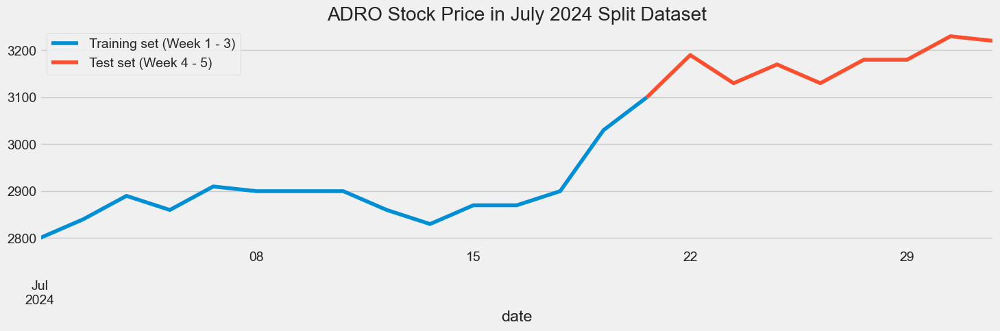

In [998]:
ADRO["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
ADRO["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('ADRO Stock Price in July 2024 Split Dataset')
plt.show()

##### Normalize Train Dataset

In [999]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ADRO_short_train)

##### Dataset Length

In [1000]:
len_train = len(ADRO_short_train)
len_test = len(ADRO_short_test)
print(len_train, len_test)

15 9


#### LSTM Predictions

##### 5 Timestep Dataset Preparation

In [1001]:
# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

##### Reshaping


In [1002]:
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

##### LSTM Architecture

In [1003]:
# The LSTM architecture
regressorLSTM = Sequential()
# First LSTM layer with Dropout regularisation
regressorLSTM.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
regressorLSTM.add(Dropout(0.2))
# Second LSTM layer
regressorLSTM.add(LSTM(units=50, return_sequences=True))
regressorLSTM.add(Dropout(0.2))
# Third LSTM layer
regressorLSTM.add(LSTM(units=50, return_sequences=True))
regressorLSTM.add(Dropout(0.2))
# Fourth LSTM layer
regressorLSTM.add(LSTM(units=50))
regressorLSTM.add(Dropout(0.2))
# The output layer
regressorLSTM.add(Dense(units=1))

# Compiling the RNN
regressorLSTM.compile(optimizer='rmsprop',loss='mean_squared_error')
# Fitting to the training set
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 11s 11s/step - loss: 0.2161
Epoch 2/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1898
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1707
Epoch 4/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1523
Epoch 5/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1318
Epoch 6/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1144
Epoch 7/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1009
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0846
Epoch 9/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0628
Epoch 10/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0598
Epoch 11/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0578
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0539
Epoch 13/50
1/1 [==============================] - 0s 19ms/st

In [1004]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 5 entires of test set have 5 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

"""
ADRO_short_train = ADRO["2024-07-01":"2024-07-19"].iloc[:,3:4].values
ADRO_short_test = ADRO["2024-07-22":"2024-07-31"].iloc[:,3:4].values
"""
dataset_total = pd.concat((ADRO["close"]["2024-07-01":"2024-07-19"],ADRO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [1005]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

1/1 [==============================] - 3s 3s/step


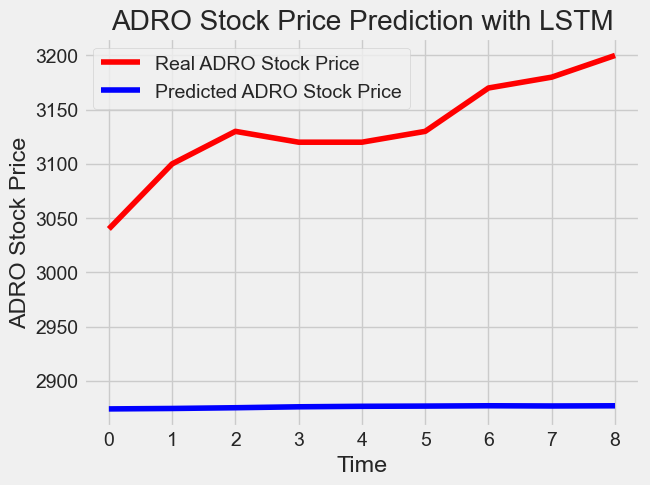

In [1006]:
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ADRO', ADRO_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2161622775.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


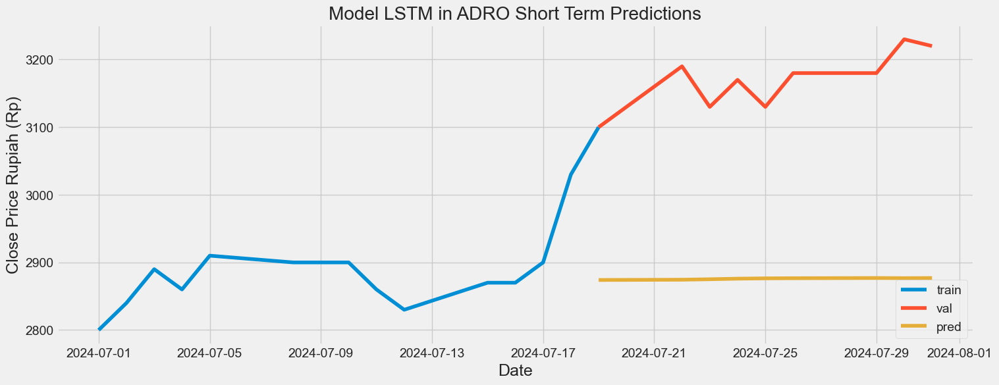

In [1007]:
# Visualize the data
# Plot the data
train = ADRO["2024-07-01":"2024-07-19"]
valid = ADRO["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ADRO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1008]:
# Evaluating the sequence
rmse = return_rmse(ADRO_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 260.0595861750485.
The root mean squared error after normalization is 0.7978160243965086.


#### GRU Predictions

In [1009]:
# The GRU architecture
regressorGRU = Sequential()
# First GRU layer with Dropout regularisation
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))
# Second GRU layer
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))
# Third GRU layer
regressorGRU.add(GRU(units=50, return_sequences=True, input_shape=(X_train.shape[1],1), activation='tanh'))
regressorGRU.add(Dropout(0.2))
# Fourth GRU layer
regressorGRU.add(GRU(units=50, activation='tanh'))
regressorGRU.add(Dropout(0.2))
# The output layer
regressorGRU.add(Dense(units=1))
# Compiling the RNN
regressorGRU.compile(optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=False),loss='mean_squared_error')
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 10s 10s/step - loss: 0.2326
Epoch 2/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1903
Epoch 3/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1172
Epoch 4/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0613
Epoch 5/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0414
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0778
Epoch 7/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1150
Epoch 8/50
1/1 [==============================] - 0s 12ms/step - loss: 0.1399
Epoch 9/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0861
Epoch 10/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1051
Epoch 11/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0654
Epoch 12/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0490
Epoch 13/50
1/1 [==============================] - 0s 14ms/st

In [1010]:
dataset_total = pd.concat((ADRO["close"]["2024-07-01":"2024-07-19"],ADRO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)


# Preparing X_test and predicting the prices
X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
                       
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

1/1 [==============================] - 2s 2s/step


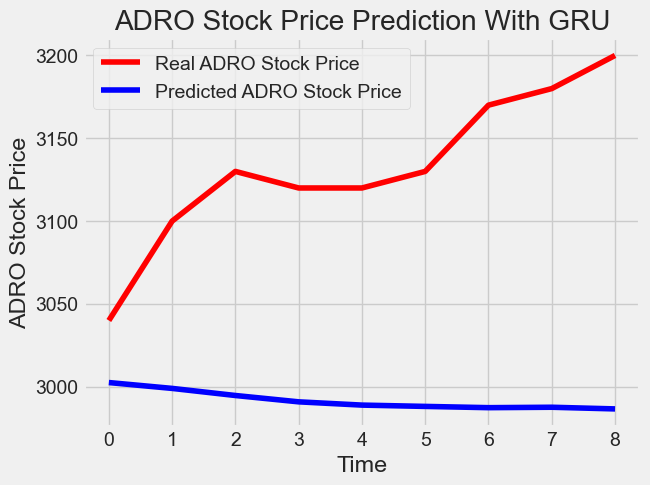

In [1011]:
# Visualizing the results for GRU
gru_title = "With GRU"
plot_predictions("ADRO", ADRO_short_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\421449403.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


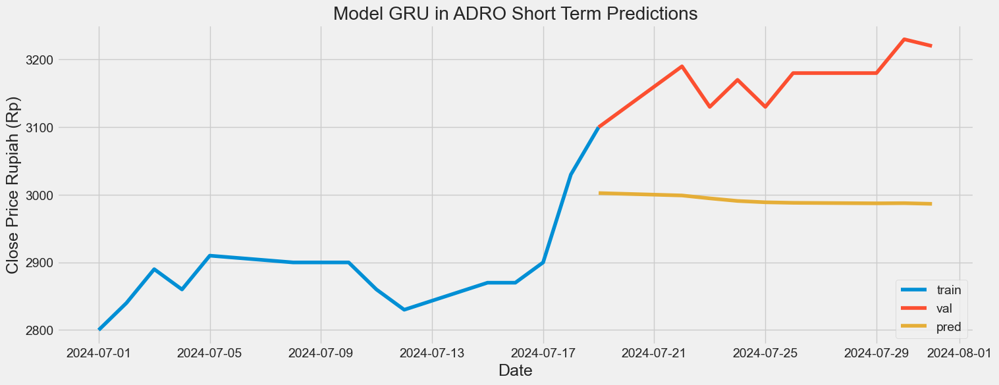

In [1012]:
# Visualize the data
# Plot the data
train = ADRO["2024-07-01":"2024-07-19"]
valid = ADRO["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ADRO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1013]:
# Evaluating the sequence

rmse = return_rmse(ADRO_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 148.9759959662226.
The root mean squared error after normalization is 0.6982149794183519.


#### RNN Predictions

In [1014]:
# importing libraries
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import Dropout

# initializing the RNN
regressorRNN = Sequential()

# adding first RNN layer and dropout regulatization
regressorRNN.add(
    SimpleRNN(units = 50, 
              activation = "tanh", 
              return_sequences = True, 
              input_shape = (X_train.shape[1],1))
             )

regressorRNN.add(
    Dropout(0.2)
             )


# adding second RNN layer and dropout regulatization

regressorRNN.add(
    SimpleRNN(units = 50, 
              activation = "tanh", 
              return_sequences = True)
             )

regressorRNN.add(
    Dropout(0.2)
             )

# adding third RNN layer and dropout regulatization

regressorRNN.add(
    SimpleRNN(units = 50, 
              activation = "tanh", 
              return_sequences = True)
             )

regressorRNN.add(
    Dropout(0.2)
             )

# adding fourth RNN layer and dropout regulatization

regressorRNN.add(
    SimpleRNN(units = 50)
             )

regressorRNN.add(
    Dropout(0.2)
             )

# adding the output layer
regressorRNN.add(Dense(units = 1))

# compiling RNN
regressorRNN.compile(
    optimizer = "adam", 
    loss = "mean_squared_error",
    metrics = ["accuracy"])

# fitting the RNN
history = regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)


Epoch 1/50
1/1 [==============================] - 6s 6s/step - loss: 0.6133 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 14ms/step - loss: 0.4806 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 15ms/step - loss: 0.4135 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 14ms/step - loss: 0.2442 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 13ms/step - loss: 0.2818 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0476 - accuracy: 0.1000
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.2973 - accuracy: 0.0000e+00
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.4090 - accuracy: 0.0000e+00
Epoch 9/50
1/1 [==============================] - 0s 13ms/step - loss: 0.2430 - accuracy: 0.0000e+00
Epoch 10/50
1/1 [==============================] - 0s 14ms/step - loss: 0.3523 - accuracy: 0.0000e+00
Epoch 1

In [1015]:

dataset_total = pd.concat((ADRO["close"]["2024-07-01":"2024-07-19"],ADRO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)


# Preparing X_test and predicting the prices
X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

1/1 [==============================] - 1s 901ms/step


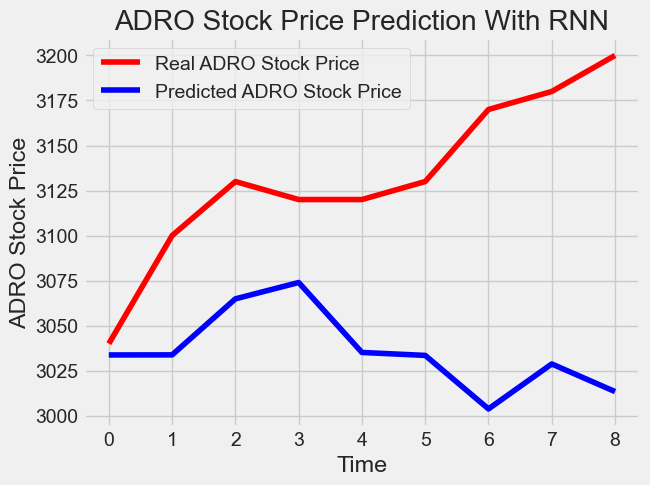

In [1016]:

# Visualizing the results for GRU
rnn_title = "With RNN"
plot_predictions("ADRO", ADRO_short_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1127151966.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


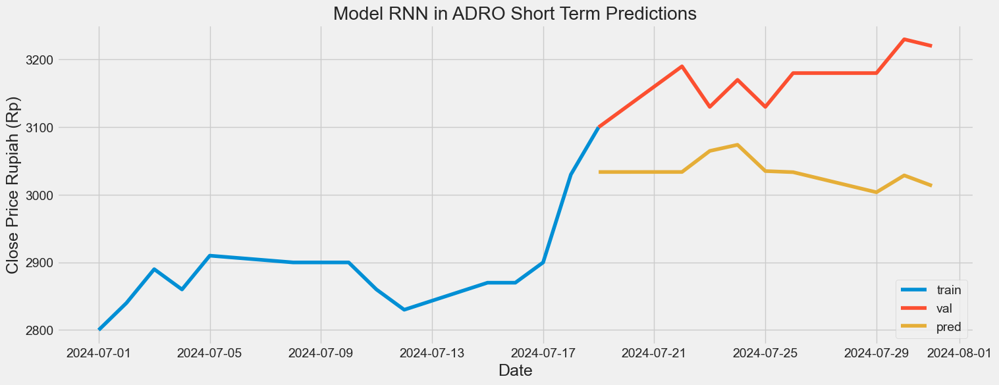

In [1017]:
# Visualize the data
# Plot the data
train = ADRO["2024-07-01":"2024-07-19"]
valid = ADRO["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ADRO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1018]:
# Evaluating the sequence
rmse = return_rmse(ADRO_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 111.87889063272134.
The root mean squared error after normalization is 0.5701267836452885.


### AMMN

#### Data Split

In [1019]:
AMMN.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2023-07-07,AMMN,1695,1820,1700,1755,411565100
2023-07-10,AMMN,1755,1765,1745,1750,59010700
2023-07-11,AMMN,1750,1760,1750,1750,34028600
2023-07-12,AMMN,1750,1765,1750,1765,27860100
2023-07-13,AMMN,1765,1765,1750,1760,41745700


In [1020]:
AMMN_short_train = AMMN["2024-07-01":"2024-07-19"].iloc[:,3:4].values
AMMN_short_test = AMMN["2024-07-19":"2024-07-31"].iloc[:,3:4].values

##### Plot Train Test Data for AMMN

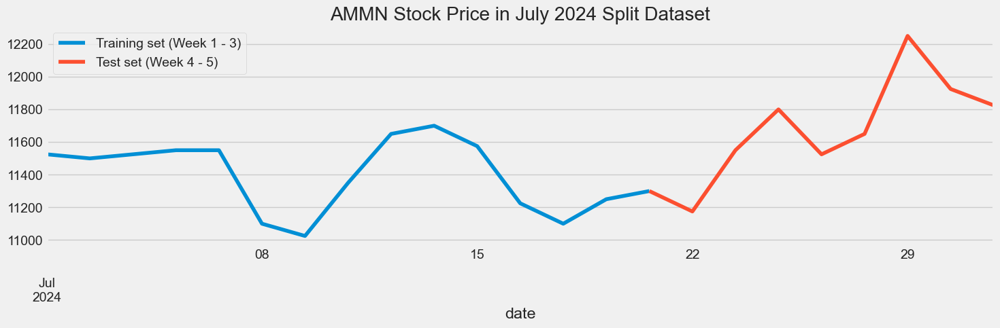

In [1021]:
AMMN["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
AMMN["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('AMMN Stock Price in July 2024 Split Dataset')
plt.show()

In [1022]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMMN_short_train)
len_train = len(AMMN_short_train)
len_test = len(AMMN_short_test)
print(len_train, len_test)

15 9


In [1023]:
# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [1024]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 26ms/step - loss: 0.1083
Epoch 2/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0992
Epoch 3/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1069
Epoch 4/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0942
Epoch 5/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0940
Epoch 6/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0656
Epoch 7/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0989
Epoch 8/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1014
Epoch 9/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0883
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1092
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0929
Epoch 12/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0850
Epoch 13/50
1/1 [==============================] - 0s 17ms/st

1/1 [==============================] - 0s 51ms/step


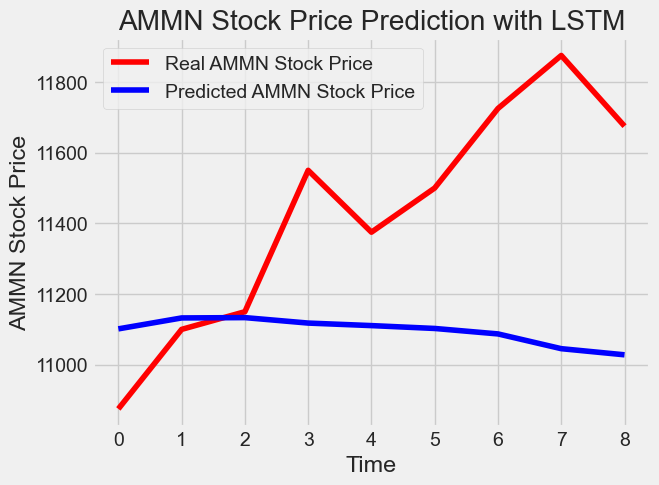

In [1025]:
dataset_total = pd.concat((AMMN["close"]["2024-07-01":"2024-07-19"],AMMN["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMMN', AMMN_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3088982548.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


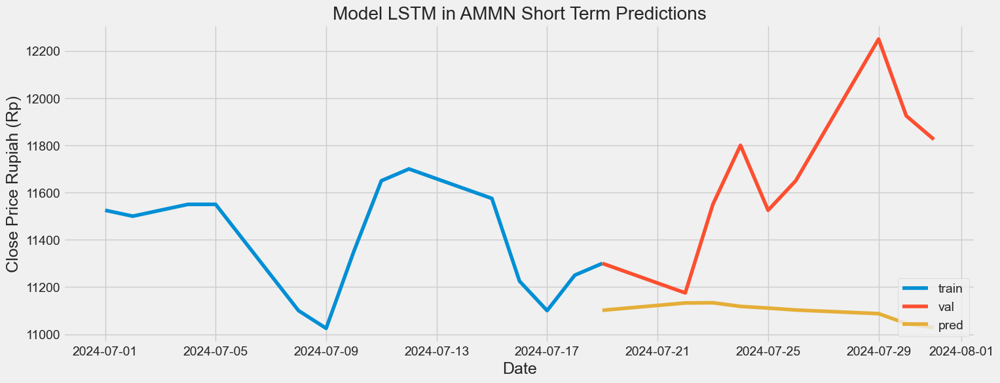

In [1026]:
# Visualize the data
# Plot the data
train = AMMN["2024-07-01":"2024-07-19"]
valid = AMMN["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMMN Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1027]:
# Evaluating the sequence
rmse = return_rmse(AMMN_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 469.12470142330045.
The root mean squared error after normalization is 0.46912470142330026.


#### GRU Predictions

In [1028]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1267
Epoch 2/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1120
Epoch 3/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1018
Epoch 4/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0851
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0843
Epoch 6/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0814
Epoch 7/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0944
Epoch 8/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0903
Epoch 9/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1168
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0903
Epoch 11/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0880
Epoch 12/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0739
Epoch 13/50
1/1 [==============================] - 0s 25ms/st

1/1 [==============================] - 0s 48ms/step


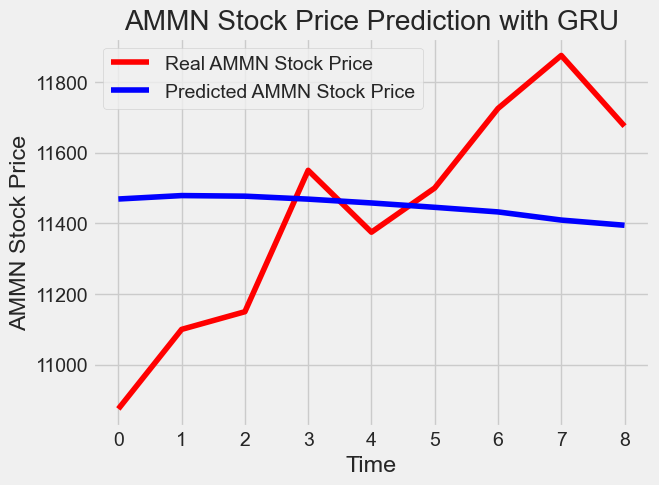

In [1029]:
dataset_total = pd.concat((AMMN["close"]["2024-07-01":"2024-07-19"],AMMN["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMMN', AMMN_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\197209116.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


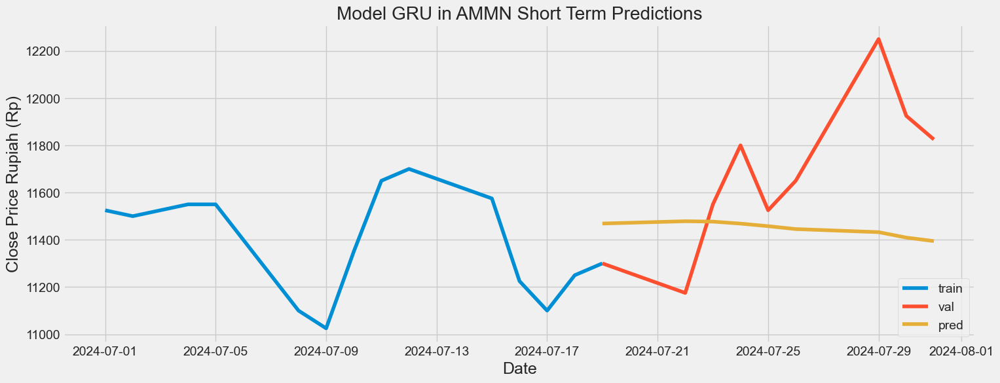

In [1030]:
# Visualize the data
# Plot the data
train = AMMN["2024-07-01":"2024-07-19"]
valid = AMMN["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMMN Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1031]:
# Evaluating the sequence

rmse = return_rmse(AMMN_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 333.4125761249793.
The root mean squared error after normalization is 0.3334125761249792.


#### RNN Predictions

In [1032]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 19ms/step - loss: 0.3258 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 13ms/step - loss: 0.5709 - accuracy: 0.1000
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.2645 - accuracy: 0.2000
Epoch 4/50
1/1 [==============================] - 0s 15ms/step - loss: 0.2058 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 14ms/step - loss: 0.5645 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 12ms/step - loss: 0.2719 - accuracy: 0.1000
Epoch 7/50
1/1 [==============================] - 0s 11ms/step - loss: 0.3949 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1559 - accuracy: 0.2000
Epoch 9/50
1/1 [==============================] - 0s 13ms/step - loss: 0.3251 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 13ms/step - loss: 0.5427 - accuracy: 0.0000e+00
Epoch 11/50
1/1 [========

1/1 [==============================] - 0s 57ms/step


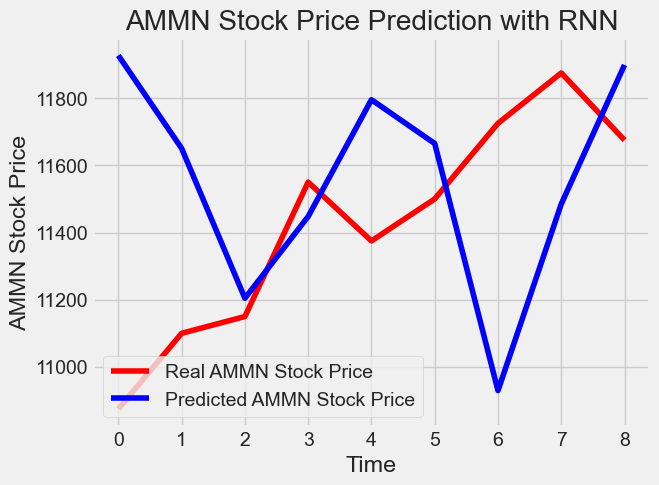

In [1033]:
dataset_total = pd.concat((AMMN["close"]["2024-07-01":"2024-07-19"],AMMN["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMMN', AMMN_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3390390207.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


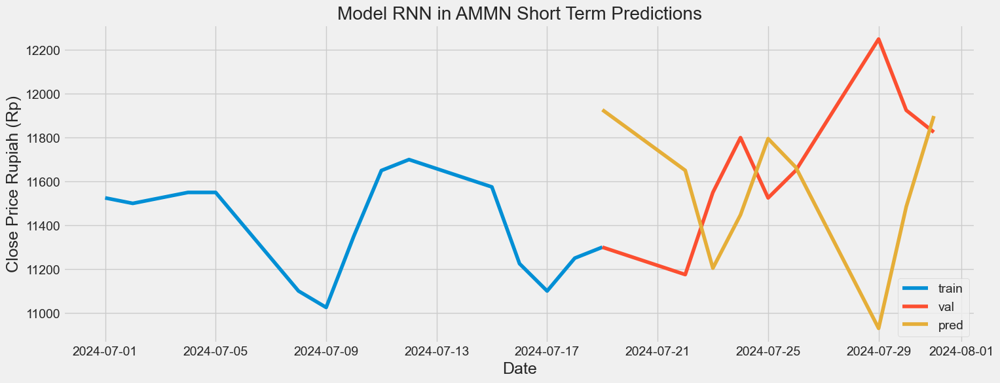

In [1034]:
# Visualize the data
# Plot the data
train = AMMN["2024-07-01":"2024-07-19"]
valid = AMMN["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMMN Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1035]:
# Evaluating the sequence
rmse = return_rmse(AMMN_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 523.0477425653798.
The root mean squared error after normalization is 0.4971595199828358.


### AMRT

In [1036]:
AMRT.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,AMRT,880,880,855,875,9600
2020-01-03,AMRT,875,880,855,865,51800
2020-01-06,AMRT,865,865,845,845,42000
2020-01-07,AMRT,845,850,840,840,20500
2020-01-08,AMRT,840,855,840,855,568500


#### Data Split

In [1037]:
AMRT_short_train = AMRT["2024-07-01":"2024-07-19"].iloc[:,3:4].values
AMRT_short_test = AMRT["2024-07-19":"2024-07-31"].iloc[:,3:4].values

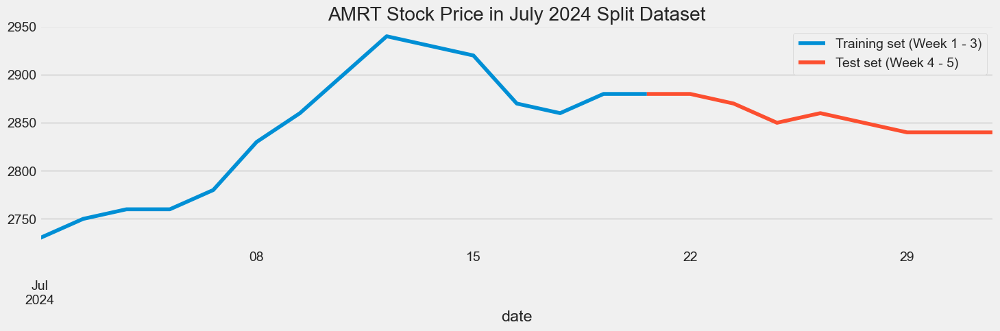

In [1038]:
AMRT["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
AMRT["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('AMRT Stock Price in July 2024 Split Dataset')
plt.show()

In [1039]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMRT_short_train)
len_train = len(AMRT_short_train)
len_test = len(AMRT_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [1040]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0478
Epoch 2/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0574
Epoch 3/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0616
Epoch 4/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0616
Epoch 5/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0555
Epoch 6/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0455
Epoch 7/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0568
Epoch 8/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0363
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0588
Epoch 10/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0628
Epoch 11/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0564
Epoch 12/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0407
Epoch 13/50
1/1 [==============================] - 0s 22ms/st

1/1 [==============================] - 0s 51ms/step


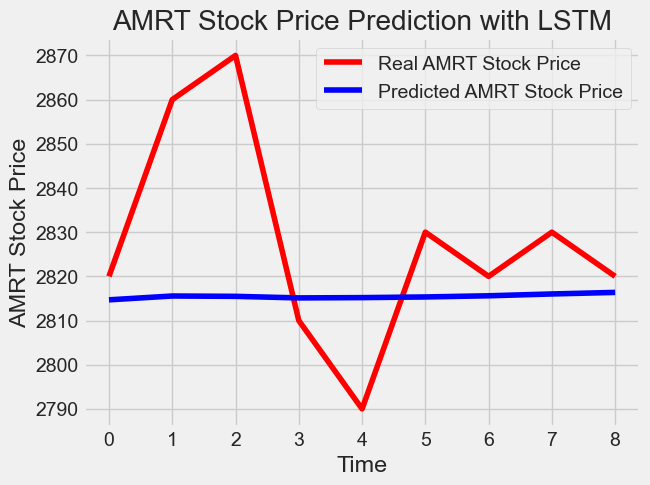

In [1041]:
dataset_total = pd.concat((AMRT["close"]["2024-07-01":"2024-07-19"],AMRT["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMRT', AMRT_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\566703989.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


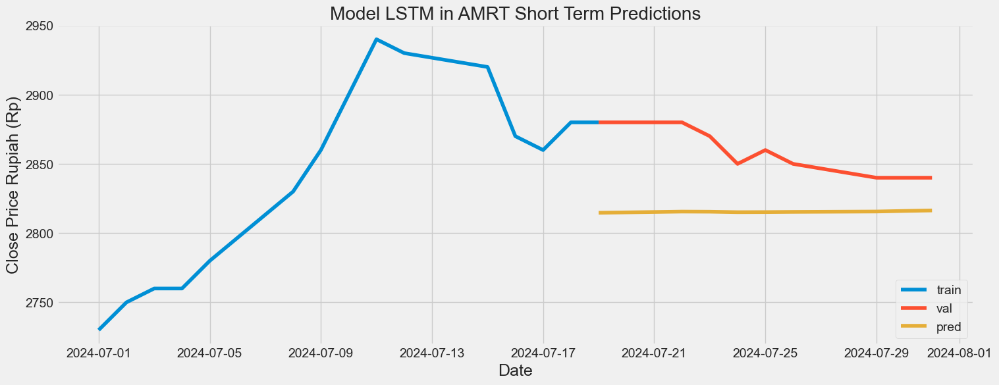

In [1042]:
# Visualize the data
# Plot the data
train = AMRT["2024-07-01":"2024-07-19"]
valid = AMRT["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMRT Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1043]:
# Evaluating the sequence
rmse = return_rmse(AMRT_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 25.991800165776322.
The root mean squared error after normalization is 0.3248975020722024.


#### GRU Predictions

In [1044]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 473ms/step - loss: 0.0597
Epoch 2/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0709
Epoch 3/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0628
Epoch 4/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0548
Epoch 5/50
1/1 [==============================] - 0s 52ms/step - loss: 0.0679
Epoch 6/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0456
Epoch 7/50
1/1 [==============================] - 0s 32ms/step - loss: 0.0543
Epoch 8/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0603
Epoch 9/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0592
Epoch 10/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0499
Epoch 11/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0399
Epoch 12/50
1/1 [==============================] - 0s 51ms/step - loss: 0.0490
Epoch 13/50
1/1 [==============================] - 0s 36ms/s

1/1 [==============================] - 0s 57ms/step


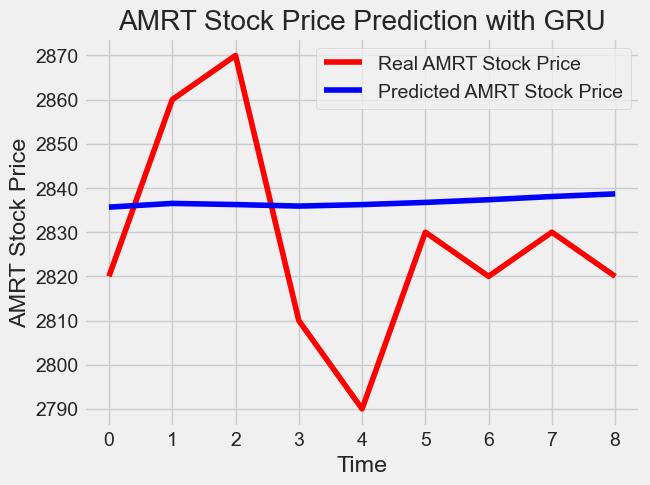

In [1045]:
dataset_total = pd.concat((AMRT["close"]["2024-07-01":"2024-07-19"],AMRT["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMRT', AMRT_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\73124917.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


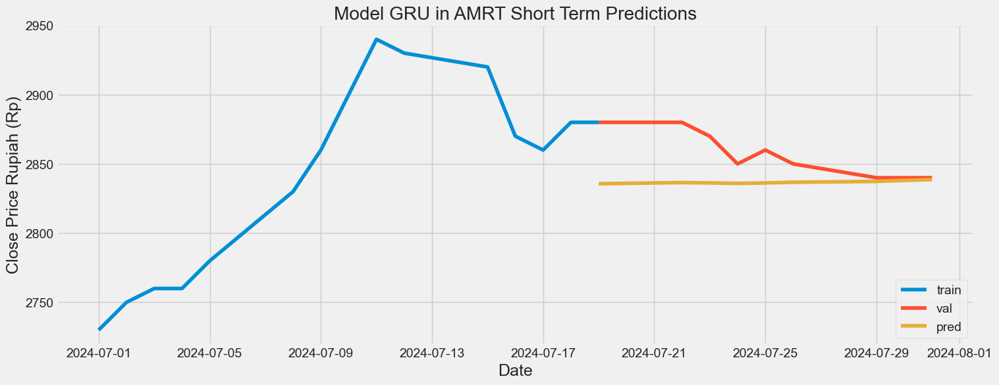

In [1046]:
# Visualize the data
# Plot the data
train = AMRT["2024-07-01":"2024-07-19"]
valid = AMRT["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMRT Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1047]:
# Evaluating the sequence

rmse = return_rmse(AMRT_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 24.733071706754583.
The root mean squared error after normalization is 0.30916339633443274.


#### RNN Predictions

In [1048]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 18ms/step - loss: 0.2937 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1754 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1095 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1163 - accuracy: 0.0000e+00
Epoch 5/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1787 - accuracy: 0.0000e+00
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.3080 - accuracy: 0.0000e+00
Epoch 7/50
1/1 [==============================] - 0s 15ms/step - loss: 0.2298 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1662 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.2849 - accuracy: 0.0000e+00
Epoch 10/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1647 - accuracy: 0.1000
Epoch

1/1 [==============================] - 0s 66ms/step


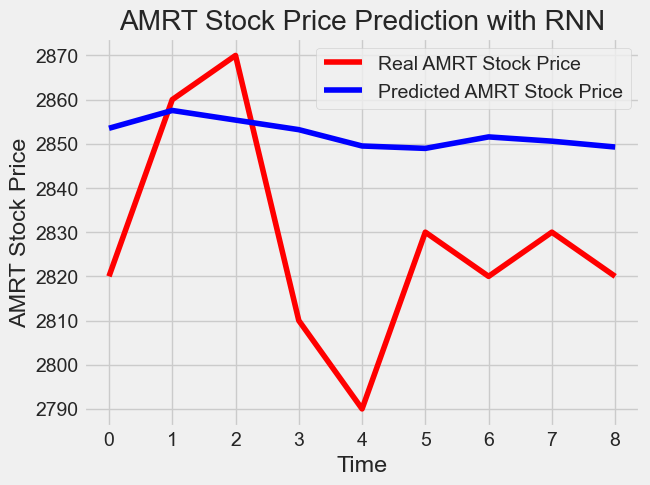

In [1049]:
dataset_total = pd.concat((AMRT["close"]["2024-07-01":"2024-07-19"],AMRT["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMRT', AMRT_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\486554037.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


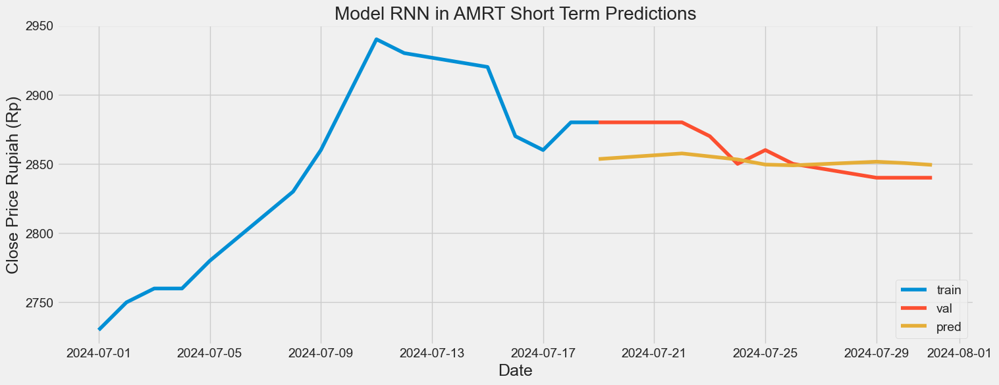

In [1050]:
# Visualize the data
# Plot the data
train = AMRT["2024-07-01":"2024-07-19"]
valid = AMRT["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMRT Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1051]:
# Evaluating the sequence
rmse = return_rmse(AMRT_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 32.29897304508372.
The root mean squared error after normalization is 0.40373716306354895.


### ASII

In [1052]:
ASII.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,ASII,6925,6925,6775,6875,15008600
2020-01-03,ASII,6875,6950,6825,6950,19068800
2020-01-06,ASII,6950,6900,6750,6750,22261900
2020-01-07,ASII,6750,6825,6675,6775,27963000
2020-01-08,ASII,6775,6825,6700,6775,15150400


#### Data Split

In [1053]:
ASII_short_train = ASII["2024-07-01":"2024-07-19"].iloc[:,3:4].values
ASII_short_test = ASII["2024-07-19":"2024-07-31"].iloc[:,3:4].values

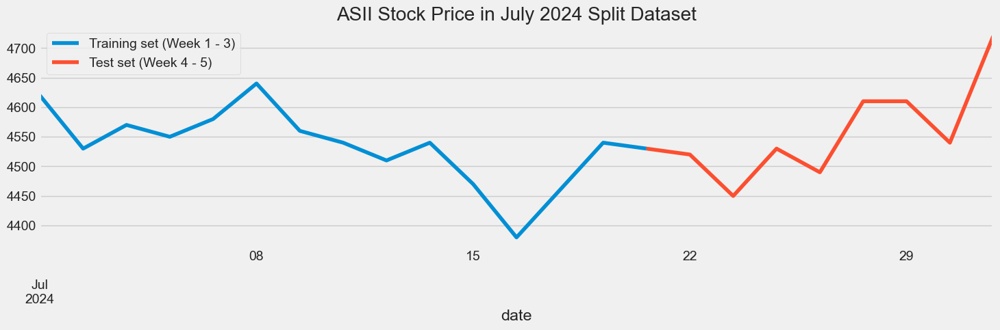

In [1054]:
ASII["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
ASII["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('ASII Stock Price in July 2024 Split Dataset')
plt.show()

In [1055]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ASII_short_train)
len_train = len(ASII_short_train)
len_test = len(ASII_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [1056]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0914
Epoch 2/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0855
Epoch 3/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0852
Epoch 4/50
1/1 [==============================] - 0s 25ms/step - loss: 0.1002
Epoch 5/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0921
Epoch 6/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1101
Epoch 7/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0976
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0971
Epoch 9/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1037
Epoch 10/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0860
Epoch 11/50
1/1 [==============================] - 0s 31ms/step - loss: 0.1250
Epoch 12/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0985
Epoch 13/50
1/1 [==============================] - 0s 23ms/st

1/1 [==============================] - 0s 57ms/step


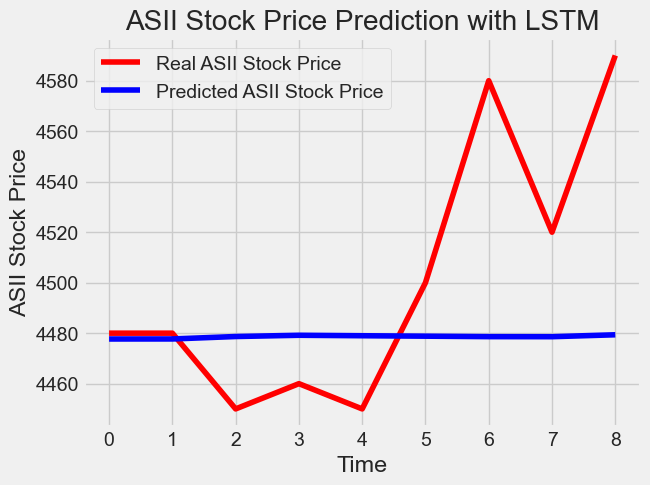

In [1057]:
dataset_total = pd.concat((ASII["close"]["2024-07-01":"2024-07-19"],ASII["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ASII', ASII_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2824440461.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


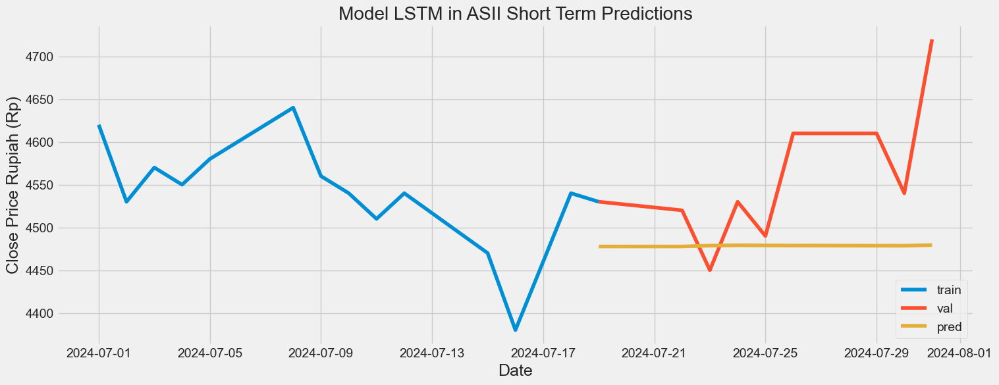

In [1058]:
# Visualize the data
# Plot the data
train = ASII["2024-07-01":"2024-07-19"]
valid = ASII["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ASII Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1059]:
# Evaluating the sequence
rmse = return_rmse(ASII_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 54.48765362532694.
The root mean squared error after normalization is 0.3891975258951925.


#### GRU Predictions

In [1060]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 27ms/step - loss: 0.0900
Epoch 2/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0995
Epoch 3/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1054
Epoch 4/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0974
Epoch 5/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0895
Epoch 6/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0936
Epoch 7/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0997
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1048
Epoch 9/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0860
Epoch 10/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1014
Epoch 11/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0888
Epoch 12/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0929
Epoch 13/50
1/1 [==============================] - 0s 22ms/st

1/1 [==============================] - 0s 58ms/step


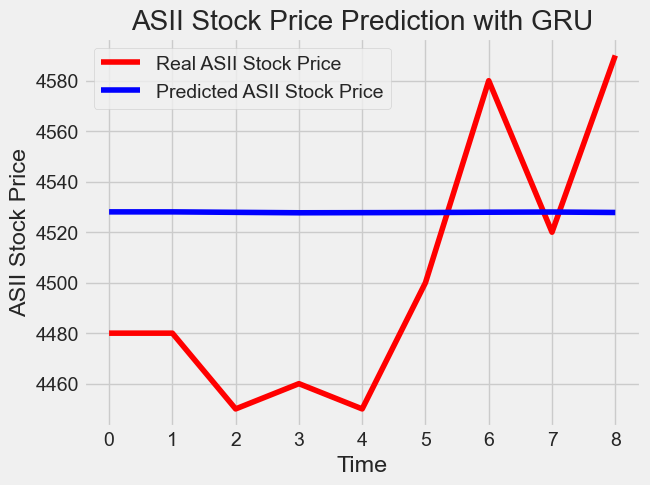

In [1061]:
dataset_total = pd.concat((ASII["close"]["2024-07-01":"2024-07-19"],ASII["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('ASII', ASII_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\864325195.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


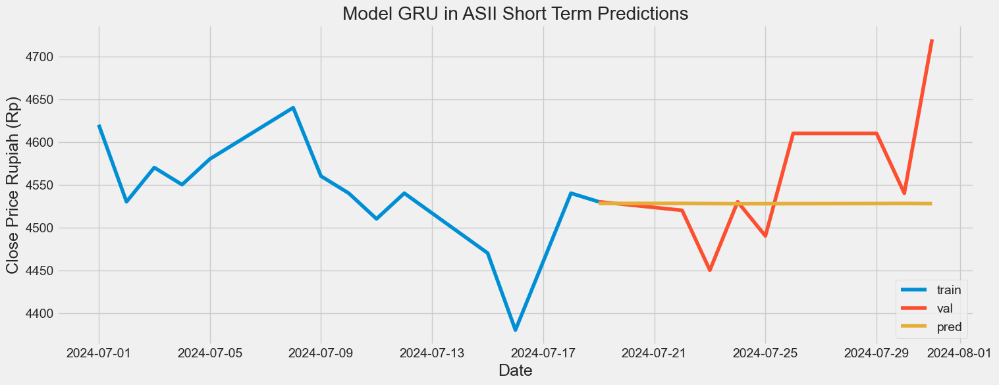

In [1062]:
# Visualize the data
# Plot the data
train = ASII["2024-07-01":"2024-07-19"]
valid = ASII["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ASII Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1063]:
# Evaluating the sequence

rmse = return_rmse(ASII_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 56.489536470382866.
The root mean squared error after normalization is 0.40349668907416353.


#### RNN Predictions

In [1064]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1422 - accuracy: 0.2000
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.2330 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1885 - accuracy: 0.1000
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1367 - accuracy: 0.1000
Epoch 5/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1588 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0653 - accuracy: 0.2000
Epoch 7/50
1/1 [==============================] - 0s 16ms/step - loss: 0.2234 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0918 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1468 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1925 - accuracy: 0.1000
Epoch 11/50
1/1 [========

1/1 [==============================] - 0s 56ms/step


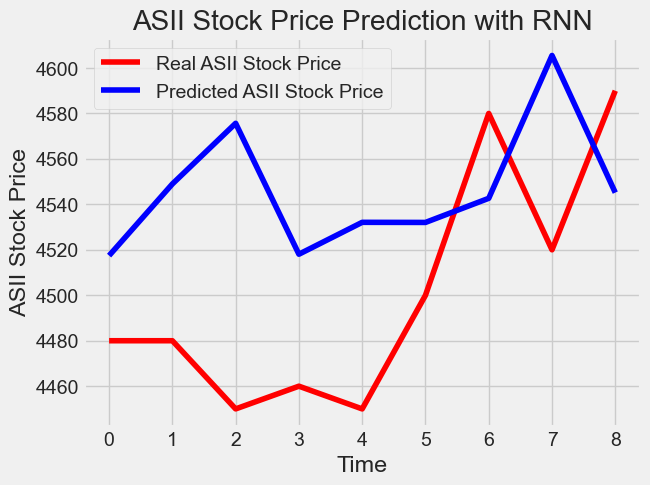

In [1065]:
dataset_total = pd.concat((ASII["close"]["2024-07-01":"2024-07-19"],ASII["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('ASII', ASII_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\203231731.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


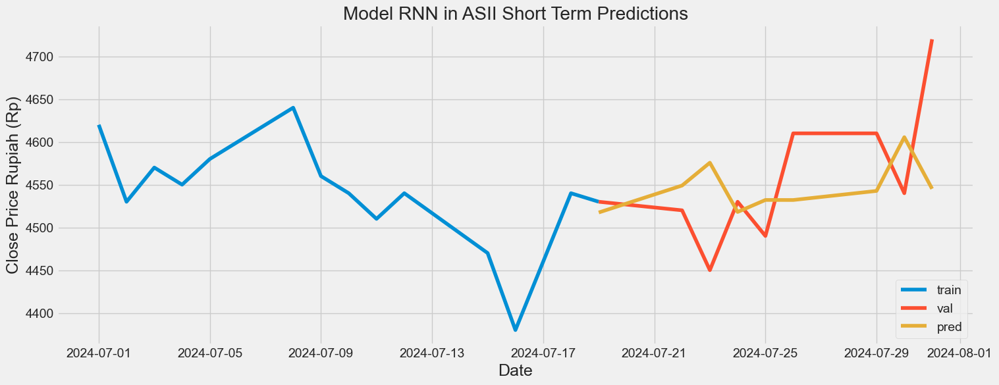

In [1066]:
# Visualize the data
# Plot the data
train = ASII["2024-07-01":"2024-07-19"]
valid = ASII["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ASII Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1067]:
# Evaluating the sequence
rmse = return_rmse(ASII_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 69.77087426129827.
The root mean squared error after normalization is 0.4486168598150752.


### GOTO

In [1068]:
GOTO.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2022-04-11,GOTO,338,416,372,382,9410897000
2022-04-12,GOTO,382,442,360,370,3887331000
2022-04-13,GOTO,370,380,360,374,3262811400
2022-04-14,GOTO,374,382,374,376,3675981900
2022-04-18,GOTO,376,380,370,378,2660312700


#### Data Split

In [1069]:
GOTO_short_train = GOTO["2024-07-01":"2024-07-19"].iloc[:,3:4].values
GOTO_short_test = GOTO["2024-07-19":"2024-07-31"].iloc[:,3:4].values

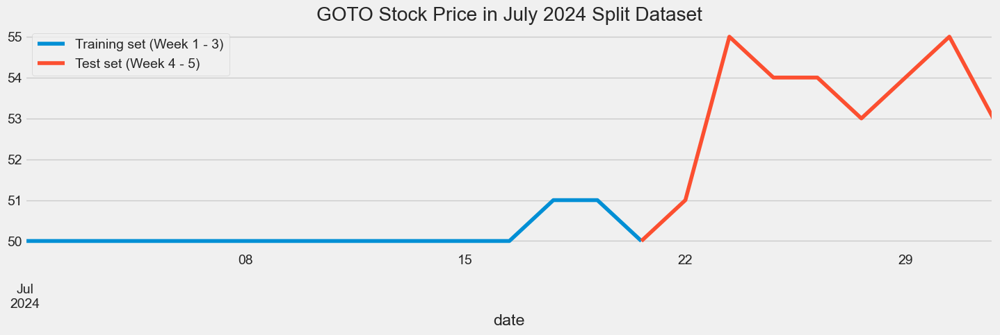

In [1070]:
GOTO["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
GOTO["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('GOTO Stock Price in July 2024 Split Dataset')
plt.show()

In [1071]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(GOTO_short_train)
len_train = len(GOTO_short_train)
len_test = len(GOTO_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predicitions

In [1072]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.3400
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1433
Epoch 3/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1246
Epoch 4/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1020
Epoch 5/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0715
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0625
Epoch 7/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0549
Epoch 8/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0446
Epoch 9/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0357
Epoch 10/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0329
Epoch 11/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0291
Epoch 12/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0241
Epoch 13/50
1/1 [==============================] - 0s 20ms/st

1/1 [==============================] - 0s 42ms/step


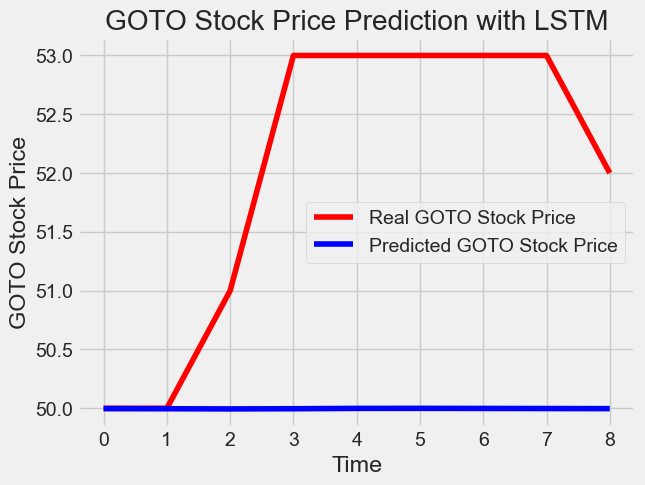

In [1073]:
dataset_total = pd.concat((GOTO["close"]["2024-07-01":"2024-07-19"],GOTO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('GOTO', GOTO_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3123027224.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


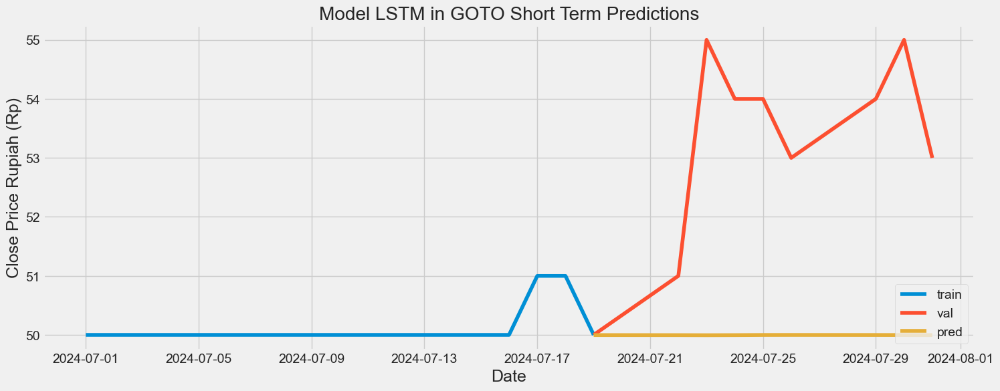

In [1074]:
# Visualize the data
# Plot the data
train = GOTO["2024-07-01":"2024-07-19"]
valid = GOTO["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in GOTO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1075]:
# Evaluating the sequence
rmse = return_rmse(GOTO_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 2.358780252458401.
The root mean squared error after normalization is 0.7848708474233529.


#### GRU Predictions

In [1076]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.3192
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.2224
Epoch 3/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1499
Epoch 4/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0624
Epoch 5/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0188
Epoch 6/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0020
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0211
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0586
Epoch 9/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0907
Epoch 10/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1210
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0859
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0908
Epoch 13/50
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 1s 717ms/step


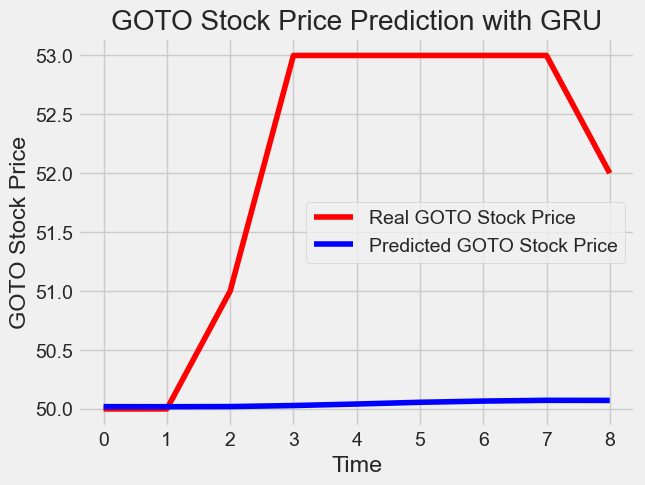

In [1077]:
dataset_total = pd.concat((GOTO["close"]["2024-07-01":"2024-07-19"],GOTO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('GOTO', GOTO_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1326391635.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


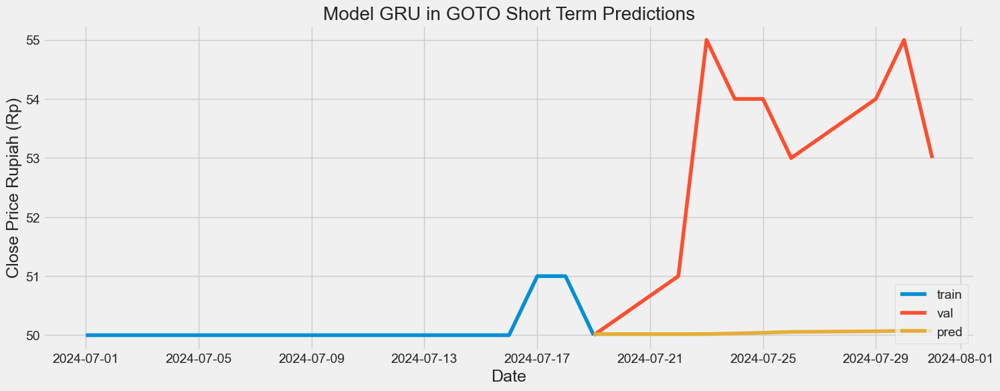

In [1078]:
# Visualize the data
# Plot the data
train = GOTO["2024-07-01":"2024-07-19"]
valid = GOTO["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in GOTO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1079]:
# Evaluating the sequence

rmse = return_rmse(GOTO_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 2.311791311118158.
The root mean squared error after normalization is 0.7705971037060516.


#### RNN Predictions

In [1080]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 19ms/step - loss: 0.3293 - accuracy: 0.2000
Epoch 2/50
1/1 [==============================] - 0s 16ms/step - loss: 0.2313 - accuracy: 0.6000
Epoch 3/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1941 - accuracy: 0.6000
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1194 - accuracy: 1.0000
Epoch 5/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1016 - accuracy: 0.9000
Epoch 6/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0681 - accuracy: 1.0000
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0017 - accuracy: 1.0000
Epoch 8/50
1/1 [==============================] - 0s 15ms/step - loss: 0.0294 - accuracy: 1.0000
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0257 - accuracy: 1.0000
Epoch 10/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0311 - accuracy: 1.0000
Epoch 11/50
1/1 [============

1/1 [==============================] - 0s 45ms/step


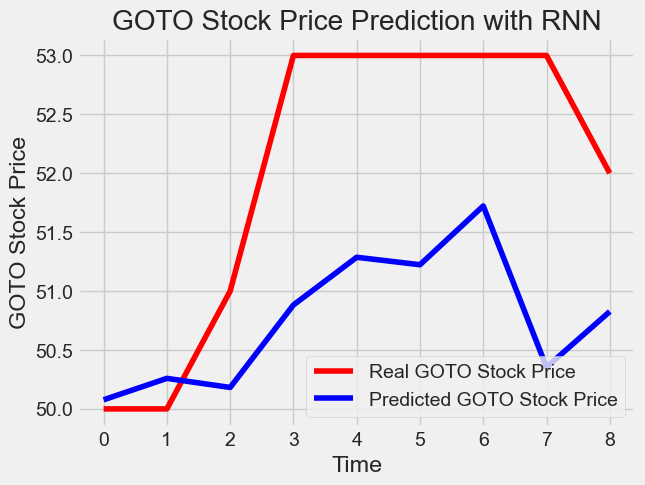

In [1081]:
dataset_total = pd.concat((GOTO["close"]["2024-07-01":"2024-07-19"],GOTO["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('GOTO', GOTO_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\97400756.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


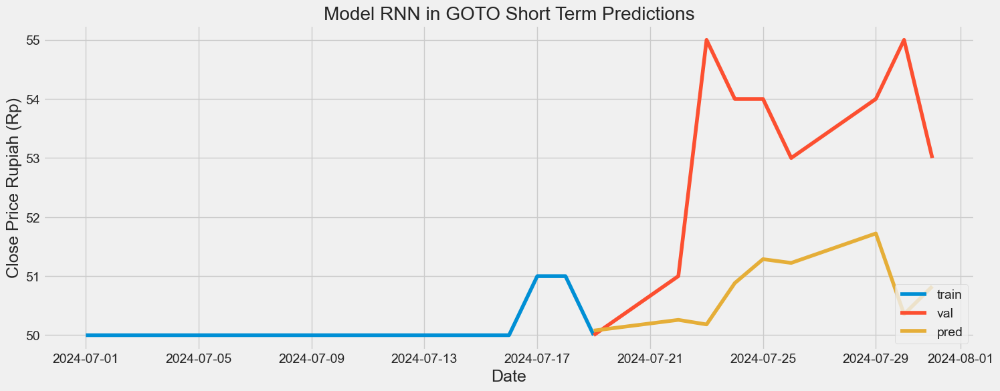

In [1082]:
# Visualize the data
# Plot the data
train = GOTO["2024-07-01":"2024-07-19"]
valid = GOTO["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in GOTO Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1083]:
# Evaluating the sequence
rmse = return_rmse(GOTO_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 1.5392993051906194.
The root mean squared error after normalization is 0.5130997683968719.


### KLBF

In [1084]:
KLBF.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,KLBF,1620,1635,1600,1615,14075700
2020-01-03,KLBF,1615,1635,1610,1635,20606000
2020-01-06,KLBF,1635,1640,1615,1640,10231400
2020-01-07,KLBF,1640,1635,1600,1635,17153100
2020-01-08,KLBF,1635,1615,1585,1585,11666700


#### Data Split

In [1085]:
KLBF_short_train = KLBF["2024-07-01":"2024-07-19"].iloc[:,3:4].values
KLBF_short_test = KLBF["2024-07-19":"2024-07-31"].iloc[:,3:4].values

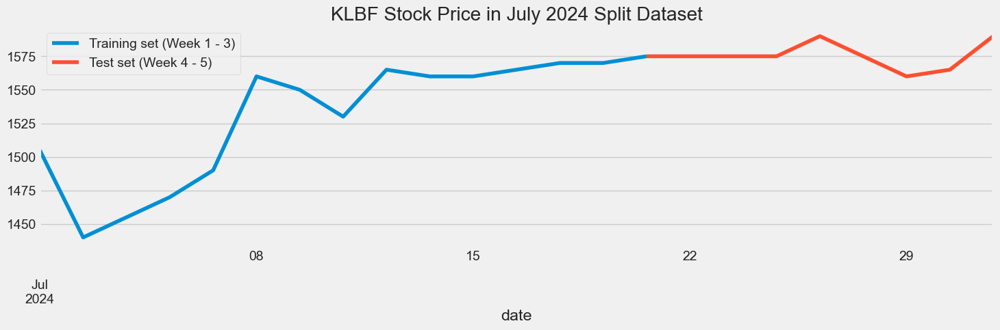

In [1086]:
KLBF["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
KLBF["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('KLBF Stock Price in July 2024 Split Dataset')
plt.show()

In [1087]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(KLBF_short_train)
len_train = len(KLBF_short_train)
len_test = len(KLBF_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [1088]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.7846
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.6613
Epoch 3/50
1/1 [==============================] - 0s 18ms/step - loss: 0.5862
Epoch 4/50
1/1 [==============================] - 0s 20ms/step - loss: 0.5134
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.4305
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.3489
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.2732
Epoch 8/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1921
Epoch 9/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1333
Epoch 10/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0956
Epoch 11/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0476
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0149
Epoch 13/50
1/1 [==============================] - 0s 19ms/st

1/1 [==============================] - 0s 51ms/step


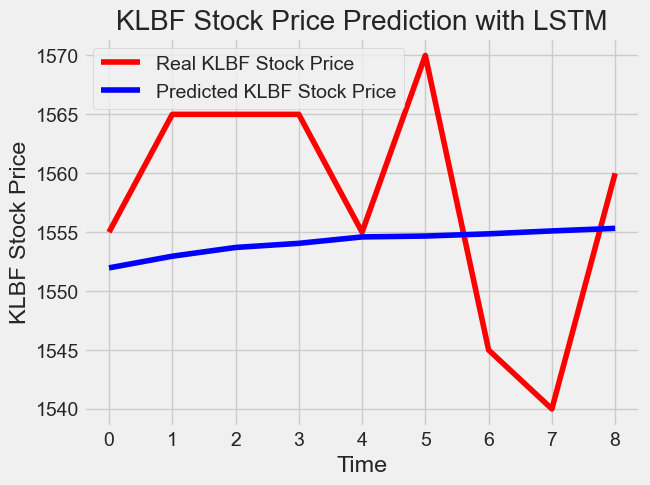

In [1089]:
dataset_total = pd.concat((KLBF["close"]["2024-07-01":"2024-07-19"],KLBF["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('KLBF', KLBF_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\340080784.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


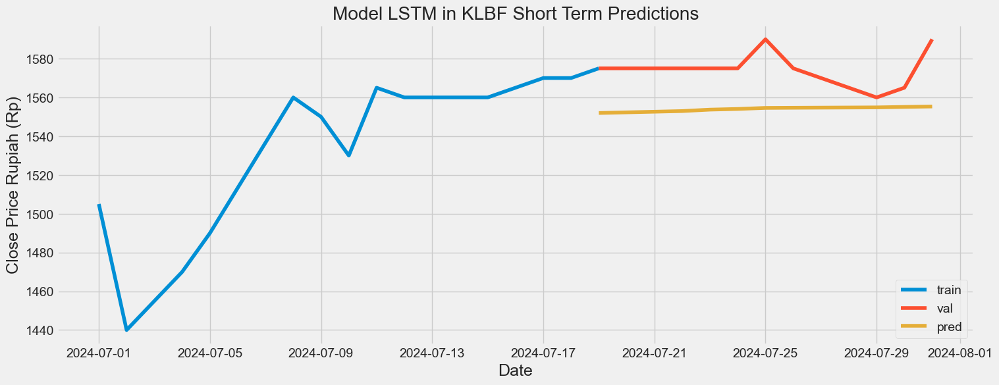

In [1090]:
# Visualize the data
# Plot the data
train = KLBF["2024-07-01":"2024-07-19"]
valid = KLBF["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in KLBF Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1091]:
# Evaluating the sequence
rmse = return_rmse(KLBF_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 10.45602803680009.
The root mean squared error after normalization is 0.34853426789333514.


#### GRU Predictions

In [1092]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.7539
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.6668
Epoch 3/50
1/1 [==============================] - 0s 21ms/step - loss: 0.5009
Epoch 4/50
1/1 [==============================] - 0s 23ms/step - loss: 0.3378
Epoch 5/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1770
Epoch 6/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0606
Epoch 7/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0217
Epoch 8/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0234
Epoch 9/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0842
Epoch 10/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1438
Epoch 11/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1615
Epoch 12/50
1/1 [==============================] - 0s 21ms/step - loss: 0.2085
Epoch 13/50
1/1 [==============================] - 0s 20ms/st

1/1 [==============================] - 0s 61ms/step


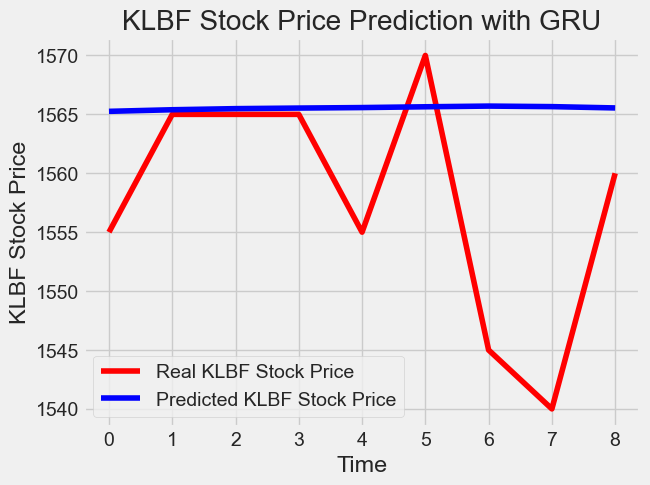

In [1093]:
dataset_total = pd.concat((KLBF["close"]["2024-07-01":"2024-07-19"],KLBF["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('KLBF', KLBF_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2049848409.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


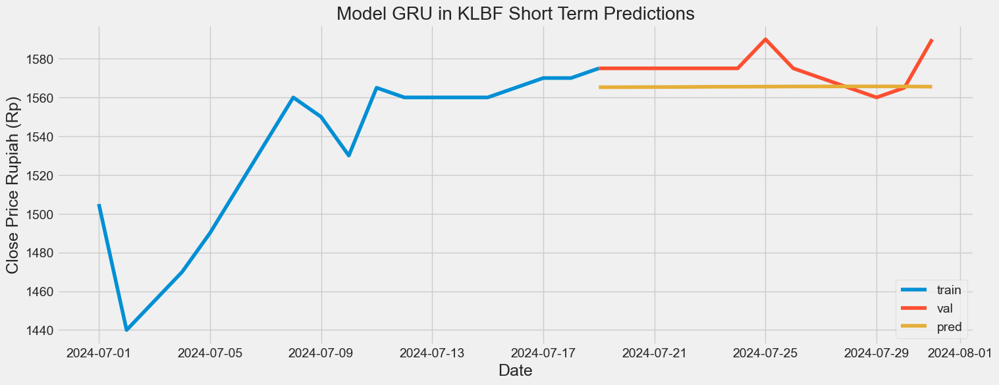

In [1094]:
# Visualize the data
# Plot the data
train = KLBF["2024-07-01":"2024-07-19"]
valid = KLBF["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in KLBF Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1095]:
# Evaluating the sequence

rmse = return_rmse(KLBF_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 12.267074605871766.
The root mean squared error after normalization is 0.4089024868623912.


#### RNN Predictions

In [1096]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 16ms/step - loss: 0.5122 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 14ms/step - loss: 0.3520 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 16ms/step - loss: 0.3159 - accuracy: 0.0000e+00
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.4314 - accuracy: 0.0000e+00
Epoch 5/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1237 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1062 - accuracy: 0.0000e+00
Epoch 7/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1655 - accuracy: 0.1000
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0749 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1825 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0471 - accuracy: 0.1000
Epoch 11/

1/1 [==============================] - 0s 49ms/step


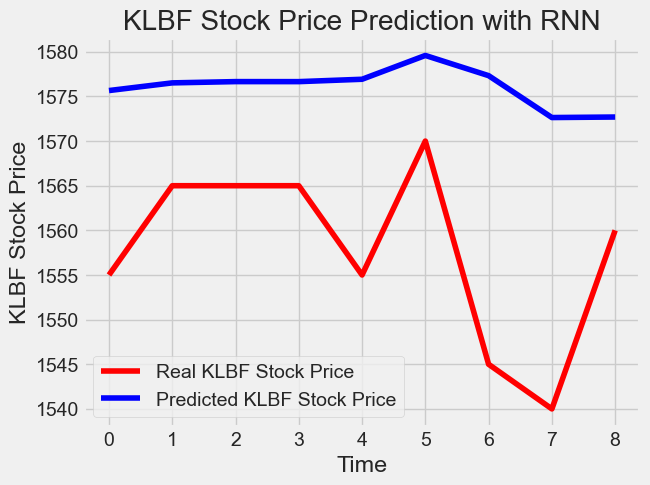

In [1097]:
dataset_total = pd.concat((KLBF["close"]["2024-07-01":"2024-07-19"],KLBF["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('KLBF', KLBF_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3189707113.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


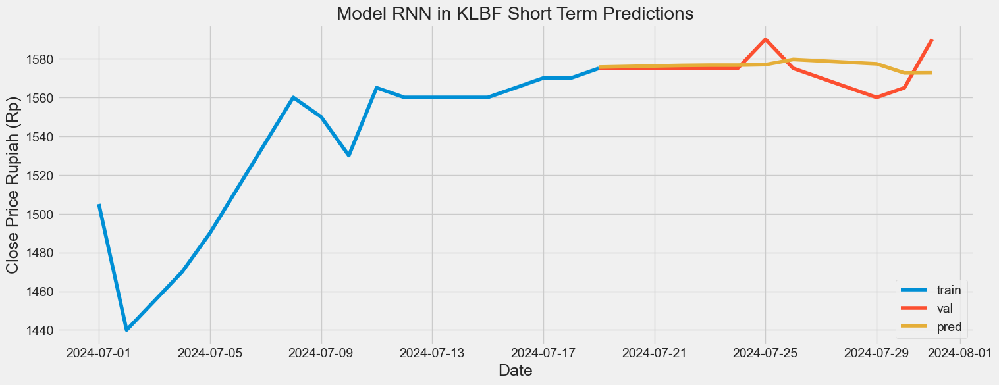

In [1098]:
# Visualize the data
# Plot the data
train = KLBF["2024-07-01":"2024-07-19"]
valid = KLBF["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in KLBF Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1099]:
# Evaluating the sequence
rmse = return_rmse(KLBF_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 20.208168976564366.
The root mean squared error after normalization is 0.5104350622406603.


### MAPI

In [1100]:
MAPI.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,MAPI,1055,1070,1035,1065,8012800
2020-01-03,MAPI,1065,1070,1050,1070,6591500
2020-01-06,MAPI,1070,1070,1040,1055,5459500
2020-01-07,MAPI,1055,1065,1045,1055,5688100
2020-01-08,MAPI,1055,1060,1030,1035,11561800


#### Data Split

In [1101]:
MAPI_short_train = MAPI["2024-07-01":"2024-07-19"].iloc[:,3:4].values
MAPI_short_test = MAPI["2024-07-19":"2024-07-31"].iloc[:,3:4].values

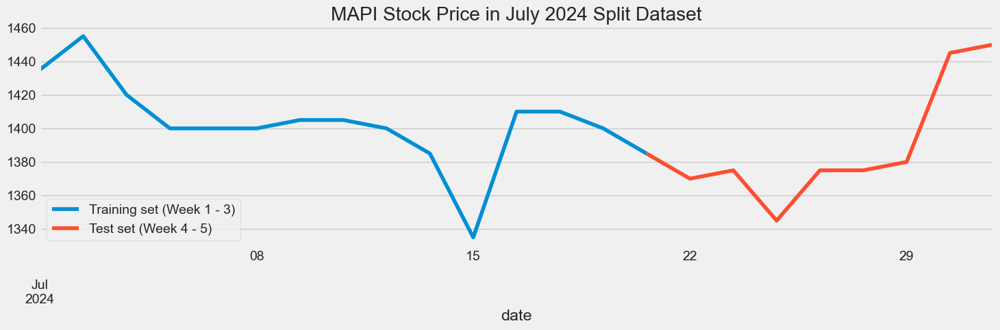

In [1102]:
MAPI["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
MAPI["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('MAPI Stock Price in July 2024 Split Dataset')
plt.show()

In [1103]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(MAPI_short_train)
len_train = len(MAPI_short_train)
len_test = len(MAPI_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [1104]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.2103
Epoch 2/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0872
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0706
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0508
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0545
Epoch 6/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0503
Epoch 7/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0509
Epoch 8/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0561
Epoch 9/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0561
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0630
Epoch 11/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0649
Epoch 12/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0581
Epoch 13/50
1/1 [==============================] - 0s 19ms/st

1/1 [==============================] - 0s 51ms/step


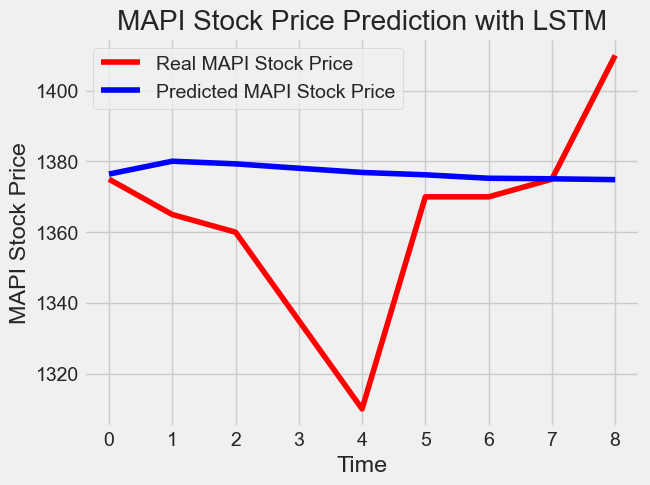

In [1105]:
dataset_total = pd.concat((MAPI["close"]["2024-07-01":"2024-07-19"],MAPI["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('MAPI', MAPI_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3767520715.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


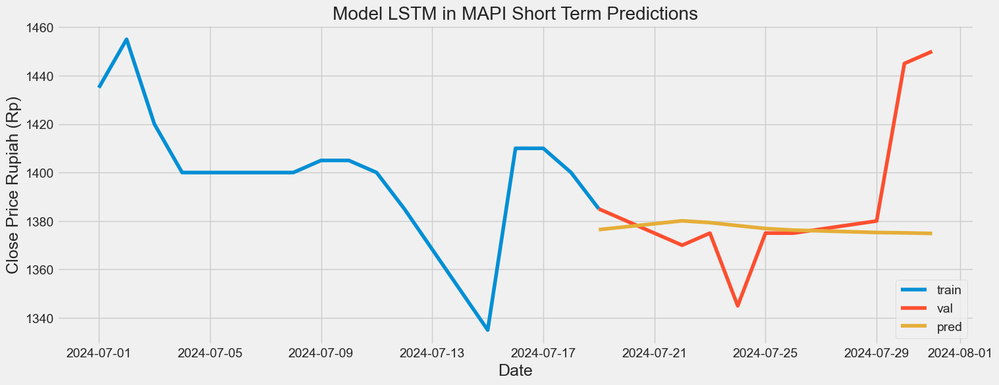

In [1106]:
# Visualize the data
# Plot the data
train = MAPI["2024-07-01":"2024-07-19"]
valid = MAPI["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in MAPI Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1107]:
# Evaluating the sequence
rmse = return_rmse(MAPI_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 30.251451151214336.
The root mean squared error after normalization is 0.30251451151214354.


#### GRU Predictions

In [1108]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 23ms/step - loss: 0.2130
Epoch 2/50
1/1 [==============================] - 0s 22ms/step - loss: 0.2052
Epoch 3/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1692
Epoch 4/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1408
Epoch 5/50
1/1 [==============================] - 0s 24ms/step - loss: 0.1010
Epoch 6/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0740
Epoch 7/50
1/1 [==============================] - 0s 26ms/step - loss: 0.0668
Epoch 8/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0615
Epoch 9/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0523
Epoch 10/50
1/1 [==============================] - 0s 24ms/step - loss: 0.0545
Epoch 11/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0678
Epoch 12/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0692
Epoch 13/50
1/1 [==============================] - 0s 23ms/st

1/1 [==============================] - 0s 27ms/step - loss: 0.0665
Epoch 31/50
1/1 [==============================] - 0s 27ms/step - loss: 0.0636
Epoch 32/50
1/1 [==============================] - 0s 25ms/step - loss: 0.0681
Epoch 33/50
1/1 [==============================] - 0s 29ms/step - loss: 0.0634
Epoch 34/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0654
Epoch 35/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0652
Epoch 36/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0558
Epoch 37/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0622
Epoch 38/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0546
Epoch 39/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0543
Epoch 40/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0591
Epoch 41/50
1/1 [==============================] - 0s 23ms/step - loss: 0.0558
Epoch 42/50
1/1 [==============================] - 0s 26ms/step 

1/1 [==============================] - 0s 43ms/step


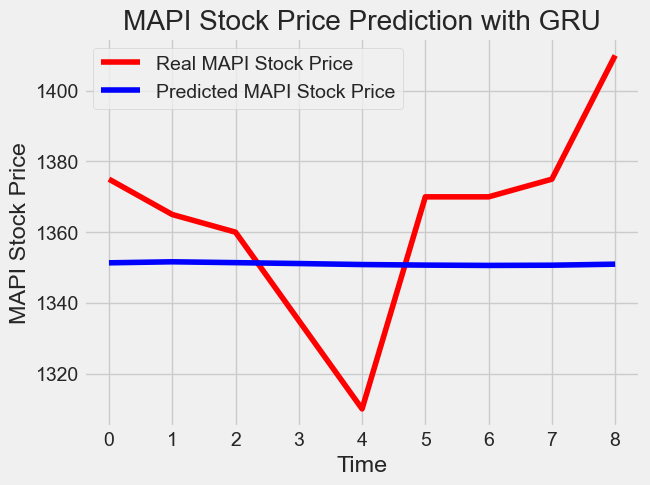

In [1109]:
dataset_total = pd.concat((MAPI["close"]["2024-07-01":"2024-07-19"],MAPI["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('MAPI', MAPI_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1285455158.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


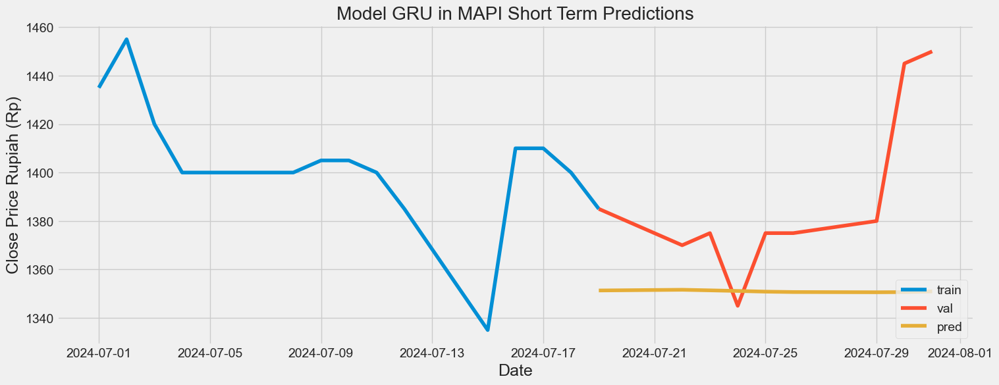

In [1110]:
# Visualize the data
# Plot the data
train = MAPI["2024-07-01":"2024-07-19"]
valid = MAPI["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in MAPI Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1111]:
# Evaluating the sequence

rmse = return_rmse(MAPI_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 29.003934290223388.
The root mean squared error after normalization is 0.2900393429022338.


#### RNN Predictions

In [1112]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 22ms/step - loss: 0.3254 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 21ms/step - loss: 0.2524 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0938 - accuracy: 0.2000
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0957 - accuracy: 0.2000
Epoch 5/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1085 - accuracy: 0.1000
Epoch 6/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1320 - accuracy: 0.2000
Epoch 7/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1263 - accuracy: 0.2000
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1413 - accuracy: 0.1000
Epoch 9/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1224 - accuracy: 0.2000
Epoch 10/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1225 - accuracy: 0.1000
Epoch 11/50
1/1 [====

1/1 [==============================] - 0s 48ms/step


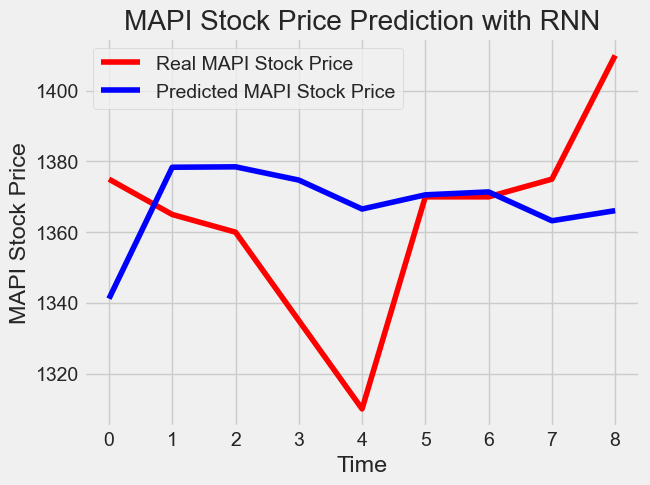

In [1113]:
dataset_total = pd.concat((MAPI["close"]["2024-07-01":"2024-07-19"],MAPI["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('MAPI', MAPI_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3191121687.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


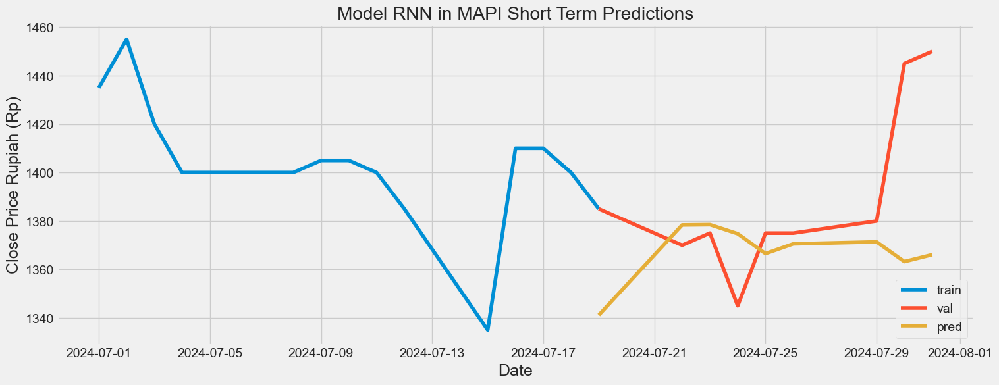

In [1114]:
# Visualize the data
# Plot the data
train = MAPI["2024-07-01":"2024-07-19"]
valid = MAPI["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in MAPI Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1115]:
# Evaluating the sequence
rmse = return_rmse(MAPI_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 30.749101082536495.
The root mean squared error after normalization is 0.3074910108253651.


### TLKM

In [1116]:
TLKM.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,TLKM,3970,4000,3900,3910,52094000
2020-01-03,TLKM,3910,3980,3930,3980,70032900
2020-01-06,TLKM,3980,3970,3930,3960,42908900
2020-01-07,TLKM,3960,3970,3920,3940,51837600
2020-01-08,TLKM,3940,3950,3900,3900,52402600


#### Data Split

In [1117]:
TLKM_short_train = TLKM["2024-07-01":"2024-07-19"].iloc[:,3:4].values
TLKM_short_test = TLKM["2024-07-19":"2024-07-31"].iloc[:,3:4].values

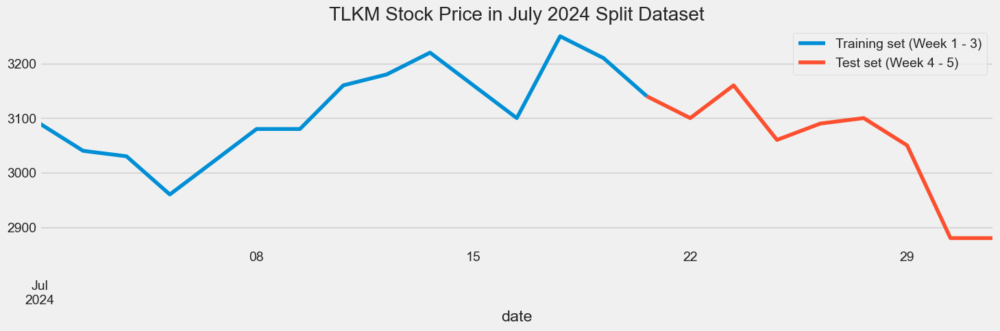

In [1118]:
TLKM["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
TLKM["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('TLKM Stock Price in July 2024 Split Dataset')
plt.show()

In [1119]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_short_train)
len_train = len(TLKM_short_train)
len_test = len(TLKM_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [1120]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1152
Epoch 2/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0646
Epoch 3/50
1/1 [==============================] - 0s 17ms/step - loss: 0.0544
Epoch 4/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0734
Epoch 5/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0554
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0644
Epoch 7/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0395
Epoch 8/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0541
Epoch 9/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0607
Epoch 10/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0687
Epoch 11/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0742
Epoch 12/50
1/1 [==============================] - 0s 19ms/step - loss: 0.0680
Epoch 13/50
1/1 [==============================] - 0s 17ms/st

1/1 [==============================] - 0s 44ms/step


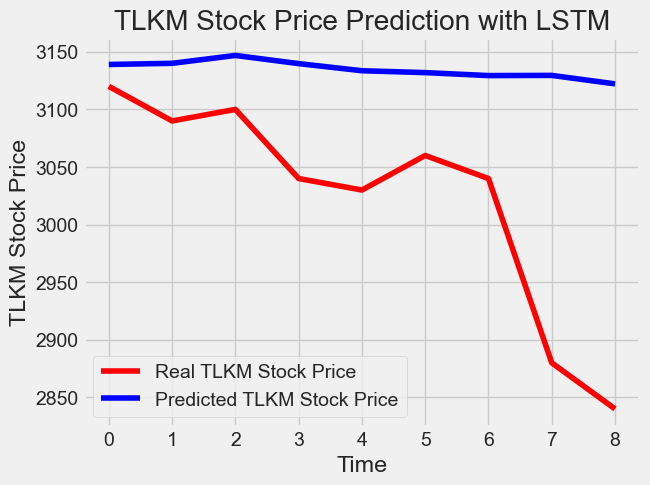

In [1121]:
dataset_total = pd.concat((TLKM["close"]["2024-07-01":"2024-07-19"],TLKM["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('TLKM', TLKM_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3926882567.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


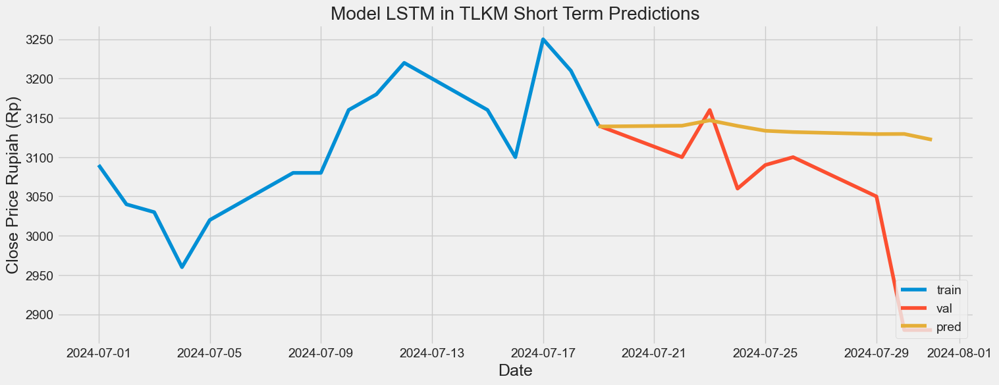

In [1122]:
# Visualize the data
# Plot the data
train = TLKM["2024-07-01":"2024-07-19"]
valid = TLKM["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in TLKM Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1123]:
# Evaluating the sequence
rmse = return_rmse(TLKM_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 141.7269496391292.
The root mean squared error after normalization is 0.4618922624488176.


#### GRU Predictions

In [1124]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1170
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1055
Epoch 3/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1028
Epoch 4/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0837
Epoch 5/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0849
Epoch 6/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0785
Epoch 7/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0743
Epoch 8/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0642
Epoch 9/50
1/1 [==============================] - 0s 20ms/step - loss: 0.0672
Epoch 10/50
1/1 [==============================] - 0s 22ms/step - loss: 0.0703
Epoch 11/50
1/1 [==============================] - 0s 21ms/step - loss: 0.0622
Epoch 12/50
1/1 [==============================] - 0s 18ms/step - loss: 0.0664
Epoch 13/50
1/1 [==============================] - 0s 20ms/st

1/1 [==============================] - 0s 45ms/step


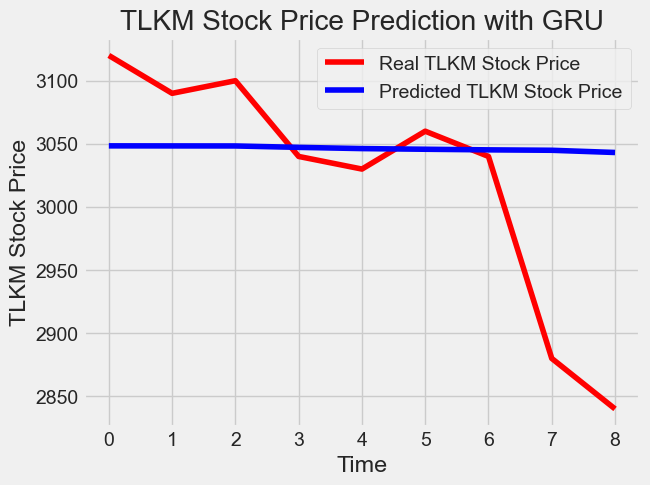

In [1125]:
dataset_total = pd.concat((TLKM["close"]["2024-07-01":"2024-07-19"],TLKM["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('TLKM', TLKM_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2924717384.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


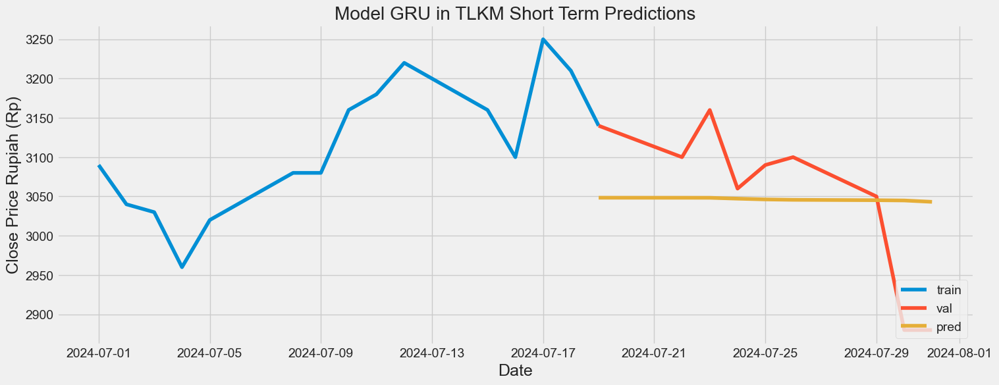

In [1126]:
# Visualize the data
# Plot the data
train = TLKM["2024-07-01":"2024-07-19"]
valid = TLKM["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in TLKM Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1127]:
# Evaluating the sequence

rmse = return_rmse(TLKM_short_test, GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_short_test, GRU_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 93.4127719902699.
The root mean squared error after normalization is 0.3336170428223925.


#### RNN Predictions

In [1128]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1490 - accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1696 - accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1244 - accuracy: 0.0000e+00
Epoch 4/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1341 - accuracy: 0.0000e+00
Epoch 5/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1410 - accuracy: 0.0000e+00
Epoch 6/50
1/1 [==============================] - 0s 16ms/step - loss: 0.1412 - accuracy: 0.0000e+00
Epoch 7/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1056 - accuracy: 0.0000e+00
Epoch 8/50
1/1 [==============================] - 0s 14ms/step - loss: 0.1080 - accuracy: 0.0000e+00
Epoch 9/50
1/1 [==============================] - 0s 14ms/step - loss: 0.0678 - accuracy: 0.1000
Epoch 10/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1239 - accuracy: 0.00

1/1 [==============================] - 0s 46ms/step


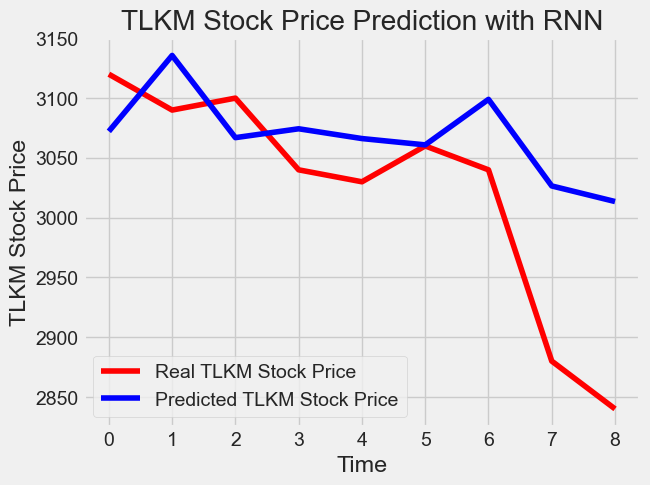

In [1129]:
dataset_total = pd.concat((TLKM["close"]["2024-07-01":"2024-07-19"],TLKM["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('TLKM', TLKM_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\547812793.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


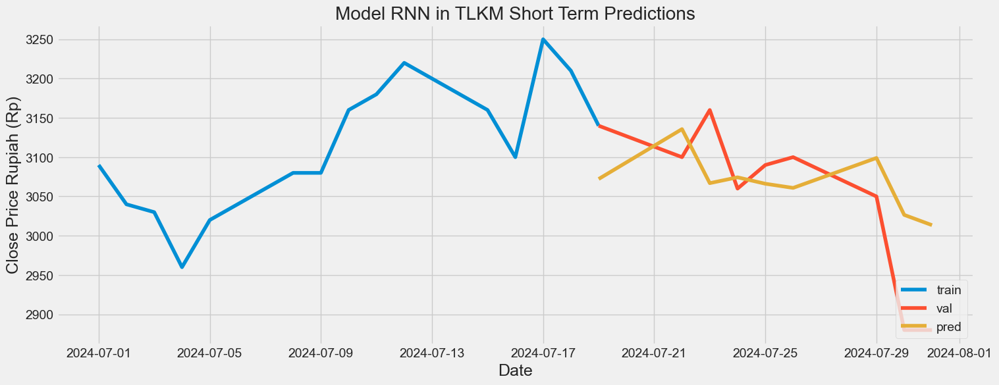

In [1130]:
# Visualize the data
# Plot the data
train = TLKM["2024-07-01":"2024-07-19"]
valid = TLKM["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in TLKM Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1131]:
# Evaluating the sequence
rmse = return_rmse(TLKM_short_test, RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_short_test, RNN_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 83.66265715112775.
The root mean squared error after normalization is 0.2829456304152335.


### BBCA

In [1132]:
BBCA.head()

,stock_code,open,high,low,close,volume
date,,,,,,
2020-01-02,BBCA,33425,33900,33400,33450,9889000
2020-01-03,BBCA,33450,34000,33625,34000,9551100
2020-01-06,BBCA,34000,33750,33450,33675,5460000
2020-01-07,BBCA,33675,33850,33650,33700,9004500
2020-01-08,BBCA,33700,33725,33350,33400,10738500


#### Data Split

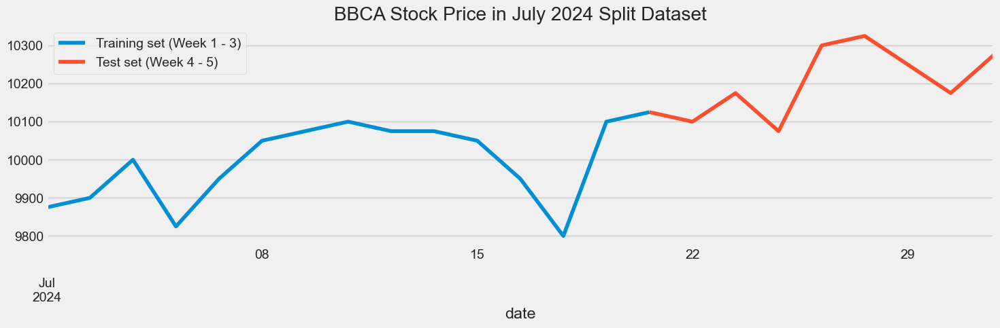

In [1133]:
BBCA_short_train = BBCA["2024-07-01":"2024-07-19"].iloc[:,3:4].values
BBCA_short_test = BBCA["2024-07-19":"2024-07-31"].iloc[:,3:4].values
BBCA["close"]["2024-07-01":"2024-07-19"].plot(figsize=(16,4), legend=True)
BBCA["close"]["2024-07-19":"2024-07-31"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Week 1 - 3)","Test set (Week 4 - 5)"])
plt.title('BBCA Stock Price in July 2024 Split Dataset')
plt.show()

In [1134]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(BBCA_short_train)
len_train = len(BBCA_short_train)
len_test = len(BBCA_short_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 5 timesteps and 1 output
# So for each element of training set, we have 5 previous training set elements 
X_train = []
y_train = []
for i in range(5,len_train):
    X_train.append(training_set_scaled[i-5:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

15 9


#### LSTM Predictions

In [1135]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 24ms/step - loss: 0.1456
Epoch 2/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1361
Epoch 3/50
1/1 [==============================] - 0s 70ms/step - loss: 0.1227
Epoch 4/50
1/1 [==============================] - 0s 31ms/step - loss: 0.1293
Epoch 5/50
1/1 [==============================] - 0s 36ms/step - loss: 0.1148
Epoch 6/50
1/1 [==============================] - 0s 25ms/step - loss: 0.1180
Epoch 7/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1186
Epoch 8/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1059
Epoch 9/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1196
Epoch 10/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1147
Epoch 11/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1017
Epoch 12/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1009
Epoch 13/50
1/1 [==============================] - 0s 19ms/st

1/1 [==============================] - 0s 52ms/step


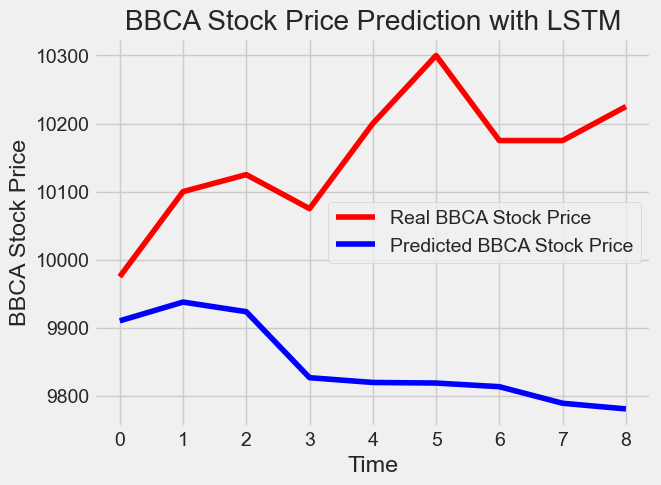

In [1136]:
dataset_total = pd.concat((BBCA["close"]["2024-07-01":"2024-07-19"],BBCA["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('BBCA', BBCA_short_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3878668056.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


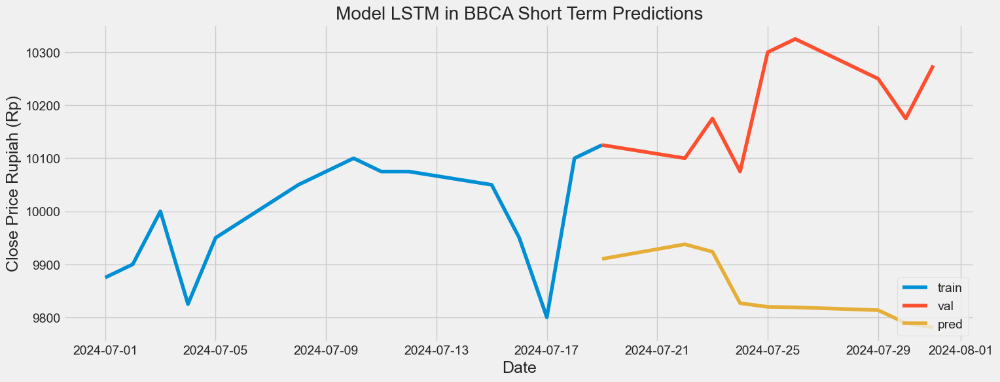

In [1137]:
# Visualize the data
# Plot the data
train = BBCA["2024-07-01":"2024-07-19"]
valid = BBCA["2024-07-19":"2024-07-31"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in BBCA Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1138]:
# Evaluating the sequence
rmse = return_rmse(BBCA_short_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_short_test,LSTM_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('short')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 330.91025554566176.
The root mean squared error after normalization is 0.6374564763535078.


#### GRU Predictions

In [1139]:
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 23ms/step - loss: 0.1253
Epoch 2/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1201
Epoch 3/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1130
Epoch 4/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1086
Epoch 5/50
1/1 [==============================] - 0s 22ms/step - loss: 0.1131
Epoch 6/50
1/1 [==============================] - 0s 21ms/step - loss: 0.1106
Epoch 7/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1142
Epoch 8/50
1/1 [==============================] - 0s 18ms/step - loss: 0.1054
Epoch 9/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1011
Epoch 10/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1131
Epoch 11/50
1/1 [==============================] - 0s 20ms/step - loss: 0.1135
Epoch 12/50
1/1 [==============================] - 0s 19ms/step - loss: 0.1041
Epoch 13/50
1/1 [==============================] - 0s 18ms/st

1/1 [==============================] - 0s 49ms/step


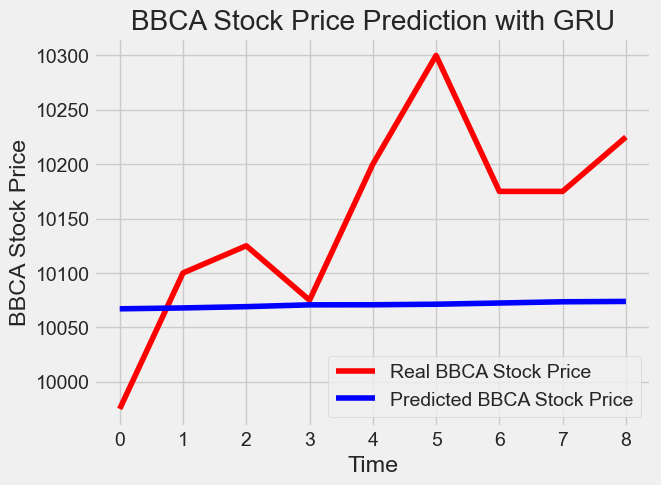

In [1140]:
dataset_total = pd.concat((BBCA["close"]["2024-07-01":"2024-07-19"],BBCA["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('BBCA', BBCA_short_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3182095404.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


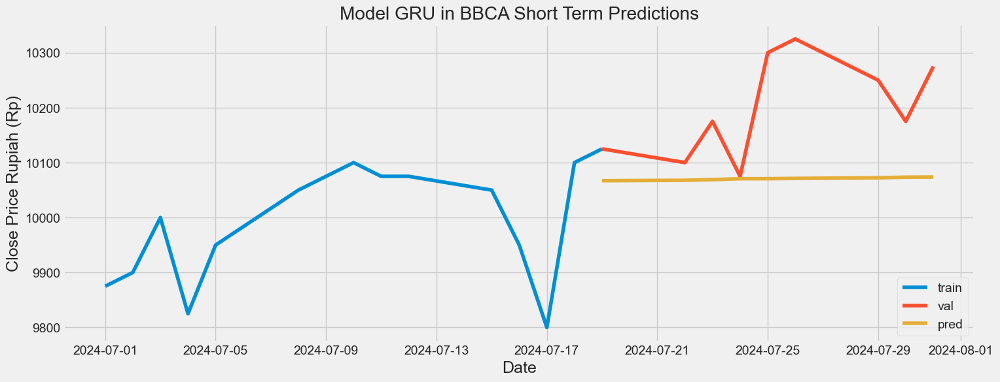

In [1141]:
# Visualize the data
# Plot the data
train = BBCA["2024-07-01":"2024-07-19"]
valid = BBCA["2024-07-19":"2024-07-31"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in BBCA Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1142]:
# Evaluating the sequence
rmse = return_rmse(BBCA_short_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_short_test,GRU_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('short')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 118.02391210649581.
The root mean squared error after normalization is 0.3631504987892176.


#### RNN Predictions

In [1143]:
regressorRNN.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
1/1 [==============================] - 0s 17ms/step - loss: 0.1676 - accuracy: 0.1000
Epoch 2/50
1/1 [==============================] - 0s 16ms/step - loss: 0.0879 - accuracy: 0.2000
Epoch 3/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1205 - accuracy: 0.2000
Epoch 4/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1165 - accuracy: 0.2000
Epoch 5/50
1/1 [==============================] - 0s 15ms/step - loss: 0.1563 - accuracy: 0.3000
Epoch 6/50
1/1 [==============================] - 0s 13ms/step - loss: 0.0841 - accuracy: 0.2000
Epoch 7/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1497 - accuracy: 0.2000
Epoch 8/50
1/1 [==============================] - 0s 13ms/step - loss: 0.1157 - accuracy: 0.3000
Epoch 9/50
1/1 [==============================] - 0s 12ms/step - loss: 0.0521 - accuracy: 0.3000
Epoch 10/50
1/1 [==============================] - 0s 11ms/step - loss: 0.1540 - accuracy: 0.2000
Epoch 11/50
1/1 [============

1/1 [==============================] - 0s 47ms/step


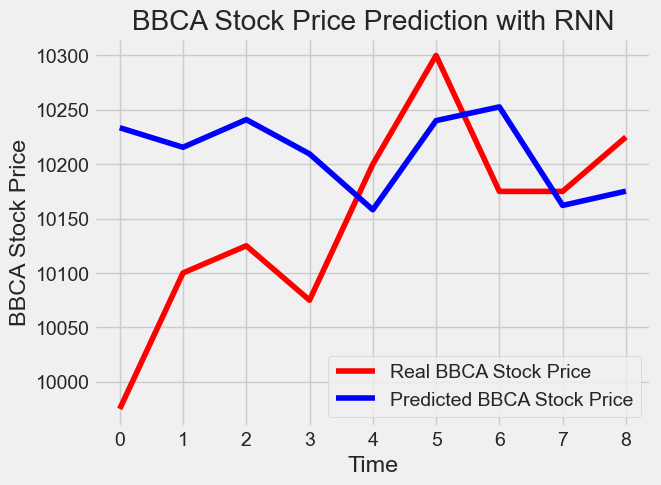

In [1144]:
dataset_total = pd.concat((BBCA["close"]["2024-07-01":"2024-07-19"],BBCA["close"]["2024-07-19":"2024-07-31"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_short_test) - 5:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

X_test = []
for i in range(5,len_test+5):
    X_test.append(inputs[i-5:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('BBCA', BBCA_short_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2328676824.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


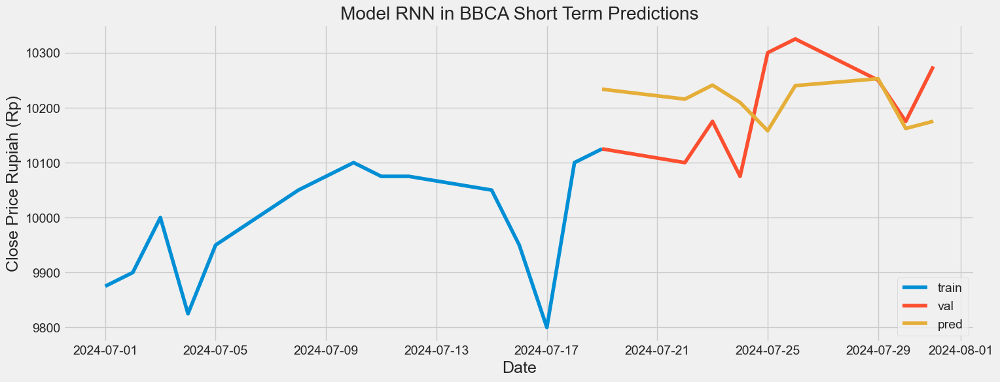

In [1145]:
# Visualize the data
# Plot the data
train = BBCA["2024-07-01":"2024-07-19"]
valid = BBCA["2024-07-19":"2024-07-31"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in BBCA Short Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1146]:
# Evaluating the sequence
rmse = return_rmse(BBCA_short_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_short_test,RNN_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('short')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)

The root mean squared error is 118.22097006730625.
The root mean squared error after normalization is 0.36375683097632655.


## Medium Term Predictions
Medium term prediction using in this program is prediction of the several month in a year.
Data use for this predictions is data in year 2023 because that is the complete one.
Data train and test is:
1. Data Train
    * Month 1 - 9: January - September 2023
2. Data Test
    * Month 10 - 13: Oktober - Desember 2023

### ADRO

#### Data Split

In [1147]:
ADRO_medium_train = ADRO["2023-01":"2023-10-02"].iloc[:,3:4].values
ADRO_medium_test = ADRO["2023-10-02":"2023-12"].iloc[:,3:4].values

##### Plot Train Test Data for ADRO

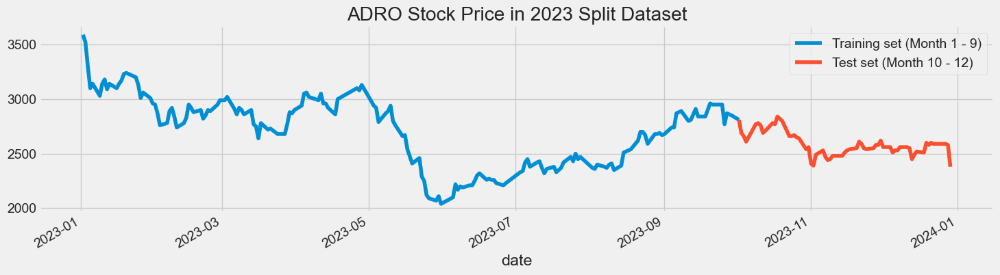

In [1148]:
ADRO["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
ADRO["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('ADRO Stock Price in 2023 Split Dataset')
plt.show()

##### Normalize Dataset

In [1149]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ADRO_medium_train)

##### Count Dataset Split

In [1150]:
len_train = len(ADRO_medium_train)
len_test = len(ADRO_medium_test)
print(len_train, len_test)

177 63


##### 20 Timestep Dataset Preparation

In [1151]:
# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

##### Reshaping

In [1152]:
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [1153]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50


5/5 [==============================] - 8s 37ms/step - loss: 2.3097
Epoch 2/50
5/5 [==============================] - 0s 35ms/step - loss: 0.3116
Epoch 3/50
5/5 [==============================] - 0s 37ms/step - loss: 0.1291
Epoch 4/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0647
Epoch 5/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0583
Epoch 6/50
5/5 [==============================] - 0s 46ms/step - loss: 0.0498
Epoch 7/50
5/5 [==============================] - 0s 46ms/step - loss: 0.0389
Epoch 8/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0389
Epoch 9/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0515
Epoch 10/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0324
Epoch 11/50
5/5 [==============================] - 0s 37ms/step - loss: 0.0340
Epoch 12/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0323
Epoch 13/50
5/5 [==============================] - 0s 41ms/step - loss: 

In [1154]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"]["2023-01":"2023-10-02"],ADRO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [1155]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)

2/2 [==============================] - 3s 14ms/step


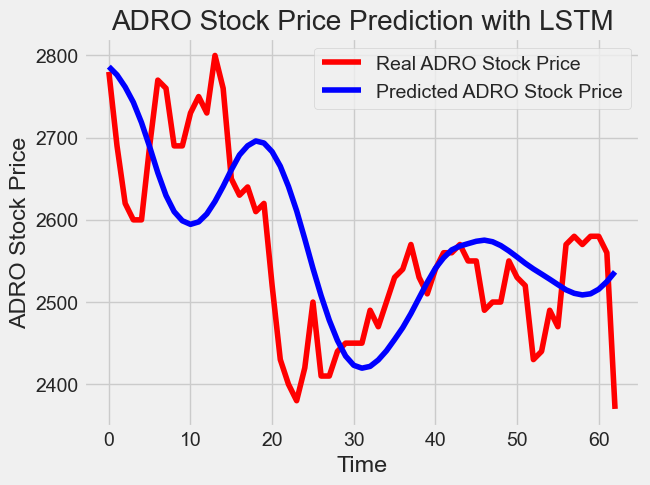

In [1156]:
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ADRO', ADRO_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\773518978.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


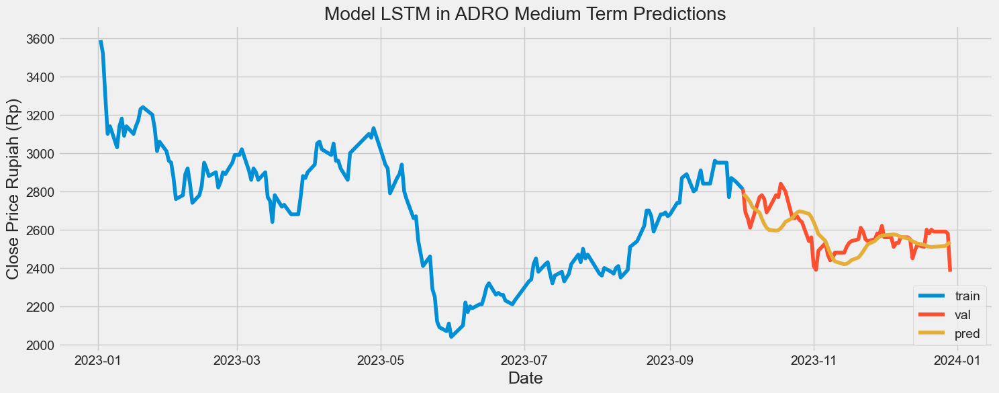

In [1157]:
# Visualize the data
# Plot the data
train = ADRO["2023-01":"2023-10-02"]
valid = ADRO["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ADRO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1158]:
# Evaluating the sequence
rmse = return_rmse(ADRO_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 96.4005488815927.
The root mean squared error after normalization is 0.22418732298044802.


#### GRU Predictions

In [1159]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 8s 35ms/step - loss: 0.0581
Epoch 2/50
2/2 [==============================] - 0s 36ms/step - loss: 0.0508
Epoch 3/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0395
Epoch 4/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0330
Epoch 5/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0308
Epoch 6/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0299
Epoch 7/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0321
Epoch 8/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0311
Epoch 9/50
2/2 [==============================] - 0s 39ms/step - loss: 0.0309
Epoch 10/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0328
Epoch 11/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0333
Epoch 12/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0320
Epoch 13/50
2/2 [==============================] - 0s 42ms/st

In [1160]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)

2/2 [==============================] - 3s 14ms/step


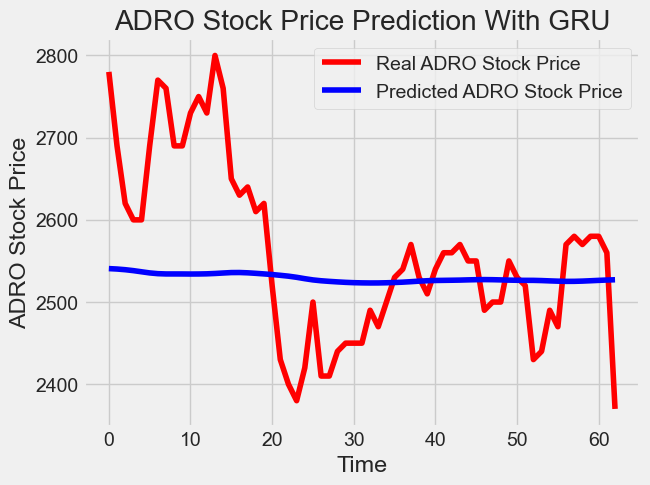

In [1161]:
# Visualizing the results for GRU
gru_title = "With GRU"
plot_predictions("ADRO", ADRO_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3971688934.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


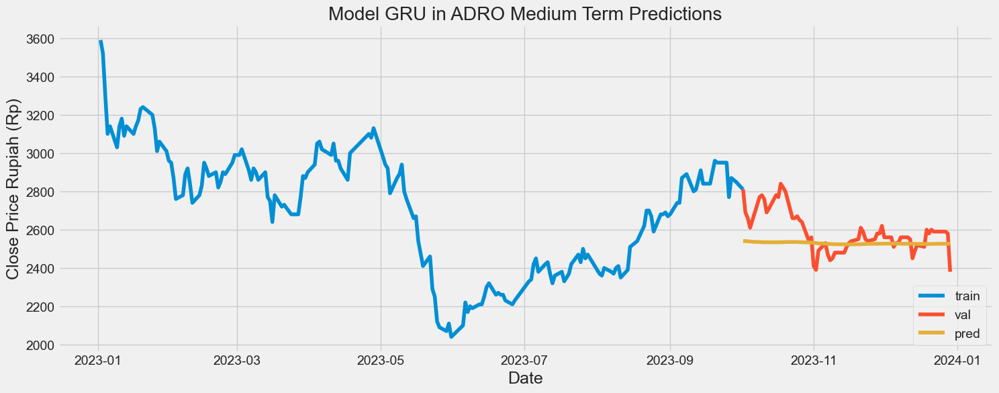

In [1162]:
# Visualize the data
# Plot the data
train = ADRO["2023-01":"2023-10-02"]
valid = ADRO["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ADRO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1163]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(ADRO_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 109.21202000092329.
The root mean squared error after normalization is 0.25398144186261223.


#### RNN Predictions

In [1164]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 4s 21ms/step - loss: 0.1152 - accuracy: 0.0064
Epoch 2/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0896 - accuracy: 0.0064
Epoch 3/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0708 - accuracy: 0.0127
Epoch 4/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0723 - accuracy: 0.0064
Epoch 5/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0734 - accuracy: 0.0127
Epoch 6/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0528 - accuracy: 0.0000e+00
Epoch 7/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0566 - accuracy: 0.0064
Epoch 8/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0506 - accuracy: 0.0127
Epoch 9/50
5/5 [==============================] - 0s 20ms/step - loss: 0.0563 - accuracy: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0393 - accuracy: 0.0064
Epoch 11/50
5/5 [========

In [1165]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"]["2023-01":"2023-10-02"],ADRO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

In [1166]:
# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

2/2 [==============================] - 1s 9ms/step


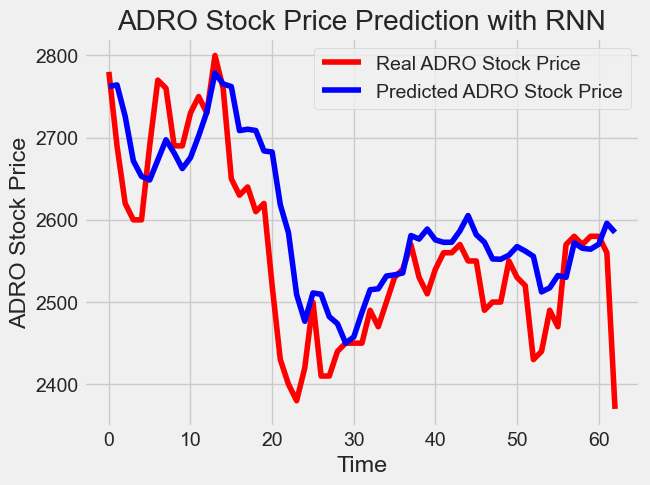

In [1167]:
# Visualizing the results for rnn
rnn_title = "with RNN"
plot_predictions('ADRO', ADRO_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3098864298.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


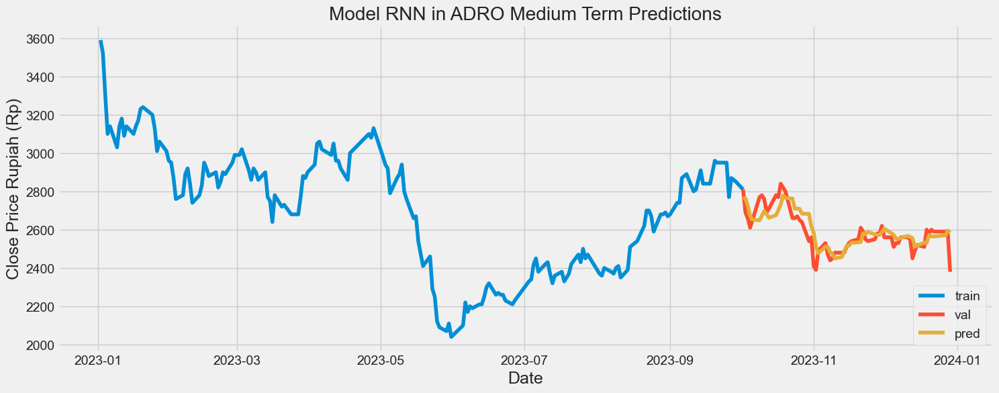

In [1168]:
# Visualize the data
# Plot the data
train = ADRO["2023-01":"2023-10-02"]
valid = ADRO["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ADRO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1169]:
# Evaluating the sequence
rmse = return_rmse(ADRO_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 71.99127015571676.
The root mean squared error after normalization is 0.16742155850166685.


### AMMN

#### Data Split

In [1170]:
AMMN_medium_train = AMMN["2023-01":"2023-11-01"].iloc[:,3:4].values
AMMN_medium_test = AMMN["2023-11-01":"2023-12"].iloc[:,3:4].values

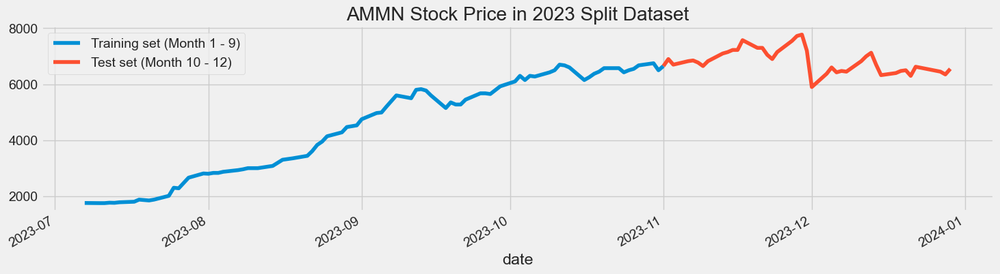

In [1171]:
AMMN["close"]["2023-01":"2023-11-01"].plot(figsize=(16,4), legend=True)
AMMN["close"]["2023-11-01":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('AMMN Stock Price in 2023 Split Dataset')
plt.show()

In [1172]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMMN_medium_train)

len_train = len(AMMN_medium_train)
len_test = len(AMMN_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))


81 41


#### LSTM Predictions

In [1173]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0473
Epoch 2/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0196
Epoch 3/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0080
Epoch 4/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0093
Epoch 5/50
2/2 [==============================] - 0s 40ms/step - loss: 0.0091
Epoch 6/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0077
Epoch 7/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0062
Epoch 8/50
2/2 [==============================] - 0s 59ms/step - loss: 0.0052
Epoch 9/50
2/2 [==============================] - 0s 95ms/step - loss: 0.0074
Epoch 10/50
2/2 [==============================] - 0s 51ms/step - loss: 0.0105
Epoch 11/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0067
Epoch 12/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0080
Epoch 13/50
2/2 [==============================] - 0s 44ms/st

2/2 [==============================] - 0s 13ms/step


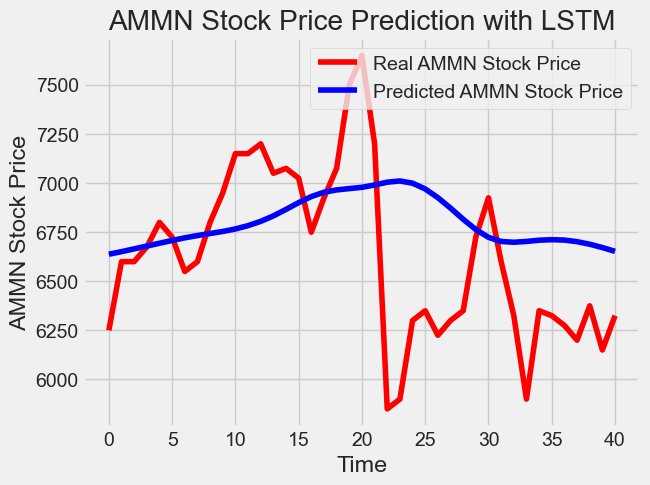

In [1174]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"]["2023-01":"2023-11-01"],AMMN["close"]["2023-11-01":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('AMMN', AMMN_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1592110218.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


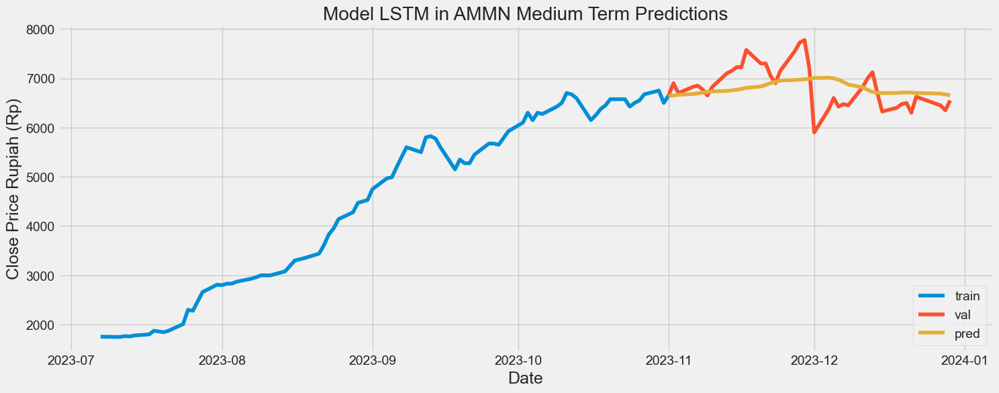

In [1175]:
# Visualize the data
# Plot the data
train = AMMN["2023-01":"2023-11-01"]
valid = AMMN["2023-11-01":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMMN Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1176]:
# Evaluating the sequence
rmse = return_rmse(AMMN_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 445.3474422649046.
The root mean squared error after normalization is 0.2474152457027248.


#### GRU Predictions

In [1177]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
1/1 [==============================] - 0s 60ms/step - loss: 0.1214
Epoch 2/50
1/1 [==============================] - 0s 55ms/step - loss: 0.1171
Epoch 3/50
1/1 [==============================] - 0s 57ms/step - loss: 0.1026
Epoch 4/50
1/1 [==============================] - 0s 61ms/step - loss: 0.0828
Epoch 5/50
1/1 [==============================] - 0s 56ms/step - loss: 0.0720
Epoch 6/50
1/1 [==============================] - 0s 53ms/step - loss: 0.0535
Epoch 7/50
1/1 [==============================] - 0s 51ms/step - loss: 0.0442
Epoch 8/50
1/1 [==============================] - 0s 56ms/step - loss: 0.0405
Epoch 9/50
1/1 [==============================] - 0s 52ms/step - loss: 0.0384
Epoch 10/50
1/1 [==============================] - 0s 50ms/step - loss: 0.0428
Epoch 11/50
1/1 [==============================] - 0s 52ms/step - loss: 0.0482
Epoch 12/50
1/1 [==============================] - 0s 55ms/step - loss: 0.0499
Epoch 13/50
1/1 [==============================] - 0s 57ms/st

2/2 [==============================] - 0s 14ms/step


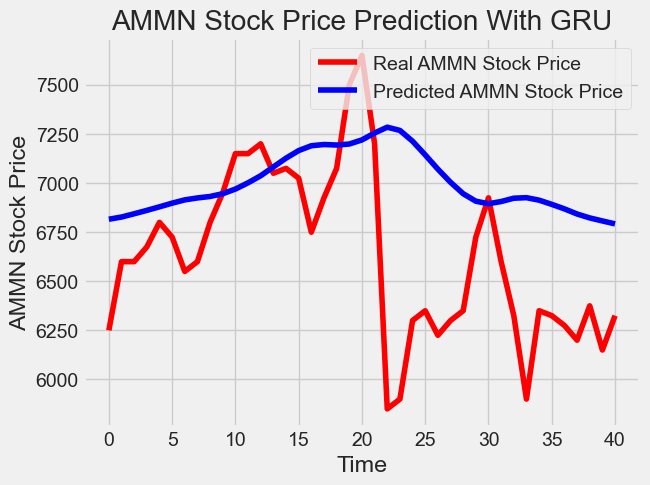

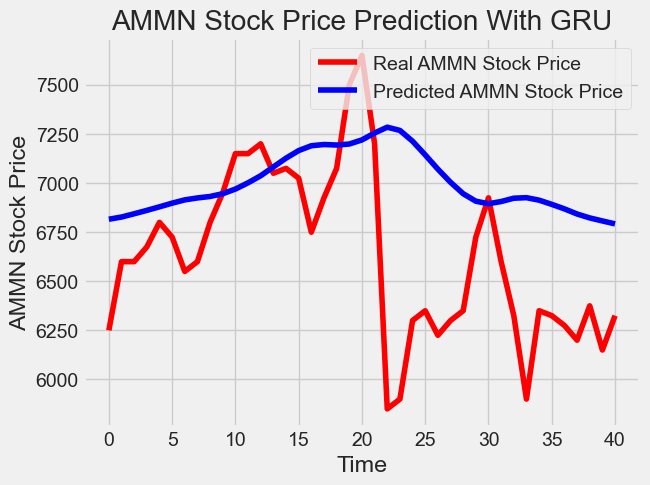

In [1178]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"]["2023-01":"2023-11-01"],AMMN["close"]["2023-11-01":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("AMMN", AMMN_medium_test,GRU_predicted_stock_price, gru_title)
plot_predictions("AMMN", AMMN_medium_test,GRU_predicted_stock_price, gru_title)


C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1244434471.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


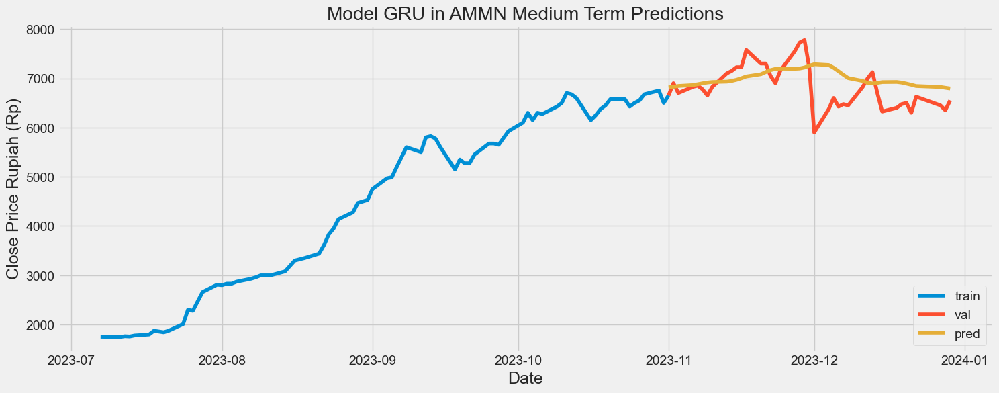

In [1179]:
# Visualize the data
# Plot the data
train = AMMN["2023-01":"2023-11-01"]
valid = AMMN["2023-11-01":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMMN Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1180]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(AMMN_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 544.934836418108.
The root mean squared error after normalization is 0.30274157578783784.


#### RNN Predictions

In [1181]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
2/2 [==============================] - 0s 25ms/step - loss: 0.0329 - accuracy: 0.0164
Epoch 2/50
2/2 [==============================] - 0s 29ms/step - loss: 0.0284 - accuracy: 0.0164
Epoch 3/50
2/2 [==============================] - 0s 28ms/step - loss: 0.0238 - accuracy: 0.0164
Epoch 4/50
2/2 [==============================] - 0s 27ms/step - loss: 0.0242 - accuracy: 0.0164
Epoch 5/50
2/2 [==============================] - 0s 30ms/step - loss: 0.0298 - accuracy: 0.0164
Epoch 6/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0330 - accuracy: 0.0164
Epoch 7/50
2/2 [==============================] - 0s 23ms/step - loss: 0.0231 - accuracy: 0.0164
Epoch 8/50
2/2 [==============================] - 0s 23ms/step - loss: 0.0227 - accuracy: 0.0164
Epoch 9/50
2/2 [==============================] - 0s 26ms/step - loss: 0.0236 - accuracy: 0.0164
Epoch 10/50
2/2 [==============================] - 0s 30ms/step - loss: 0.0342 - accuracy: 0.0164
Epoch 11/50
2/2 [============

2/2 [==============================] - 0s 7ms/step


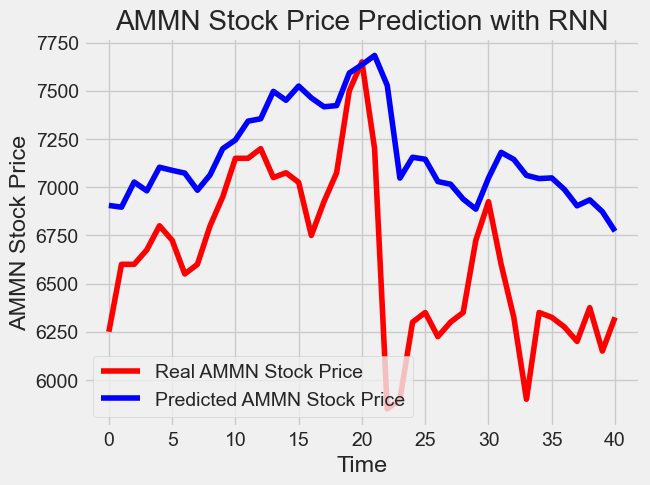

In [1182]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"]["2023-01":"2023-11-01"],AMMN["close"]["2023-11-01":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
plot_predictions('AMMN', AMMN_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\49979064.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


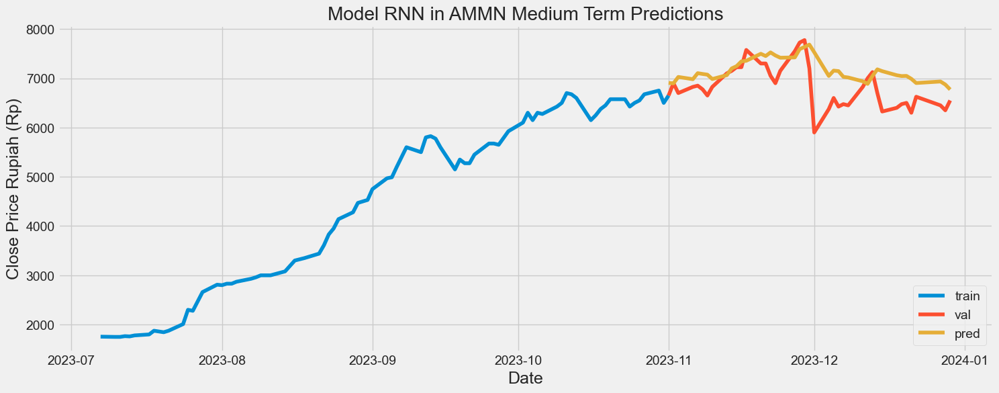

In [1183]:
# Visualize the data
# Plot the data
train = AMMN["2023-01":"2023-11-01"]
valid = AMMN["2023-11-01":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMMN Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1184]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(AMMN_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 620.6065848042089.
The root mean squared error after normalization is 0.33849164709553375.


### AMRT

#### Data Split

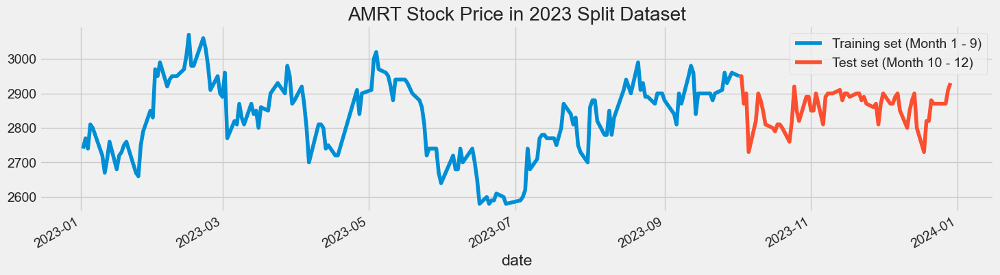

In [1185]:
AMRT_medium_train = AMRT["2023-01":"2023-10-02"].iloc[:,3:4].values
AMRT_medium_test = AMRT["2023-10-02":"2023-12"].iloc[:,3:4].values
AMRT["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
AMRT["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('AMRT Stock Price in 2023 Split Dataset')
plt.show()

In [1186]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMRT_medium_train)

len_train = len(AMRT_medium_train)
len_test = len(AMRT_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [1187]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0353
Epoch 2/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0303
Epoch 3/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0293
Epoch 4/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0273
Epoch 5/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0291
Epoch 6/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0312
Epoch 7/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0305
Epoch 8/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0288
Epoch 9/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0281
Epoch 10/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0288
Epoch 11/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0234
Epoch 12/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0253
Epoch 13/50
5/5 [==============================] - 0s 39ms/st

2/2 [==============================] - 0s 17ms/step


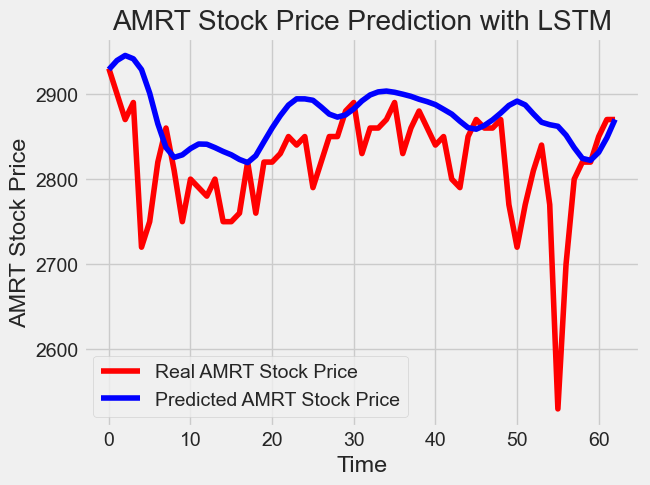

In [1188]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"]["2023-01":"2023-10-02"],AMRT["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('AMRT', AMRT_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\544419584.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


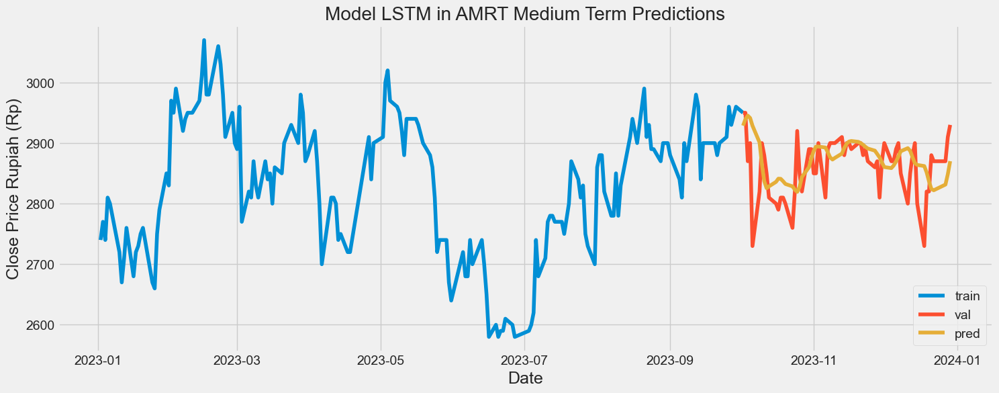

In [1189]:
# Visualize the data
# Plot the data
train = AMRT["2023-01":"2023-10-02"]
valid = AMRT["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMRT Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1190]:
# Evaluating the sequence
rmse = return_rmse(AMRT_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 77.6363075326222.
The root mean squared error after normalization is 0.18694885255337657.


#### GRU Predictions

In [1191]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0345
Epoch 2/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0305
Epoch 3/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0279
Epoch 4/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0302
Epoch 5/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0344
Epoch 6/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0329
Epoch 7/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0306
Epoch 8/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0283
Epoch 9/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0292
Epoch 10/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0282
Epoch 11/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0283
Epoch 12/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0281
Epoch 13/50
2/2 [==============================] - 0s 45ms/st

2/2 [==============================] - 0s 21ms/step


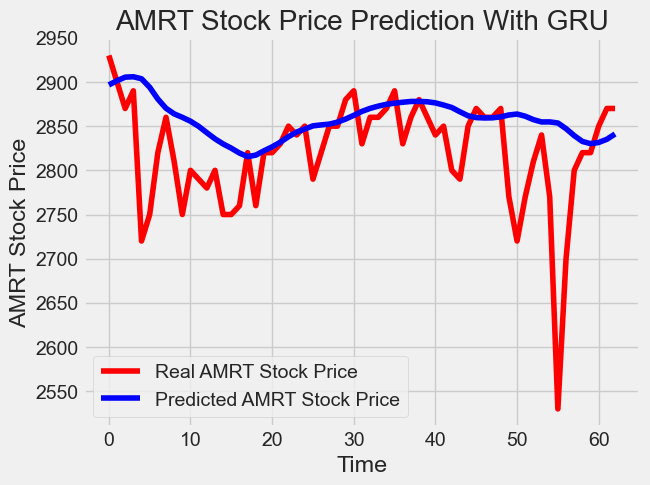

In [1192]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"]["2023-01":"2023-10-02"],AMRT["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("AMRT", AMRT_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1936509062.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


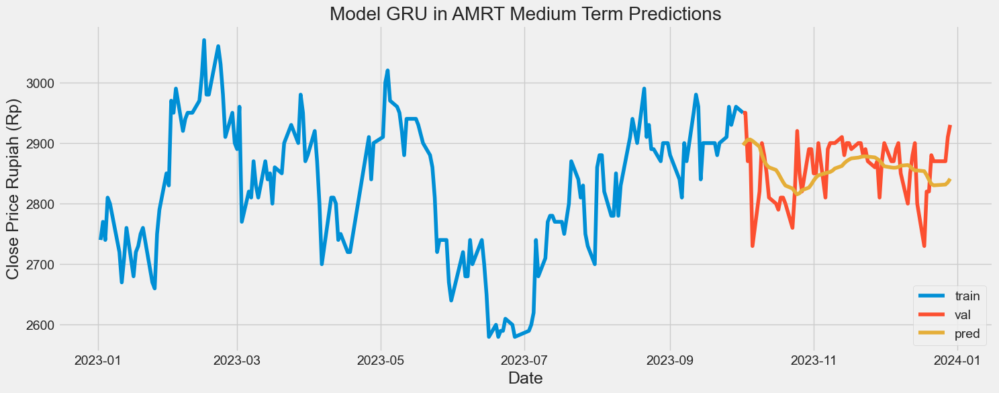

In [1193]:
# Visualize the data
# Plot the data
train = AMRT["2023-01":"2023-10-02"]
valid = AMRT["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMRT Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1194]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(AMRT_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 69.94189126118053.
The root mean squared error after normalization is 0.17485472815295142.


#### RNN Predictions

In [1195]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0325 - accuracy: 0.0064
Epoch 2/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0284 - accuracy: 0.0127
Epoch 3/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0239 - accuracy: 0.0127
Epoch 4/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0295 - accuracy: 0.0127
Epoch 5/50
5/5 [==============================] - 0s 24ms/step - loss: 0.0257 - accuracy: 0.0127
Epoch 6/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0271 - accuracy: 0.0127
Epoch 7/50
5/5 [==============================] - 0s 24ms/step - loss: 0.0290 - accuracy: 0.0064
Epoch 8/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0253 - accuracy: 0.0127
Epoch 9/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0282 - accuracy: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0224 - accuracy: 0.0127
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 9ms/step


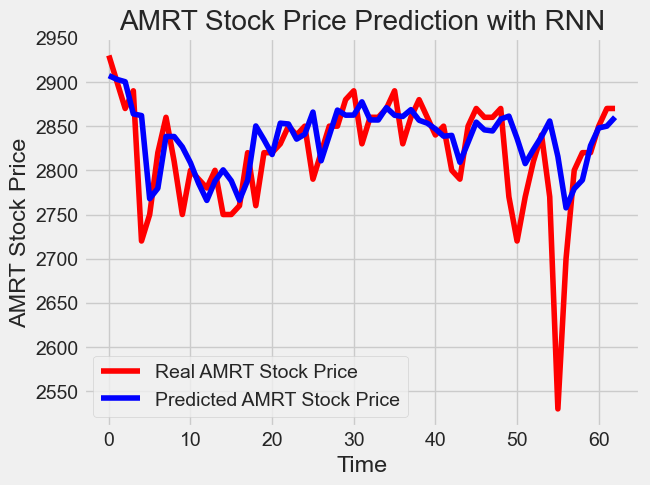

In [1196]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"]["2023-01":"2023-10-02"],AMRT["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('AMRT', AMRT_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2205770258.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


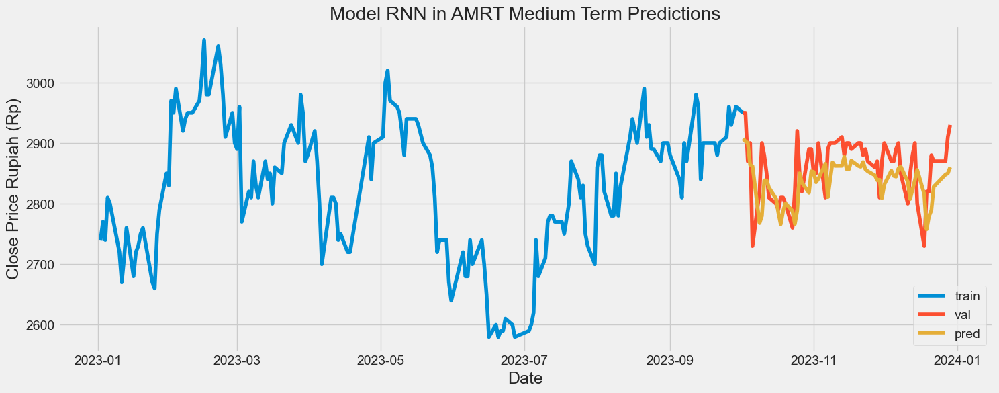

In [1197]:
# Visualize the data
# Plot the data
train = AMRT["2023-01":"2023-10-02"]
valid = AMRT["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMRT Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1198]:

# Evaluating the sequence
rmse = return_rmse(AMRT_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 53.26381679815103.
The root mean squared error after normalization is 0.13315954199537758.


### ASII

#### Data Split

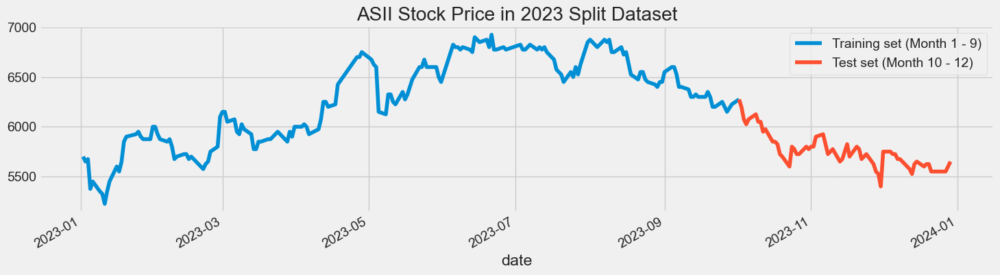

In [1199]:
ASII_medium_train = ASII["2023-01":"2023-10-02"].iloc[:,3:4].values
ASII_medium_test = ASII["2023-10-02":"2023-12"].iloc[:,3:4].values
ASII["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
ASII["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('ASII Stock Price in 2023 Split Dataset')
plt.show()

In [1200]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ASII_medium_train)

len_train = len(ASII_medium_train)
len_test = len(ASII_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))


177 63


#### LSTM Predictions

In [1201]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0189
Epoch 2/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0125
Epoch 3/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0103
Epoch 4/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0109
Epoch 5/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0159
Epoch 6/50
5/5 [==============================] - 0s 38ms/step - loss: 0.0131
Epoch 7/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0100
Epoch 8/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0097
Epoch 9/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 48ms/step - loss: 0.0140
Epoch 11/50
5/5 [==============================] - 0s 55ms/step - loss: 0.0120
Epoch 12/50
5/5 [==============================] - 0s 45ms/step - loss: 0.0114
Epoch 13/50
5/5 [==============================] - 0s 44ms/st

2/2 [==============================] - 0s 21ms/step


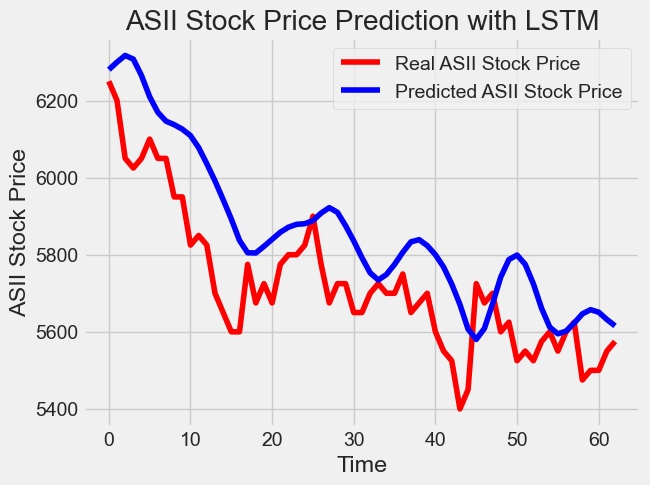

In [1202]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"]["2023-01":"2023-10-02"],ASII["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('ASII', ASII_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1505808189.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


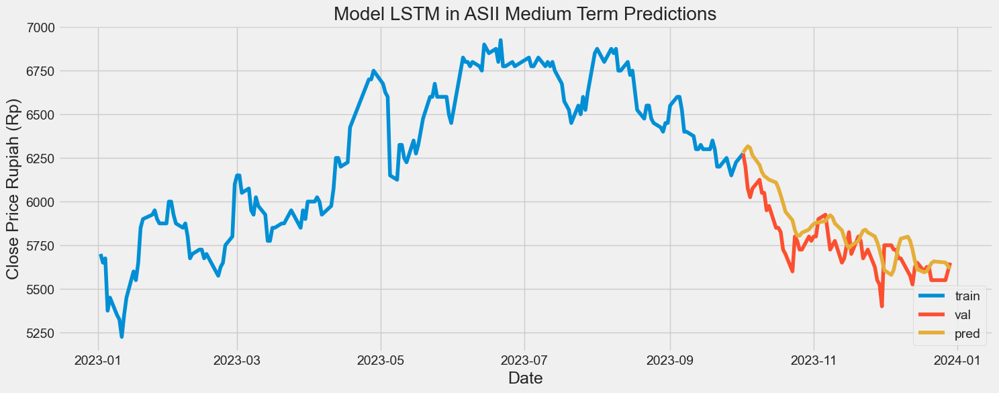

In [1203]:
# Visualize the data
# Plot the data
train = ASII["2023-01":"2023-10-02"]
valid = ASII["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ASII Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1204]:
# Evaluating the sequence
rmse = return_rmse(ASII_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 164.94338142570166.
The root mean squared error after normalization is 0.17987273020416594.


#### GRU Predictions

In [1205]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 56ms/step - loss: 0.0134
Epoch 2/50
2/2 [==============================] - 0s 53ms/step - loss: 0.0148
Epoch 3/50
2/2 [==============================] - 0s 51ms/step - loss: 0.0157
Epoch 4/50
2/2 [==============================] - 0s 55ms/step - loss: 0.0142
Epoch 5/50
2/2 [==============================] - 0s 52ms/step - loss: 0.0153
Epoch 6/50
2/2 [==============================] - 0s 63ms/step - loss: 0.0131
Epoch 7/50
2/2 [==============================] - 0s 50ms/step - loss: 0.0122
Epoch 8/50
2/2 [==============================] - 0s 56ms/step - loss: 0.0134
Epoch 9/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0125
Epoch 10/50
2/2 [==============================] - 0s 50ms/step - loss: 0.0115
Epoch 11/50
2/2 [==============================] - 0s 47ms/step - loss: 0.0138
Epoch 12/50
2/2 [==============================] - 0s 55ms/step - loss: 0.0123
Epoch 13/50
2/2 [==============================] - 0s 54ms/st

2/2 [==============================] - 0s 17ms/step


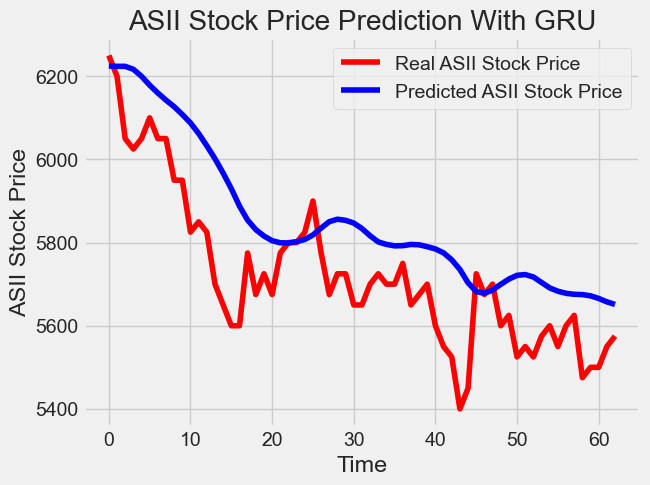

In [1206]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"]["2023-01":"2023-10-02"],ASII["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("ASII", ASII_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3151604182.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


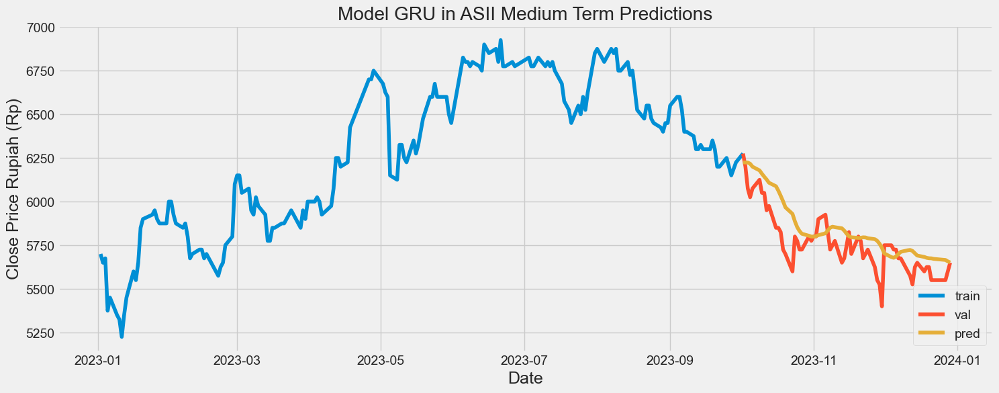

In [1207]:
# Visualize the data
# Plot the data
train = ASII["2023-01":"2023-10-02"]
valid = ASII["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ASII Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1208]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(ASII_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 159.6880631330708.
The root mean squared error after normalization is 0.18786830956831863.


#### RNN Predictions

In [1209]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0180 - accuracy: 0.0191
Epoch 2/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0231 - accuracy: 0.0191
Epoch 3/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0197 - accuracy: 0.0191
Epoch 4/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0162 - accuracy: 0.0191
Epoch 5/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0176 - accuracy: 0.0191
Epoch 6/50
5/5 [==============================] - 0s 25ms/step - loss: 0.0147 - accuracy: 0.0191
Epoch 7/50
5/5 [==============================] - 0s 28ms/step - loss: 0.0164 - accuracy: 0.0191
Epoch 8/50
5/5 [==============================] - 0s 24ms/step - loss: 0.0122 - accuracy: 0.0191
Epoch 9/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0130 - accuracy: 0.0191
Epoch 10/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0155 - accuracy: 0.0191
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 8ms/step


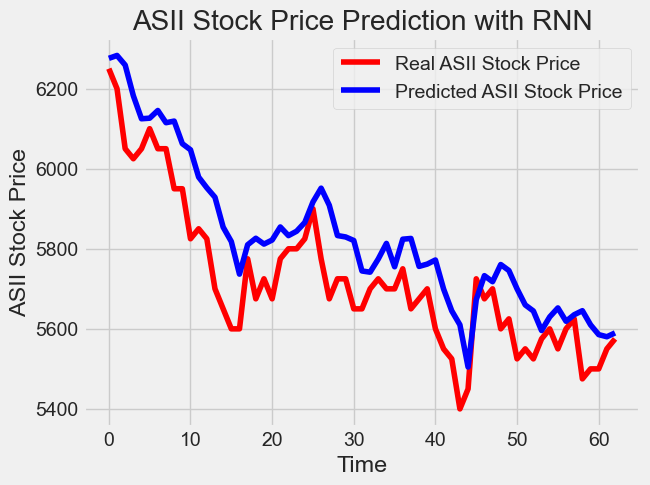

In [1210]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"]["2023-01":"2023-10-02"],ASII["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('ASII', ASII_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1620255119.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


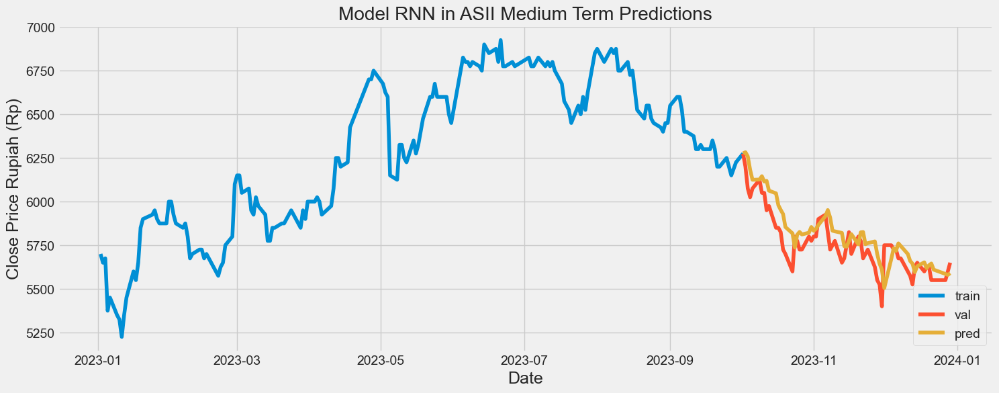

In [1211]:
# Visualize the data
# Plot the data
train = ASII["2023-01":"2023-10-02"]
valid = ASII["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ASII Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1212]:
# Evaluating the sequence
rmse = return_rmse(ASII_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 121.91192948239193.
The root mean squared error after normalization is 0.13806606338936803.


### GOTO

#### Data Split

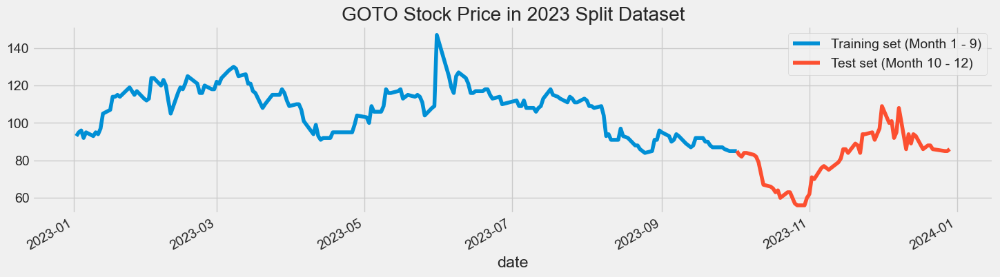

In [1213]:
GOTO_medium_train = GOTO["2023-01":"2023-10-02"].iloc[:,3:4].values
GOTO_medium_test = GOTO["2023-10-02":"2023-12"].iloc[:,3:4].values
GOTO["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
GOTO["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('GOTO Stock Price in 2023 Split Dataset')
plt.show()

In [1214]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(GOTO_medium_train)

len_train = len(GOTO_medium_train)
len_test = len(GOTO_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))


177 63


#### LSTM Predictions

In [1215]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 44ms/step - loss: 0.0178
Epoch 2/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0186
Epoch 3/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0173
Epoch 4/50
5/5 [==============================] - 0s 60ms/step - loss: 0.0191
Epoch 5/50
5/5 [==============================] - 0s 62ms/step - loss: 0.0181
Epoch 6/50
5/5 [==============================] - 0s 61ms/step - loss: 0.0195
Epoch 7/50
5/5 [==============================] - 0s 46ms/step - loss: 0.0182
Epoch 8/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0171
Epoch 9/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0178
Epoch 10/50
5/5 [==============================] - 0s 47ms/step - loss: 0.0191
Epoch 11/50
5/5 [==============================] - 0s 53ms/step - loss: 0.0156
Epoch 12/50
5/5 [==============================] - 0s 50ms/step - loss: 0.0169
Epoch 13/50
5/5 [==============================] - 0s 46ms/st

2/2 [==============================] - 0s 16ms/step


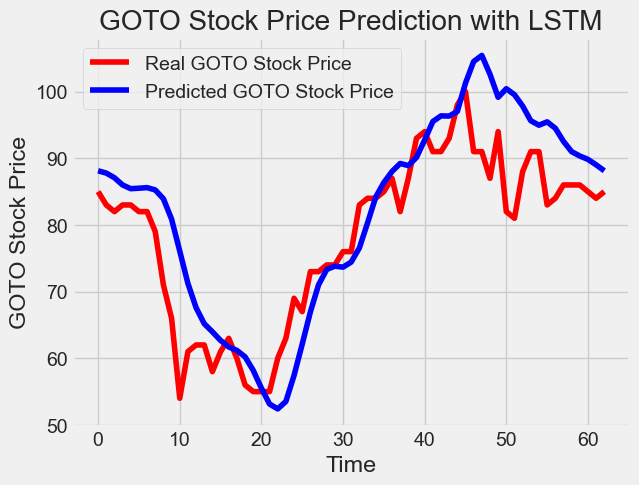

In [1216]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"]["2023-01":"2023-10-02"],GOTO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('GOTO', GOTO_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\823254503.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


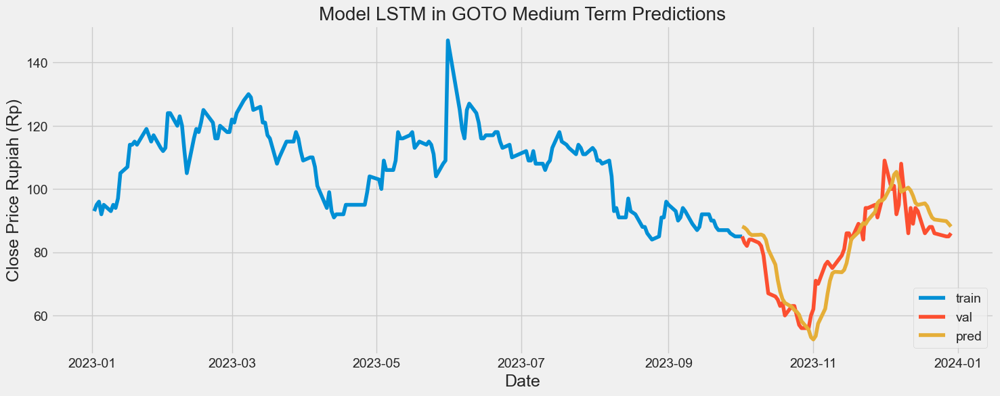

In [1217]:
# Visualize the data
# Plot the data
train = GOTO["2023-01":"2023-10-02"]
valid = GOTO["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in GOTO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1218]:
# Evaluating the sequence
rmse = return_rmse(GOTO_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 7.6254598006802174.
The root mean squared error after normalization is 0.14383124652347898.


#### GRU Predictions

In [1219]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0254
Epoch 2/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0220
Epoch 3/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0247
Epoch 4/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0277
Epoch 5/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0257
Epoch 6/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0229
Epoch 7/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0236
Epoch 8/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0275
Epoch 9/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0267
Epoch 10/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0237
Epoch 11/50
2/2 [==============================] - 0s 49ms/step - loss: 0.0224
Epoch 12/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0234
Epoch 13/50
2/2 [==============================] - 0s 45ms/st

2/2 [==============================] - 0s 16ms/step


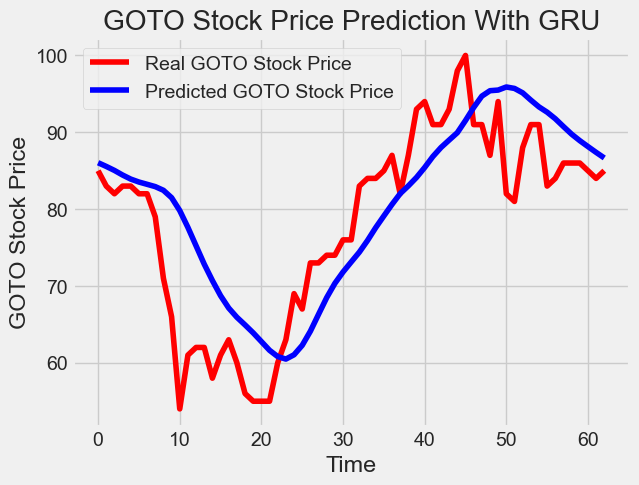

In [1220]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"]["2023-01":"2023-10-02"],GOTO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("GOTO", GOTO_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2104518936.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


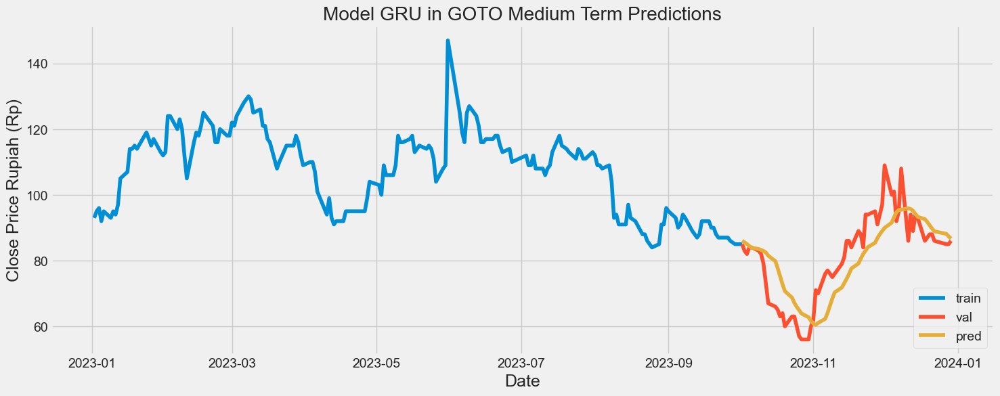

In [1221]:
# Visualize the data
# Plot the data
train = GOTO["2023-01":"2023-10-02"]
valid = GOTO["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in GOTO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1222]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(GOTO_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 7.827536264614475.
The root mean squared error after normalization is 0.1701638318394451.


#### RNN Predictions

In [1223]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0191 - accuracy: 0.0191
Epoch 2/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0170 - accuracy: 0.0191
Epoch 3/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0167 - accuracy: 0.0191
Epoch 4/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0142 - accuracy: 0.0191
Epoch 5/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0156 - accuracy: 0.0191
Epoch 6/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0157 - accuracy: 0.0191
Epoch 7/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0152 - accuracy: 0.0191
Epoch 8/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0133 - accuracy: 0.0191
Epoch 9/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0108 - accuracy: 0.0191
Epoch 10/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0136 - accuracy: 0.0191
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 8ms/step


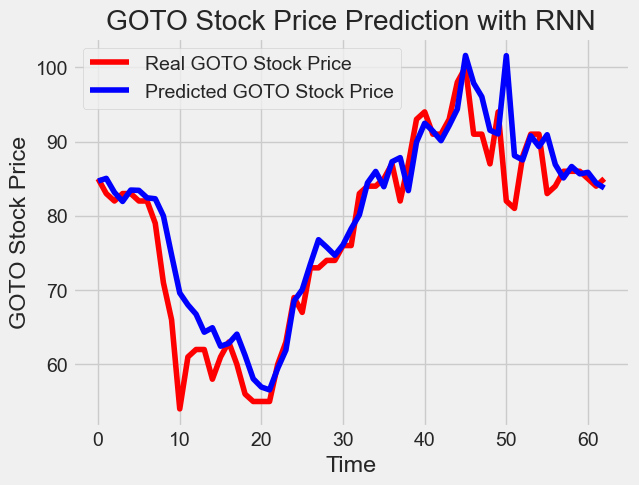

In [1224]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"]["2023-01":"2023-10-02"],GOTO["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('GOTO', GOTO_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2015191341.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


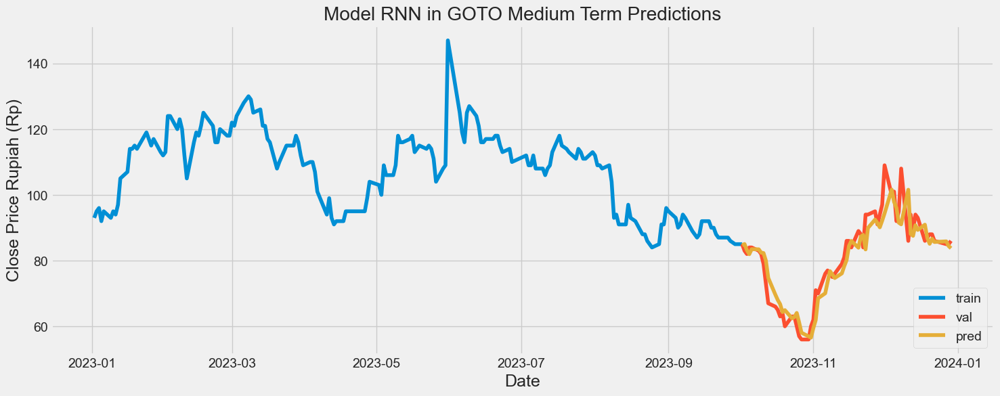

In [1225]:
# Visualize the data
# Plot the data
train = GOTO["2023-01":"2023-10-02"]
valid = GOTO["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in GOTO Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1226]:
# Evaluating the sequence
rmse = return_rmse(GOTO_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 4.621244482466215.
The root mean squared error after normalization is 0.09708508015775101.


### KLBF

#### Data Split

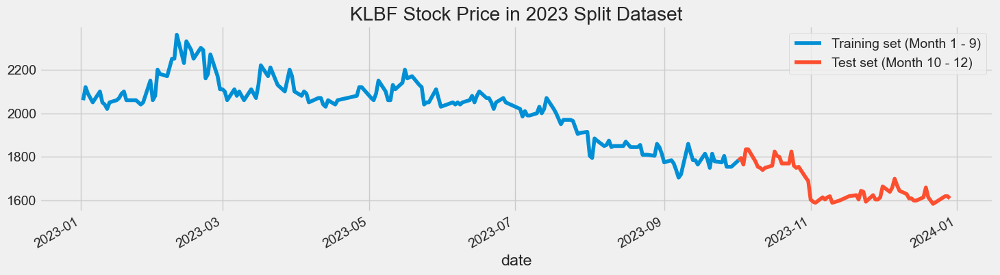

In [1227]:
KLBF_medium_train = KLBF["2023-01":"2023-10-02"].iloc[:,3:4].values
KLBF_medium_test = KLBF["2023-10-02":"2023-12"].iloc[:,3:4].values
KLBF["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
KLBF["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('KLBF Stock Price in 2023 Split Dataset')
plt.show()

In [1228]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(KLBF_medium_train)

len_train = len(KLBF_medium_train)
len_test = len(KLBF_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [1229]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0089
Epoch 2/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0076
Epoch 3/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0059
Epoch 4/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0061
Epoch 5/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0061
Epoch 6/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0083
Epoch 7/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0060
Epoch 8/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0071
Epoch 9/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0061
Epoch 10/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0073
Epoch 11/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0062
Epoch 12/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0061
Epoch 13/50
5/5 [==============================] - 0s 40ms/st

2/2 [==============================] - 0s 15ms/step


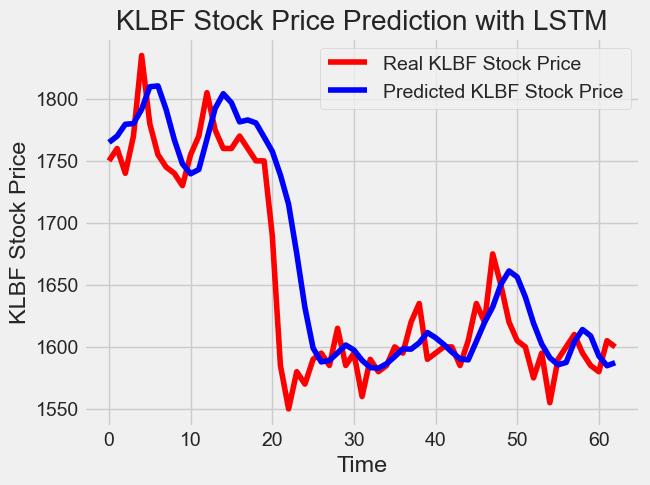

In [1230]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"]["2023-01":"2023-10-02"],KLBF["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('KLBF', KLBF_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1911474585.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


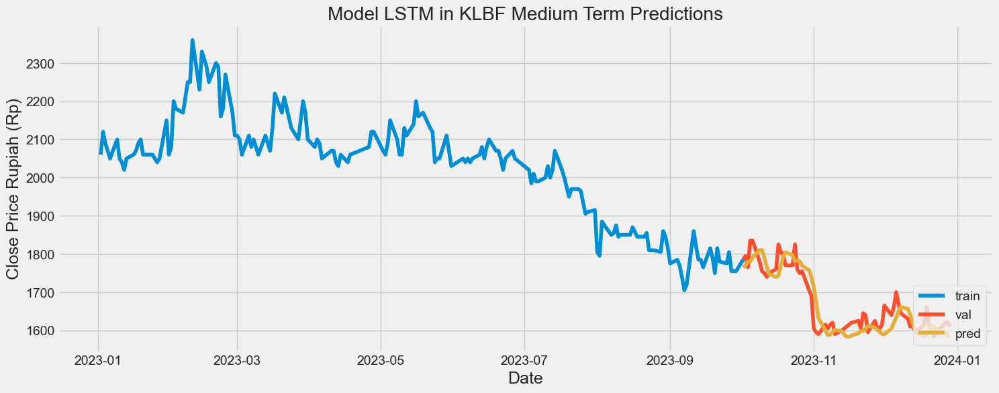

In [1231]:
# Visualize the data
# Plot the data
train = KLBF["2023-01":"2023-10-02"]
valid = KLBF["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in KLBF Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1232]:
# Evaluating the sequence
rmse = return_rmse(KLBF_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 40.897408296249615.
The root mean squared error after normalization is 0.1434996782324548.


#### GRU Predictions

In [1233]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0086
Epoch 2/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0083
Epoch 3/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0077
Epoch 4/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0087
Epoch 5/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0090
Epoch 6/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0079
Epoch 7/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0085
Epoch 8/50
2/2 [==============================] - 0s 41ms/step - loss: 0.0079
Epoch 9/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0086
Epoch 10/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0086
Epoch 11/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0079
Epoch 12/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0082
Epoch 13/50
2/2 [==============================] - 0s 41ms/st

2/2 [==============================] - 0s 15ms/step


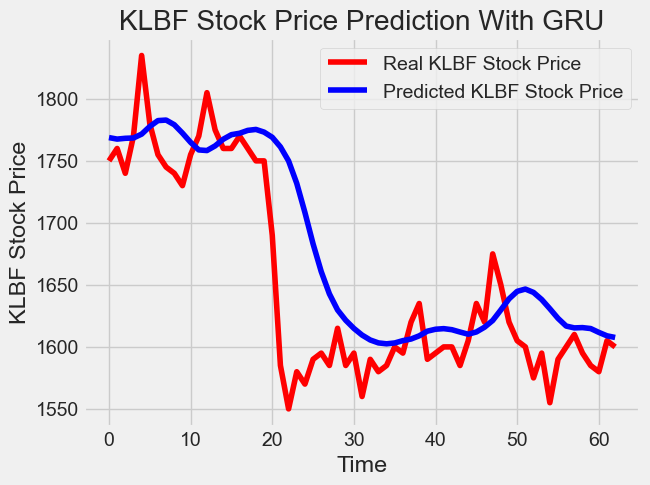

In [1234]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"]["2023-01":"2023-10-02"],KLBF["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("KLBF", KLBF_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\893678420.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


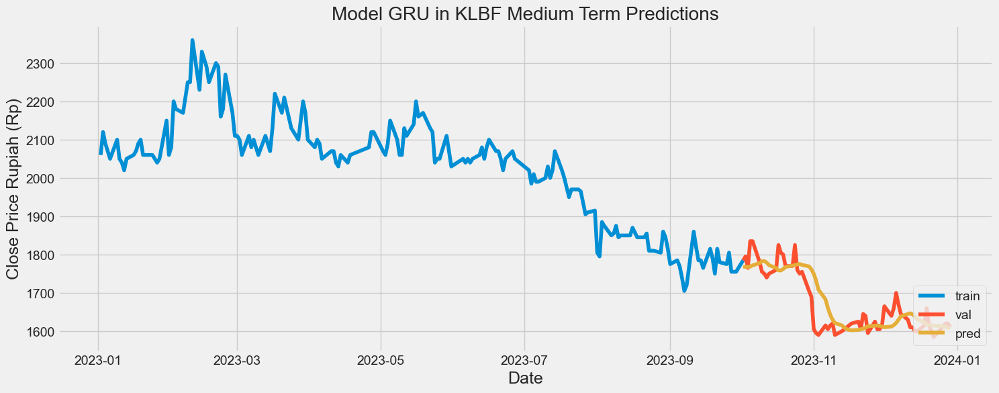

In [1235]:
# Visualize the data
# Plot the data
train = KLBF["2023-01":"2023-10-02"]
valid = KLBF["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in KLBF Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1236]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(KLBF_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 53.944837376863404.
The root mean squared error after normalization is 0.18928013114688913.


#### RNN Predictions

In [1237]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0072 - accuracy: 0.0127
Epoch 2/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0086 - accuracy: 0.0127
Epoch 3/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0084 - accuracy: 0.0127
Epoch 4/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0064 - accuracy: 0.0127
Epoch 5/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0090 - accuracy: 0.0127
Epoch 6/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0086 - accuracy: 0.0127
Epoch 7/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0076 - accuracy: 0.0127
Epoch 8/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0064 - accuracy: 0.0127
Epoch 9/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0082 - accuracy: 0.0127
Epoch 10/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0072 - accuracy: 0.0127
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 8ms/step


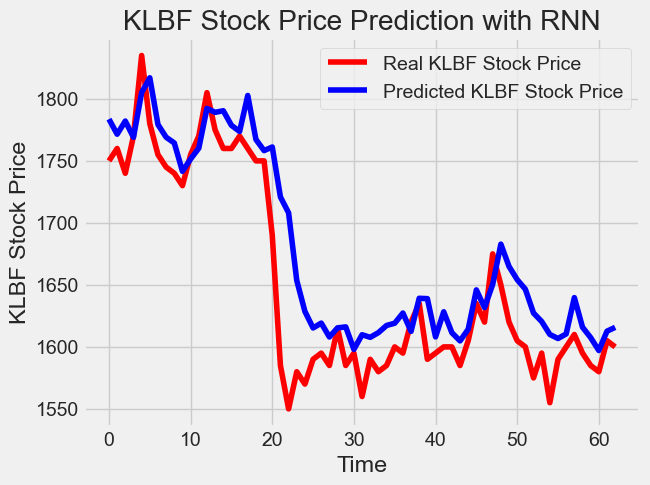

In [1238]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"]["2023-01":"2023-10-02"],KLBF["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('KLBF', KLBF_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2737896725.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


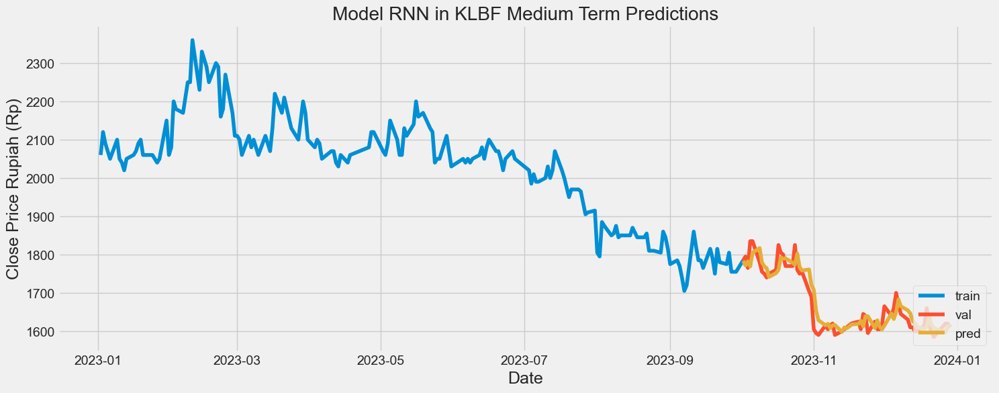

In [1239]:
# Visualize the data
# Plot the data
train = KLBF["2023-01":"2023-10-02"]
valid = KLBF["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in KLBF Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1240]:
# Evaluating the sequence
rmse = return_rmse(KLBF_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 39.706605287650305.
The root mean squared error after normalization is 0.1393214220619309.


### MAPI

#### Data Split

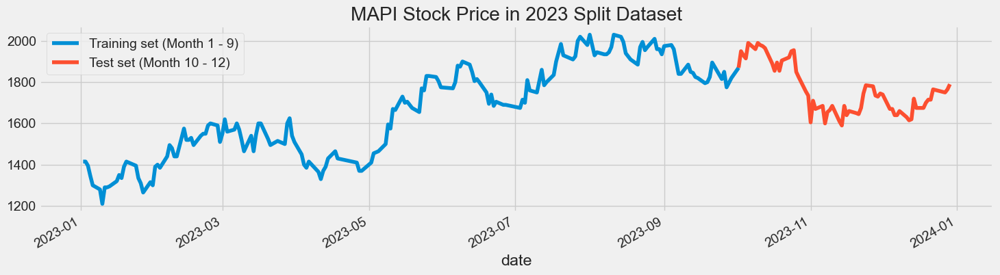

In [1241]:
MAPI_medium_train = MAPI["2023-01":"2023-10-02"].iloc[:,3:4].values
MAPI_medium_test = MAPI["2023-10-02":"2023-12"].iloc[:,3:4].values
MAPI["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
MAPI["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('MAPI Stock Price in 2023 Split Dataset')
plt.show()

In [1242]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(MAPI_medium_train)

len_train = len(MAPI_medium_train)
len_test = len(MAPI_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [1243]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0058
Epoch 2/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0061
Epoch 3/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0076
Epoch 4/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0063
Epoch 5/50
5/5 [==============================] - 0s 45ms/step - loss: 0.0055
Epoch 6/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0064
Epoch 7/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0064
Epoch 8/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0057
Epoch 9/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0061
Epoch 10/50
5/5 [==============================] - 0s 45ms/step - loss: 0.0082
Epoch 11/50
5/5 [==============================] - 0s 45ms/step - loss: 0.0063
Epoch 12/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0053
Epoch 13/50
5/5 [==============================] - 0s 42ms/st

2/2 [==============================] - 0s 16ms/step


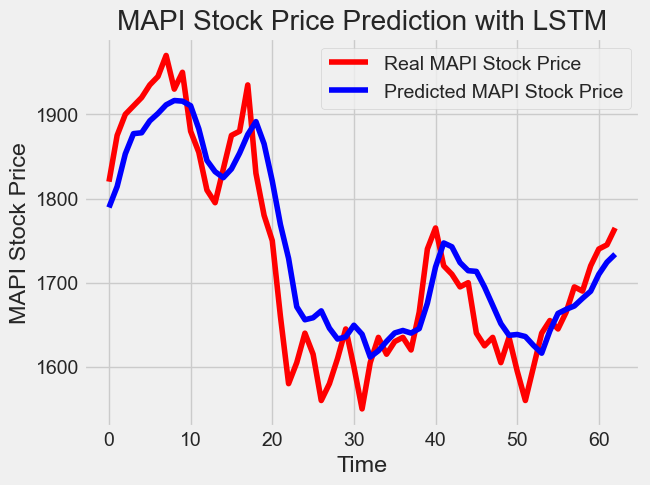

In [1244]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"]["2023-01":"2023-10-02"],MAPI["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('MAPI', MAPI_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1272168269.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


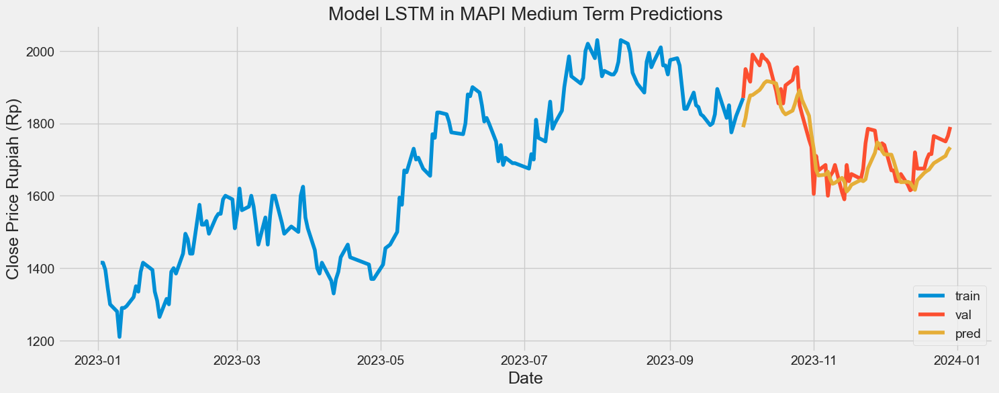

In [1245]:
# Visualize the data
# Plot the data
train = MAPI["2023-01":"2023-10-02"]
valid = MAPI["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in MAPI Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1246]:
# Evaluating the sequence
rmse = return_rmse(MAPI_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 48.67097939333745.
The root mean squared error after normalization is 0.11588328426985109.


#### GRU Predictions

In [1247]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
2/2 [==============================] - 0s 47ms/step - loss: 0.0112
Epoch 2/50
2/2 [==============================] - 0s 47ms/step - loss: 0.0085
Epoch 3/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0087
Epoch 4/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0102
Epoch 5/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0100
Epoch 6/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0084
Epoch 7/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0096
Epoch 8/50
2/2 [==============================] - 0s 47ms/step - loss: 0.0101
Epoch 9/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0111
Epoch 10/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0092
Epoch 11/50
2/2 [==============================] - 0s 43ms/step - loss: 0.0093
Epoch 12/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0080
Epoch 13/50
2/2 [==============================] - 0s 41ms/st

2/2 [==============================] - 0s 16ms/step


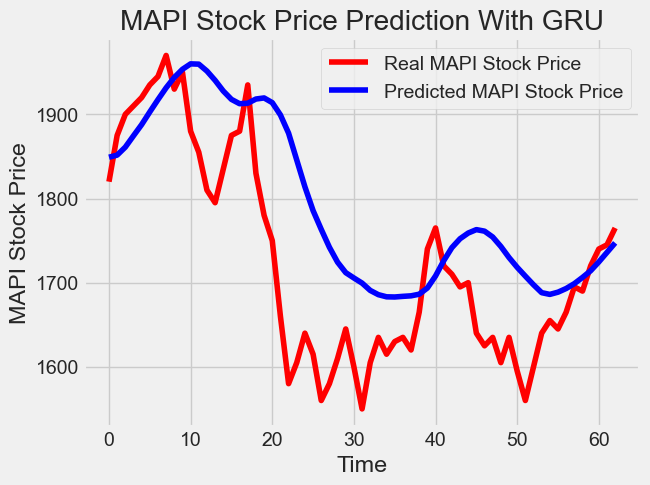

In [1248]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"]["2023-01":"2023-10-02"],MAPI["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("MAPI", MAPI_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3531272499.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


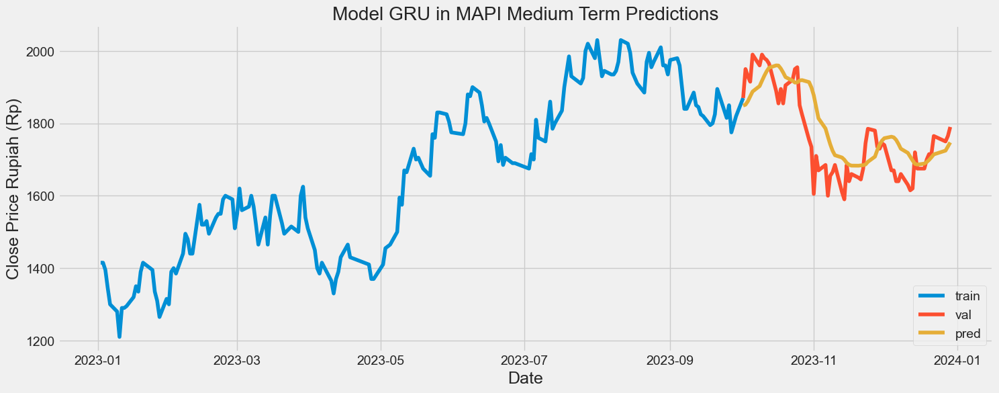

In [1249]:
# Visualize the data
# Plot the data
train = MAPI["2023-01":"2023-10-02"]
valid = MAPI["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in MAPI Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1250]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(MAPI_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 104.05190693178264.
The root mean squared error after normalization is 0.2477426355518635.


#### RNN Predictions

In [1251]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0088 - accuracy: 0.0064
Epoch 2/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0069 - accuracy: 0.0064
Epoch 3/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0073 - accuracy: 0.0064
Epoch 4/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0079 - accuracy: 0.0064
Epoch 5/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0070 - accuracy: 0.0064
Epoch 6/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0072 - accuracy: 0.0064
Epoch 7/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0070 - accuracy: 0.0064
Epoch 8/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0065 - accuracy: 0.0064
Epoch 9/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0074 - accuracy: 0.0064
Epoch 10/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0066 - accuracy: 0.0064
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 10ms/step


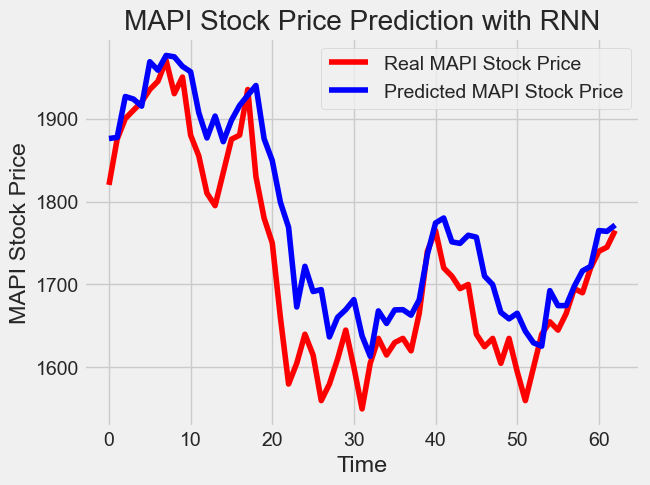

In [1252]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"]["2023-01":"2023-10-02"],MAPI["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('MAPI', MAPI_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1148126434.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


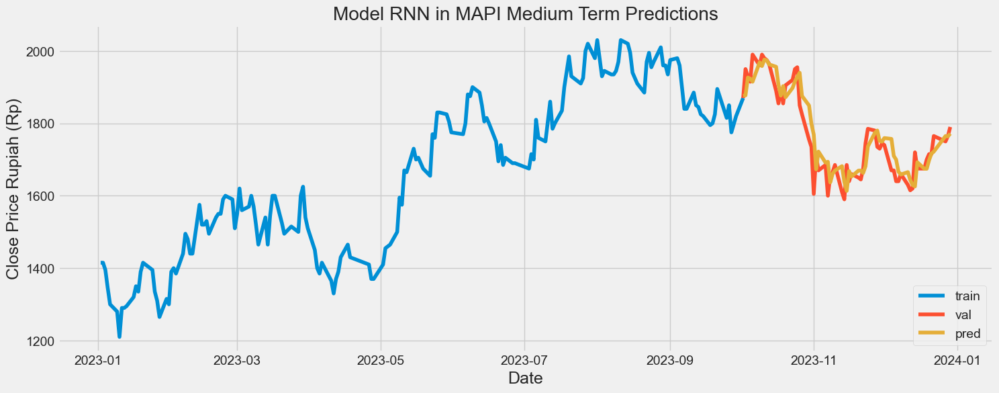

In [1253]:
# Visualize the data
# Plot the data
train = MAPI["2023-01":"2023-10-02"]
valid = MAPI["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in MAPI Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1254]:
# Evaluating the sequence
rmse = return_rmse(MAPI_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 62.146005147564885.
The root mean squared error after normalization is 0.145864333917493.


### TLKM

#### Data Split

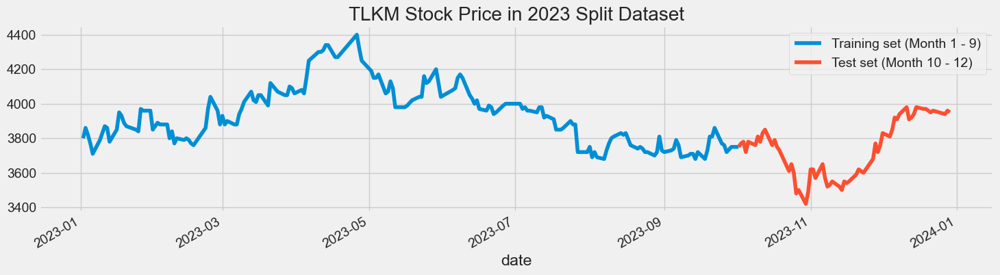

In [1255]:
TLKM_medium_train = TLKM["2023-01":"2023-10-02"].iloc[:,3:4].values
TLKM_medium_test = TLKM["2023-10-02":"2023-12"].iloc[:,3:4].values
TLKM["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
TLKM["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('TLKM Stock Price in 2023 Split Dataset')
plt.show()

In [1256]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_medium_train)

len_train = len(TLKM_medium_train)
len_test = len(TLKM_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))



# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

177 63


#### LSTM Predictions

In [1257]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0071
Epoch 2/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0074
Epoch 3/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0073
Epoch 4/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0072
Epoch 5/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0074
Epoch 6/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0072
Epoch 7/50
5/5 [==============================] - 0s 44ms/step - loss: 0.0072
Epoch 8/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0079
Epoch 9/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0082
Epoch 10/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0066
Epoch 11/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0073
Epoch 12/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0075
Epoch 13/50
5/5 [==============================] - 0s 41ms/st

2/2 [==============================] - 0s 17ms/step


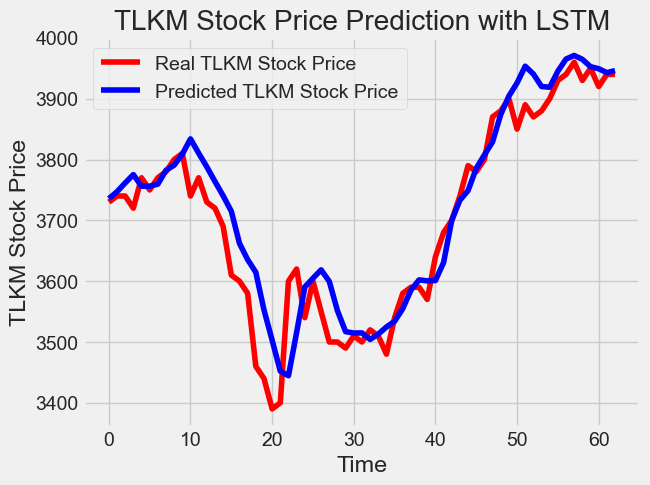

In [1258]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"]["2023-01":"2023-10-02"],TLKM["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('TLKM', TLKM_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1747539515.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


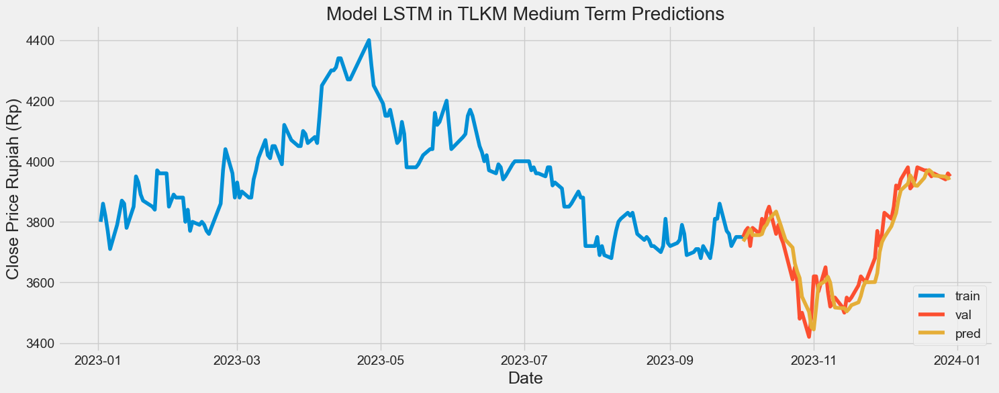

In [1259]:
# Visualize the data
# Plot the data
train = TLKM["2023-01":"2023-10-02"]
valid = TLKM["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in TLKM Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1260]:
# Evaluating the sequence
rmse = return_rmse(TLKM_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 53.38008796983849.
The root mean squared error after normalization is 0.09186387453466517.


#### GRU Predictions

In [1261]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)


Epoch 1/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0201
Epoch 2/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0165
Epoch 3/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0142
Epoch 4/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0165
Epoch 5/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0170
Epoch 6/50
2/2 [==============================] - 0s 47ms/step - loss: 0.0164
Epoch 7/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0153
Epoch 8/50
2/2 [==============================] - 0s 50ms/step - loss: 0.0141
Epoch 9/50
2/2 [==============================] - 0s 50ms/step - loss: 0.0138
Epoch 10/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0150
Epoch 11/50
2/2 [==============================] - 0s 46ms/step - loss: 0.0149
Epoch 12/50
2/2 [==============================] - 0s 45ms/step - loss: 0.0126
Epoch 13/50
2/2 [==============================] - 0s 50ms/st

2/2 [==============================] - 0s 14ms/step


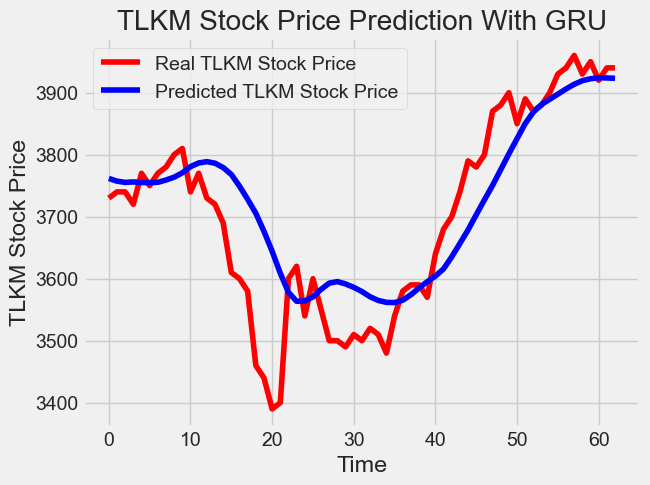

In [1262]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"]["2023-01":"2023-10-02"],TLKM["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("TLKM", TLKM_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1644033162.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


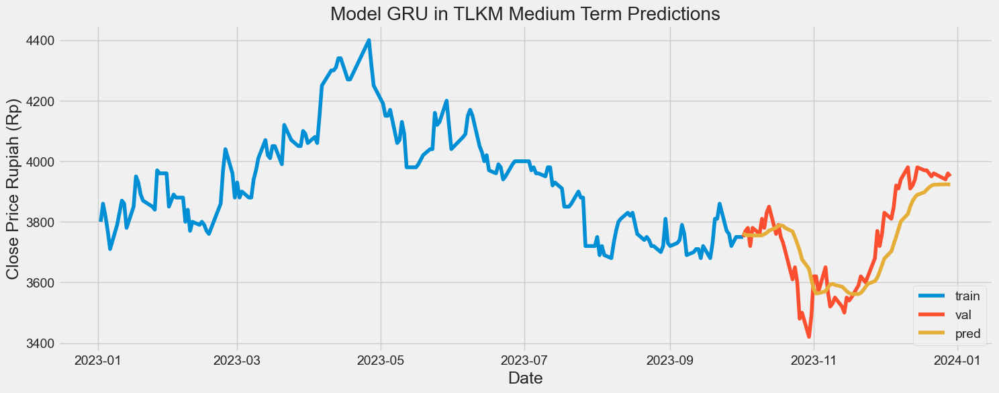

In [1263]:
# Visualize the data
# Plot the data
train = TLKM["2023-01":"2023-10-02"]
valid = TLKM["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in TLKM Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1264]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(TLKM_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 85.55266274254362.
The root mean squared error after normalization is 0.15009239077639233.


#### RNN Predictions

In [1265]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0071 - accuracy: 0.0382
Epoch 2/50
5/5 [==============================] - 0s 22ms/step - loss: 0.0084 - accuracy: 0.0382
Epoch 3/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0075 - accuracy: 0.0382
Epoch 4/50
5/5 [==============================] - 0s 25ms/step - loss: 0.0073 - accuracy: 0.0382
Epoch 5/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0070 - accuracy: 0.0382
Epoch 6/50
5/5 [==============================] - 0s 25ms/step - loss: 0.0069 - accuracy: 0.0382
Epoch 7/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0067 - accuracy: 0.0382
Epoch 8/50
5/5 [==============================] - 0s 26ms/step - loss: 0.0068 - accuracy: 0.0382
Epoch 9/50
5/5 [==============================] - 0s 21ms/step - loss: 0.0059 - accuracy: 0.0382
Epoch 10/50
5/5 [==============================] - 0s 23ms/step - loss: 0.0071 - accuracy: 0.0382
Epoch 11/50
5/5 [============

2/2 [==============================] - 0s 9ms/step


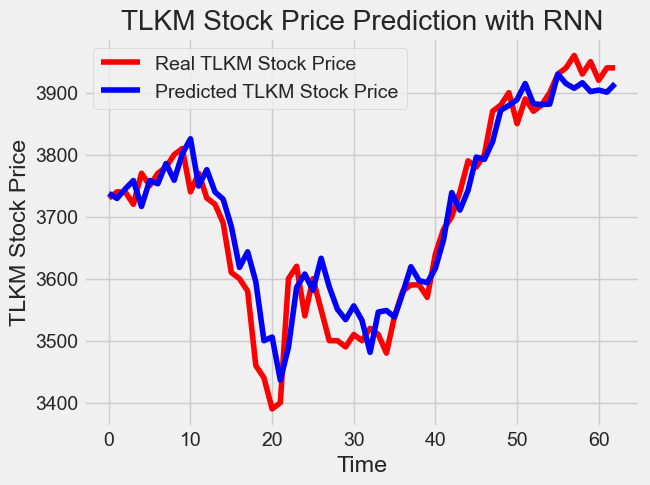

In [1266]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"]["2023-01":"2023-10-02"],TLKM["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('TLKM', TLKM_medium_test,RNN_predicted_stock_price, rnn_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1947723270.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


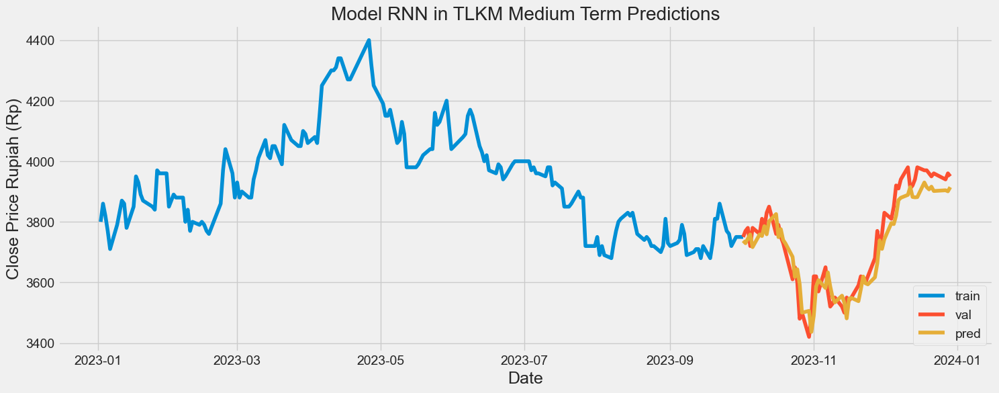

In [1267]:
# Visualize the data
# Plot the data
train = TLKM["2023-01":"2023-10-02"]
valid = TLKM["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in TLKM Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1268]:
# Evaluating the sequence
rmse = return_rmse(TLKM_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 46.11264490345924.
The root mean squared error after normalization is 0.08089937702361272.


### BBCA

#### Data Split

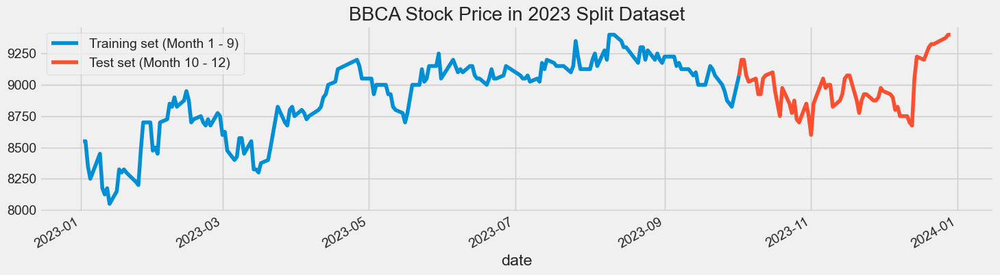

In [1269]:
BBCA_medium_train = BBCA["2023-01":"2023-10-02"].iloc[:,3:4].values
BBCA_medium_test = BBCA["2023-10-02":"2023-12"].iloc[:,3:4].values
BBCA["close"]["2023-01":"2023-10-02"].plot(figsize=(16,4), legend=True)
BBCA["close"]["2023-10-02":"2023-12"].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Month 1 - 9)","Test set (Month 10 - 12)"])
plt.title('BBCA Stock Price in 2023 Split Dataset')
plt.show()

In [1270]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(BBCA_medium_train)

len_train = len(BBCA_medium_train)
len_test = len(BBCA_medium_test)
print(len_train, len_test)

# Since LSTMs store long term memory state, we create a data structure with 20 timesteps and 1 output
# So for each element of training set, we have 20 previous training set elements 
X_train = []
y_train = []
for i in range(20,len_train):
    X_train.append(training_set_scaled[i-20:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

177 63


#### LSTM Predictions

In [1271]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0064
Epoch 2/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0055
Epoch 3/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0057
Epoch 4/50
5/5 [==============================] - 0s 40ms/step - loss: 0.0058
Epoch 5/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0057
Epoch 6/50
5/5 [==============================] - 0s 39ms/step - loss: 0.0059
Epoch 7/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0054
Epoch 8/50
5/5 [==============================] - 0s 41ms/step - loss: 0.0062
Epoch 9/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0056
Epoch 10/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0057
Epoch 11/50
5/5 [==============================] - 0s 43ms/step - loss: 0.0063
Epoch 12/50
5/5 [==============================] - 0s 42ms/step - loss: 0.0049
Epoch 13/50
5/5 [==============================] - 0s 42ms/st

2/2 [==============================] - 0s 16ms/step


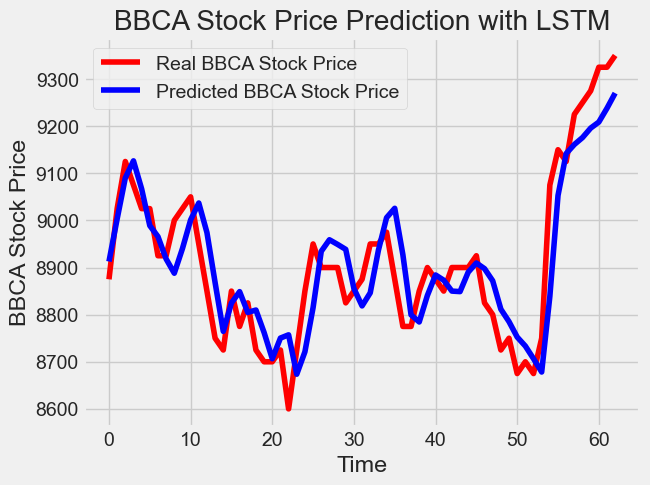

In [1272]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"]["2023-01":"2023-10-02"],BBCA["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
plot_predictions('BBCA', BBCA_medium_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\380346659.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


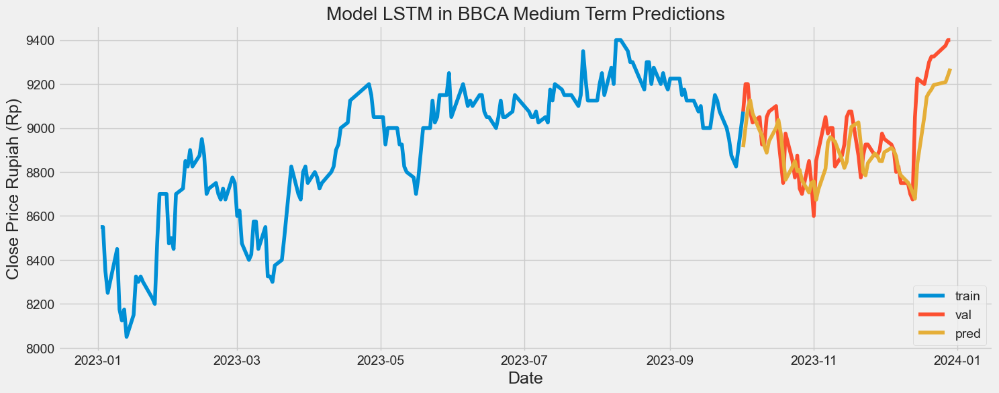

In [1273]:
# Visualize the data
# Plot the data
train = BBCA["2023-01":"2023-10-02"]
valid = BBCA["2023-10-02":"2023-12"]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in BBCA Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1274]:
# Evaluating the sequence
rmse = return_rmse(BBCA_medium_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_medium_test,LSTM_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('medium')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 78.49732237643843.
The root mean squared error after normalization is 0.10466309650191795.


#### GRU Predictions

In [1275]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50


2/2 [==============================] - 0s 46ms/step - loss: 0.0080
Epoch 2/50
2/2 [==============================] - 0s 42ms/step - loss: 0.0096
Epoch 3/50
2/2 [==============================] - 0s 56ms/step - loss: 0.0085
Epoch 4/50
2/2 [==============================] - 0s 47ms/step - loss: 0.0086
Epoch 5/50
2/2 [==============================] - 0s 57ms/step - loss: 0.0073
Epoch 6/50
2/2 [==============================] - 0s 57ms/step - loss: 0.0080
Epoch 7/50
2/2 [==============================] - 0s 50ms/step - loss: 0.0089
Epoch 8/50
2/2 [==============================] - 0s 51ms/step - loss: 0.0088
Epoch 9/50
2/2 [==============================] - 0s 53ms/step - loss: 0.0070
Epoch 10/50
2/2 [==============================] - 0s 51ms/step - loss: 0.0079
Epoch 11/50
2/2 [==============================] - 0s 48ms/step - loss: 0.0080
Epoch 12/50
2/2 [==============================] - 0s 44ms/step - loss: 0.0072
Epoch 13/50
2/2 [==============================] - 0s 46ms/step - loss: 

2/2 [==============================] - 0s 20ms/step


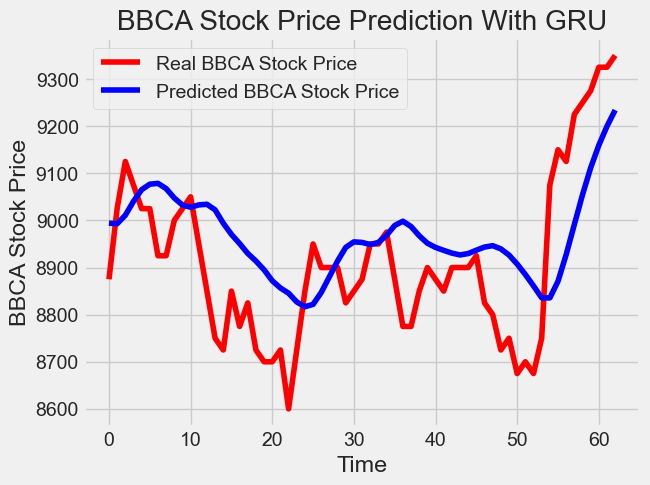

In [1276]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"]["2023-01":"2023-10-02"],BBCA["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
plot_predictions("BBCA", BBCA_medium_test,GRU_predicted_stock_price, gru_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2978296960.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


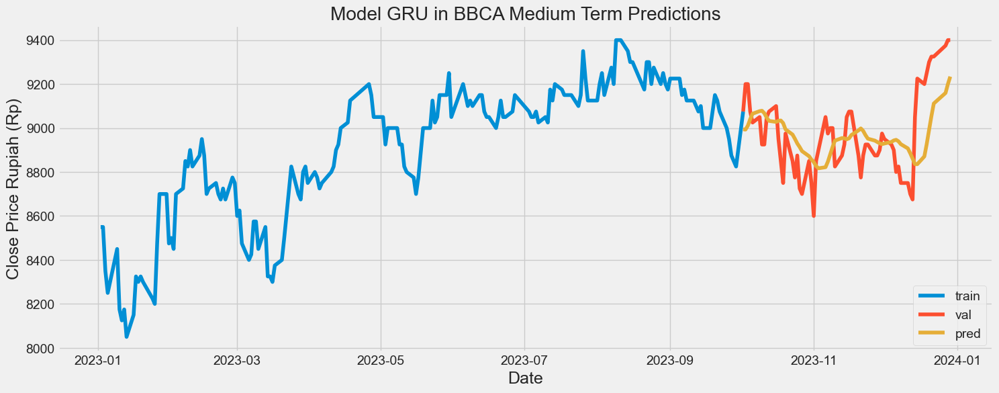

In [1277]:
# Visualize the data
# Plot the data
train = BBCA["2023-01":"2023-10-02"]
valid = BBCA["2023-10-02":"2023-12"]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in BBCA Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1278]:
# Evaluating the sequence
# Evaluating the sequence
rmse = return_rmse(BBCA_medium_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_medium_test,GRU_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('medium')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 143.62378382591785.
The root mean squared error after normalization is 0.1914983784345572.


#### RNN Predicitions

In [ ]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

In [ ]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 20 entires of test set have 20 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"]["2023-01":"2023-10-02"],BBCA["close"]["2023-10-02":"2023-12"]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_medium_test) - 20:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(20,len_test+20):
    X_test.append(inputs[i-20:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))


RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)

plot_predictions('BBCA', BBCA_medium_test,RNN_predicted_stock_price, rnn_title)

In [ ]:
# Visualize the data
# Plot the data
train = BBCA["2023-01":"2023-10-02"]
valid = BBCA["2023-10-02":"2023-12"]
valid['pred'] = RNN_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in BBCA Medium Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [ ]:

# Evaluating the sequence
rmse = return_rmse(BBCA_medium_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_medium_test,RNN_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('medium')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


## Long Term Predictions
Long term prediction using in this program is prediction in several year to predict next year.
Data use for this predictions is data 2020 - July 2024.
Data train and test is:
1. Data Train
    * Year 2020 - 2022
2. Data Test
    * Year 2023 - July 2024

### ADRO

#### Data Split

In [1279]:
ADRO_long_train = ADRO[:"2023"].iloc[:,3:4].values
ADRO_long_test = ADRO["2023":].iloc[:,3:4].values

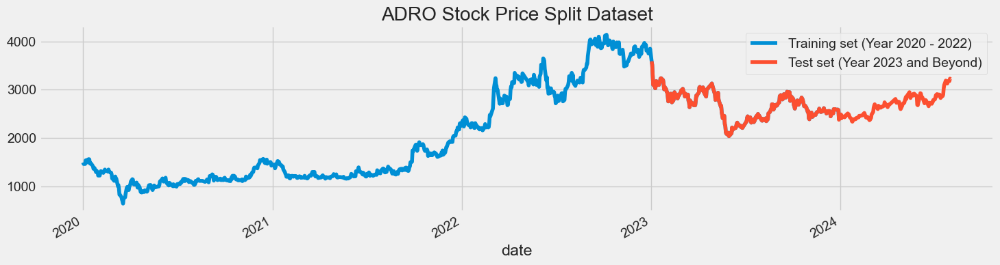

In [1280]:
ADRO["close"][:"2023"].plot(figsize=(16,4), legend=True)
ADRO["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('ADRO Stock Price Split Dataset')
plt.show()

In [1281]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ADRO_long_train)

In [1282]:
len_train = len(ADRO_long_train)
len_test = len(ADRO_long_test)
print(len_train, len_test)

974 372


In [1283]:
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [1284]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 108ms/step - loss: 0.0023
Epoch 2/50
29/29 [==============================] - 3s 114ms/step - loss: 0.0018
Epoch 3/50
29/29 [==============================] - 3s 114ms/step - loss: 0.0020
Epoch 4/50
29/29 [==============================] - 3s 115ms/step - loss: 0.0019
Epoch 5/50
29/29 [==============================] - 3s 111ms/step - loss: 0.0018
Epoch 6/50
29/29 [==============================] - 3s 112ms/step - loss: 0.0018
Epoch 7/50
29/29 [==============================] - 3s 114ms/step - loss: 0.0017
Epoch 8/50
29/29 [==============================] - 3s 110ms/step - loss: 0.0020
Epoch 9/50
29/29 [==============================] - 3s 110ms/step - loss: 0.0016
Epoch 10/50
29/29 [==============================] - 3s 104ms/step - loss: 0.0017
Epoch 11/50
29/29 [==============================] - 3s 99ms/step - loss: 0.0019
Epoch 12/50
29/29 [==============================] - 4s 128ms/step - loss: 0.0016
Epoch 13/50
29/29 [=======

12/12 [==============================] - 1s 40ms/step


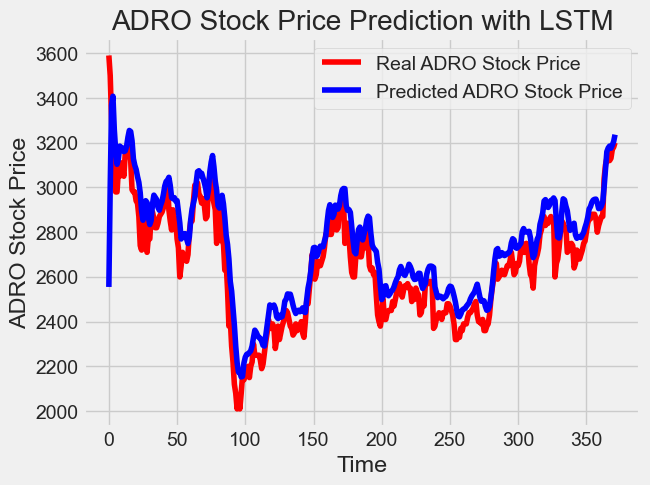

In [1285]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"][:"2023"],ADRO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ADRO', ADRO_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2162718566.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


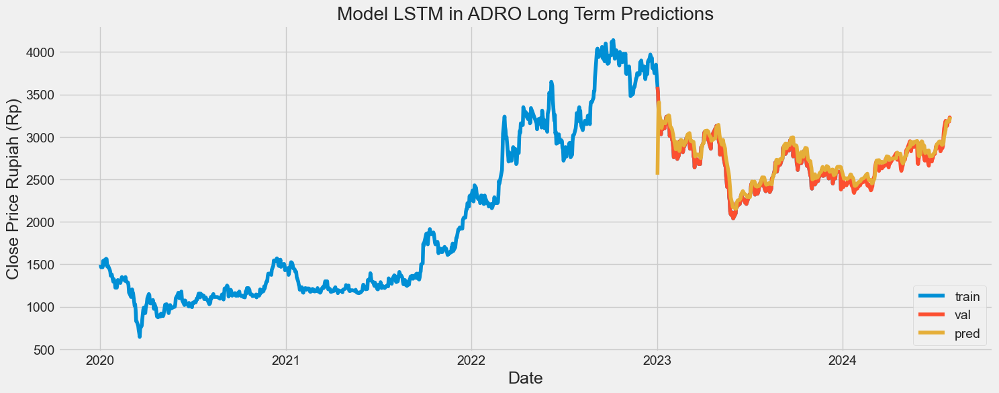

In [1286]:
# Visualize the data
# Plot the data
train = ADRO[:"2023"]
valid = ADRO["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ADRO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1287]:
# Evaluating the sequence
rmse = return_rmse(ADRO_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 123.09237780028003.
The root mean squared error after normalization is 0.07790656822802534.


#### GRU Predictions

In [1288]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 2s 225ms/step - loss: 0.0047
Epoch 2/50
7/7 [==============================] - 2s 219ms/step - loss: 0.0035
Epoch 3/50
7/7 [==============================] - 2s 217ms/step - loss: 0.0033
Epoch 4/50
7/7 [==============================] - 2s 216ms/step - loss: 0.0031
Epoch 5/50
7/7 [==============================] - 2s 219ms/step - loss: 0.0028
Epoch 6/50
7/7 [==============================] - 2s 224ms/step - loss: 0.0029
Epoch 7/50
7/7 [==============================] - 2s 251ms/step - loss: 0.0028
Epoch 8/50
7/7 [==============================] - 2s 264ms/step - loss: 0.0028
Epoch 9/50
7/7 [==============================] - 2s 267ms/step - loss: 0.0029
Epoch 10/50
7/7 [==============================] - 2s 274ms/step - loss: 0.0030
Epoch 11/50
7/7 [==============================] - 2s 264ms/step - loss: 0.0029
Epoch 12/50
7/7 [==============================] - 2s 260ms/step - loss: 0.0028
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 35ms/step


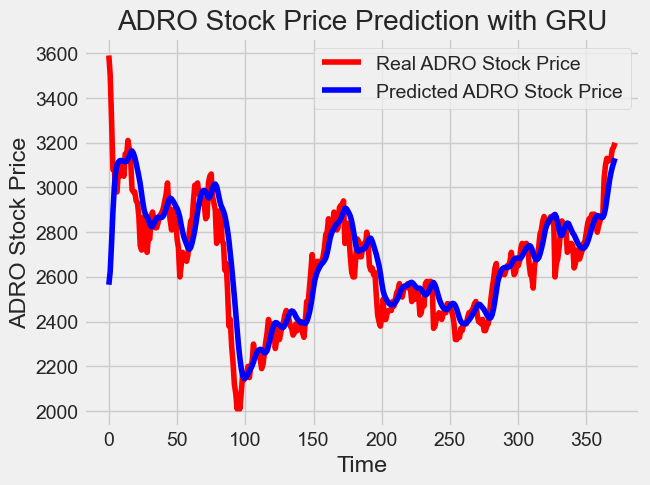

In [1289]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"][:"2023"],ADRO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('ADRO', ADRO_long_test,GRU_predicted_stock_price, GRU_title)

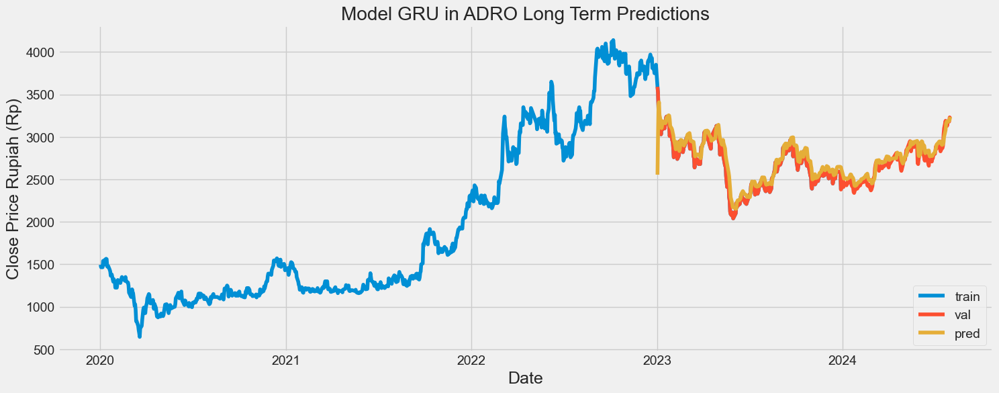

In [1290]:
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in ADRO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1291]:
# Evaluating the sequence
rmse = return_rmse(ADRO_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 128.2553807172798.
The root mean squared error after normalization is 0.08117429159321506.


#### RNN Predicitions

In [1292]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0034 - accuracy: 0.0022
Epoch 2/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0031 - accuracy: 0.0022
Epoch 3/50
29/29 [==============================] - 2s 54ms/step - loss: 0.0029 - accuracy: 0.0022
Epoch 4/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0030 - accuracy: 0.0022
Epoch 5/50
29/29 [==============================] - 2s 52ms/step - loss: 0.0029 - accuracy: 0.0022
Epoch 6/50
29/29 [==============================] - 2s 54ms/step - loss: 0.0034 - accuracy: 0.0022
Epoch 7/50
29/29 [==============================] - 2s 52ms/step - loss: 0.0029 - accuracy: 0.0022
Epoch 8/50
29/29 [==============================] - 2s 52ms/step - loss: 0.0029 - accuracy: 0.0022
Epoch 9/50
29/29 [==============================] - 2s 54ms/step - loss: 0.0029 - accuracy: 0.0022
Epoch 10/50
29/29 [==============================] - 2s 52ms/step - loss: 0.0026 - accuracy: 0.0022
Epoch 11/

12/12 [==============================] - 0s 14ms/step


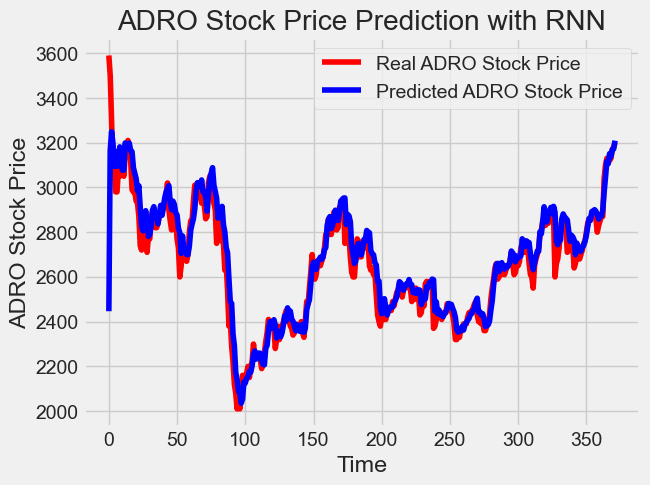

In [1293]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ADRO["close"][:"2023"],ADRO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ADRO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('ADRO', ADRO_long_test,RNN_predicted_stock_price, RNN_title)

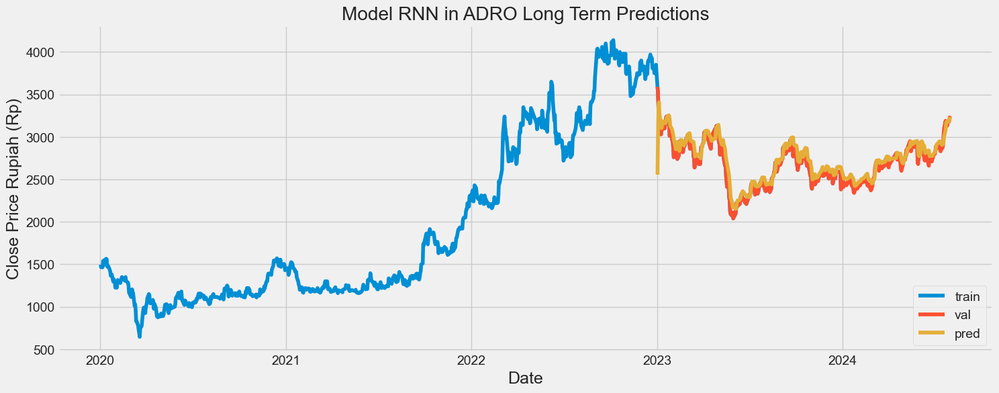

In [1294]:
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model RNN in ADRO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1295]:
# Evaluating the sequence
rmse = return_rmse(ADRO_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ADRO_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('ADRO')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 88.4218665254175.
The root mean squared error after normalization is 0.05596320666165665.


### AMMN

#### Data Split

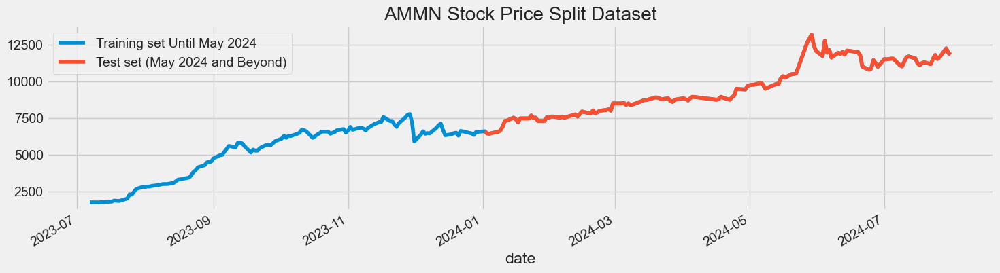

In [ ]:
AMMN_long_train = AMMN[:"2024-06"].iloc[:,3:4].values
AMMN_long_test = AMMN["2024-06":].iloc[:,3:4].values
AMMN["close"][:"2024-06"].plot(figsize=(16,4), legend=True)
AMMN["close"]["2024-06":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set Until May 2024","Test set (May 2024 and Beyond)"])
plt.title('AMMN Stock Price Split Dataset')
plt.show()

In [ ]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMMN_long_train)
len_train = len(AMMN_long_train)
len_test = len(AMMN_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

#### LSTM Predictions

In [ ]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

In [ ]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"][:"2024-06"],AMMN["close"]["2024-06":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMMN', AMMN_long_test,LSTM_predicted_stock_price, lstm_title)

In [ ]:
# Visualize the data
# Plot the data
train = AMMN[:"2024-06"]
valid = AMMN["2024-06":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMMN Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [ ]:
# Evaluating the sequence
rmse = return_rmse(AMMN_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


#### GRU Predicitions

In [ ]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

In [ ]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"][:"2024-06"],AMMN["close"]["2024-06":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMMN', AMMN_long_test,GRU_predicted_stock_price, GRU_title)

In [ ]:
# Visualize the data
# Plot the data
train = AMMN[:"2024-06"]
valid = AMMN["2024-06":]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMMN Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [ ]:
# Evaluating the sequence
rmse = return_rmse(AMMN_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


#### RNN Predictions

In [ ]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

In [ ]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMMN["close"][:"2024-06"],AMMN["close"]["2024-06":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMMN_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMMN', AMMN_long_test,RNN_predicted_stock_price, RNN_title)

In [ ]:
# Visualize the data
# Visualize the data
# Plot the data
train = AMMN[:"2024-06"]
valid = AMMN["2024-06":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMMN Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [ ]:
# Evaluating the sequence
rmse = return_rmse(AMMN_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMMN_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMMN')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


### AMRT

#### Data Split

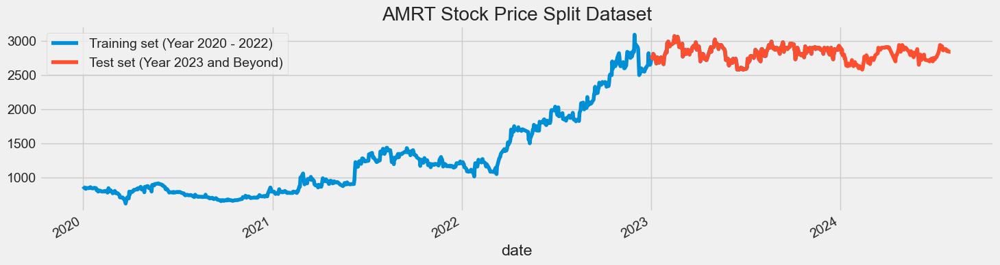

In [1297]:
AMRT_long_train = AMRT[:"2023"].iloc[:,3:4].values
AMRT_long_test = AMRT["2023":].iloc[:,3:4].values
AMRT["close"][:"2023"].plot(figsize=(16,4), legend=True)
AMRT["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('AMRT Stock Price Split Dataset')
plt.show()

In [1298]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(AMRT_long_train)
len_train = len(AMRT_long_train)
len_test = len(AMRT_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [1299]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0020
Epoch 2/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0018
Epoch 3/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0020
Epoch 4/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0020
Epoch 5/50
29/29 [==============================] - 3s 96ms/step - loss: 0.0021
Epoch 6/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0019
Epoch 7/50
29/29 [==============================] - 3s 105ms/step - loss: 0.0018
Epoch 8/50
29/29 [==============================] - 3s 103ms/step - loss: 0.0019
Epoch 9/50
29/29 [==============================] - 3s 106ms/step - loss: 0.0020
Epoch 10/50
29/29 [==============================] - 3s 106ms/step - loss: 0.0018
Epoch 11/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0019
Epoch 12/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0019
Epoch 13/50
29/29 [=============

12/12 [==============================] - 0s 35ms/step


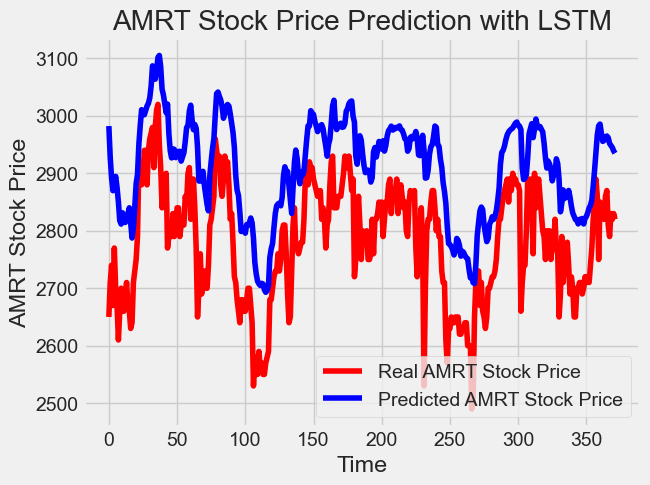

In [1300]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"][:"2023"],AMRT["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('AMRT', AMRT_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2398016394.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


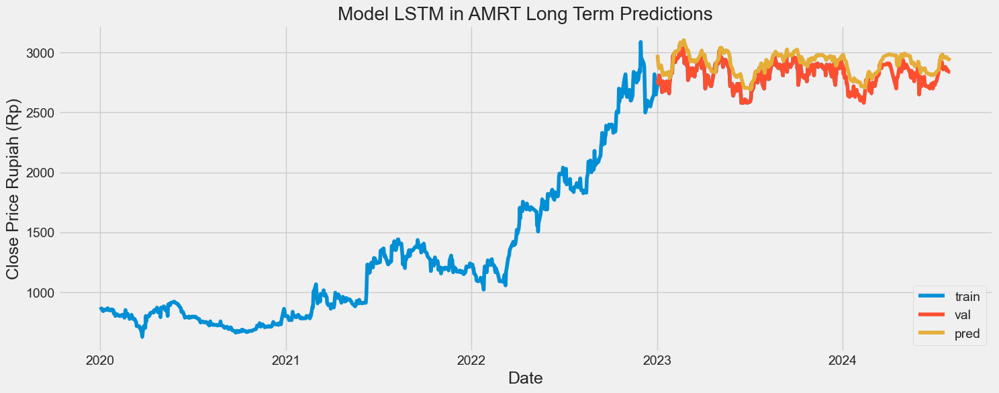

In [1301]:
# Visualize the data
# Plot the data
train = AMRT[:"2023"]
valid = AMRT["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in AMRT Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1302]:
# Evaluating the sequence
rmse = return_rmse(AMRT_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 138.09749912483974.
The root mean squared error after normalization is 0.2245026137184949.


#### GRU Predictions

In [1303]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50


7/7 [==============================] - 2s 236ms/step - loss: 0.0033
Epoch 2/50
7/7 [==============================] - 2s 223ms/step - loss: 0.0032
Epoch 3/50
7/7 [==============================] - 2s 242ms/step - loss: 0.0031
Epoch 4/50
7/7 [==============================] - 2s 233ms/step - loss: 0.0032
Epoch 5/50
7/7 [==============================] - 2s 225ms/step - loss: 0.0031
Epoch 6/50
7/7 [==============================] - 2s 229ms/step - loss: 0.0031
Epoch 7/50
7/7 [==============================] - 2s 225ms/step - loss: 0.0030
Epoch 8/50
7/7 [==============================] - 1s 206ms/step - loss: 0.0031
Epoch 9/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0033
Epoch 10/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0033
Epoch 11/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0031
Epoch 12/50
7/7 [==============================] - 2s 214ms/step - loss: 0.0033
Epoch 13/50
7/7 [==============================] - 1s 206ms/

12/12 [==============================] - 1s 41ms/step


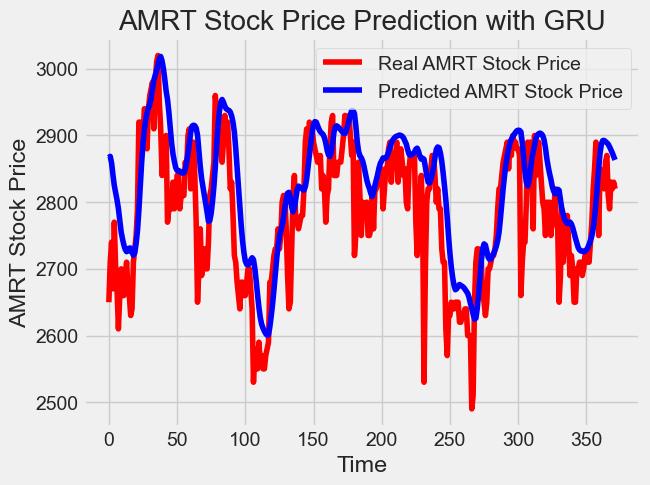

In [1304]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"][:"2023"],AMRT["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('AMRT', AMRT_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\785506514.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


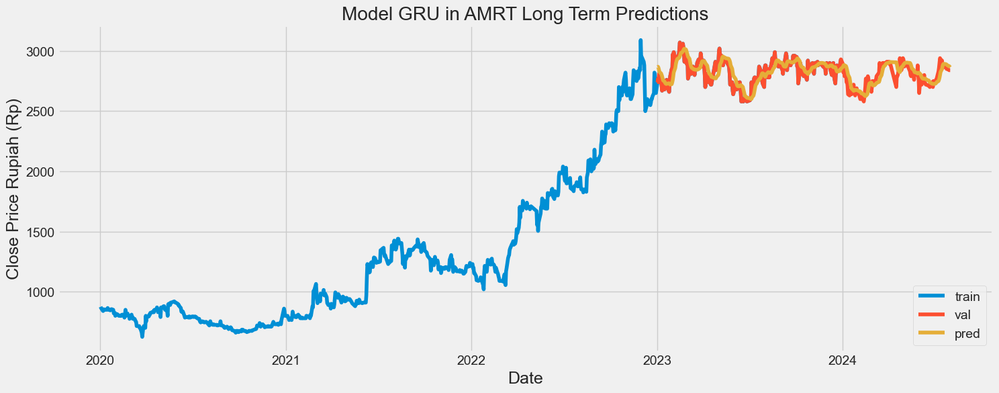

In [1305]:
# Visualize the data
# Plot the data
train = AMRT[:"2023"]
valid = AMRT["2023":]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in AMRT Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1306]:
# Evaluating the sequence
rmse = return_rmse(AMRT_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 78.18242197633813.
The root mean squared error after normalization is 0.14751400372893989.


#### RNN Predictions

In [1307]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 48ms/step - loss: 0.0023 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0024 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0025 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0026 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0026 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0026 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 2s 54ms/step - loss: 0.0023 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 50ms/step - loss: 0.0027 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 51ms/step - loss: 0.0025 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0026 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 15ms/step


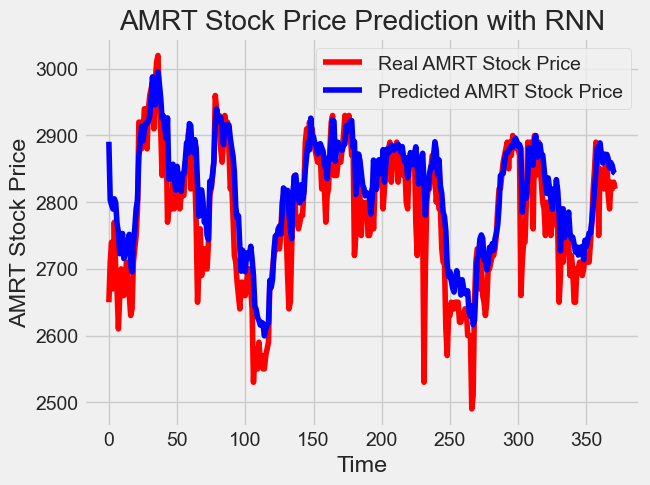

In [1308]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((AMRT["close"][:"2023"],AMRT["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(AMRT_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('AMRT', AMRT_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1992500669.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


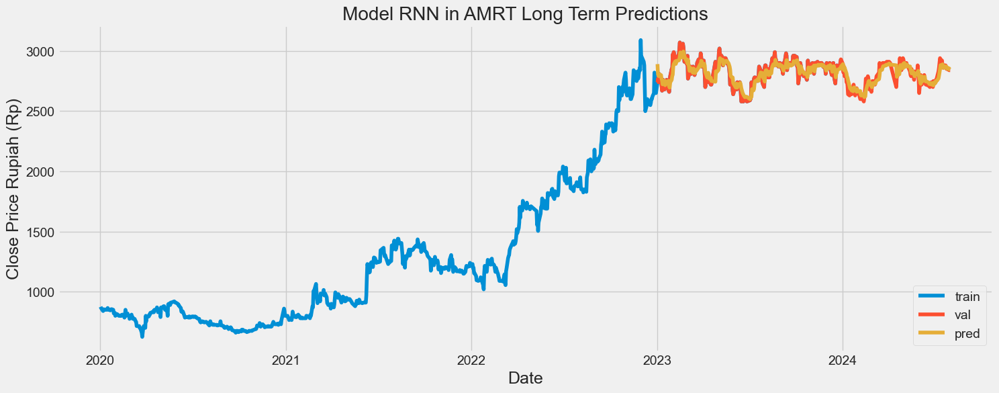

In [1309]:
# Visualize the data
# Visualize the data
# Plot the data
train = AMRT[:"2023"]
valid = AMRT["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in AMRT Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1310]:
# Evaluating the sequence
rmse = return_rmse(AMRT_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(AMRT_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('AMRT')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 57.599056168315.
The root mean squared error after normalization is 0.10867746446851885.


### ASII

#### Data Split

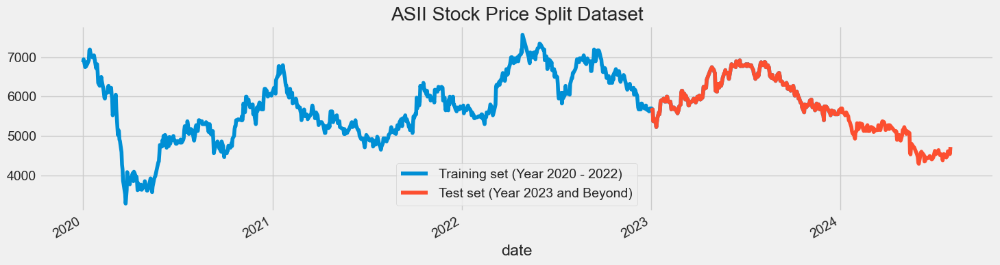

In [1311]:
ASII_long_train = ASII[:"2023"].iloc[:,3:4].values
ASII_long_test = ASII["2023":].iloc[:,3:4].values
ASII["close"][:"2023"].plot(figsize=(16,4), legend=True)
ASII["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('ASII Stock Price Split Dataset')
plt.show()

In [1312]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(ASII_long_train)
len_train = len(ASII_long_train)
len_test = len(ASII_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [1313]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0020
Epoch 2/50
29/29 [==============================] - 3s 103ms/step - loss: 0.0020
Epoch 3/50
29/29 [==============================] - 3s 104ms/step - loss: 0.0020
Epoch 4/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0020
Epoch 5/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0019
Epoch 6/50
29/29 [==============================] - 4s 136ms/step - loss: 0.0019
Epoch 7/50
29/29 [==============================] - 3s 101ms/step - loss: 0.0018
Epoch 8/50
29/29 [==============================] - 3s 102ms/step - loss: 0.0019
Epoch 9/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0019
Epoch 10/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0018
Epoch 11/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0018
Epoch 12/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0016
Epoch 13/50
29/29 [==========

12/12 [==============================] - 0s 34ms/step


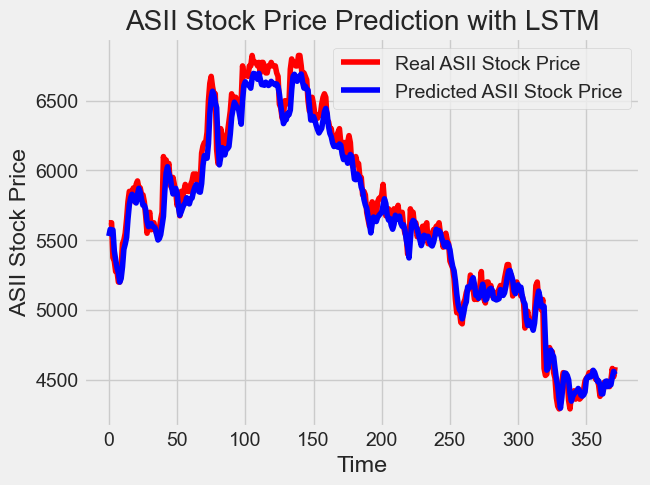

In [1314]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"][:"2023"],ASII["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('ASII', ASII_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\4118180660.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


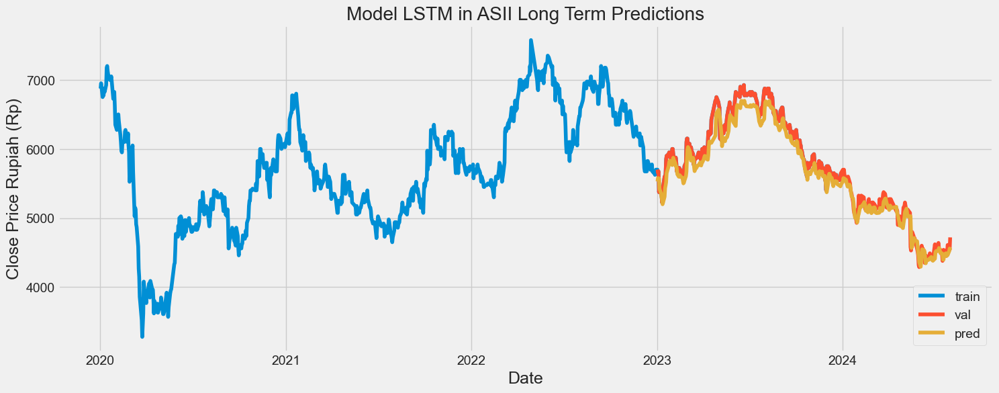

In [1315]:
# Visualize the data
# Plot the data
train = ASII[:"2023"]
valid = ASII["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in ASII Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1316]:
# Evaluating the sequence
rmse = return_rmse(ASII_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 95.9459111485251.
The root mean squared error after normalization is 0.03784848566016768.


#### GRU Predictions

In [1317]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 2s 214ms/step - loss: 0.0031
Epoch 2/50
7/7 [==============================] - 1s 207ms/step - loss: 0.0033
Epoch 3/50
7/7 [==============================] - 2s 230ms/step - loss: 0.0030
Epoch 4/50
7/7 [==============================] - 2s 224ms/step - loss: 0.0031
Epoch 5/50
7/7 [==============================] - 2s 228ms/step - loss: 0.0032
Epoch 6/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0031
Epoch 7/50
7/7 [==============================] - 1s 202ms/step - loss: 0.0029
Epoch 8/50
7/7 [==============================] - 1s 212ms/step - loss: 0.0031
Epoch 9/50
7/7 [==============================] - 1s 210ms/step - loss: 0.0029
Epoch 10/50
7/7 [==============================] - 2s 216ms/step - loss: 0.0030
Epoch 11/50
7/7 [==============================] - 1s 210ms/step - loss: 0.0029
Epoch 12/50
7/7 [==============================] - 2s 240ms/step - loss: 0.0029
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 34ms/step


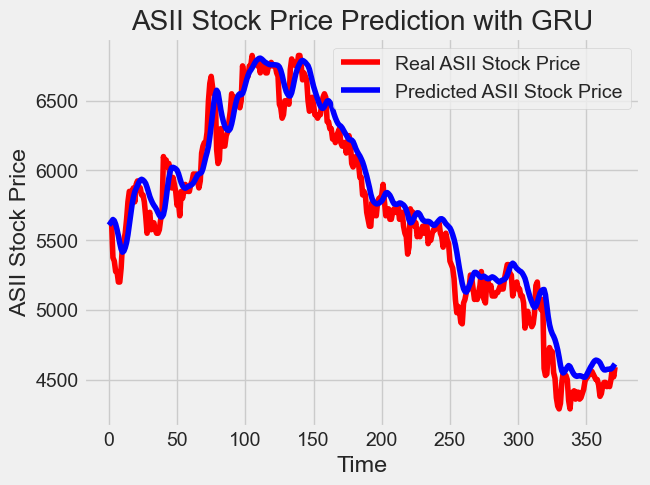

In [1318]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"][:"2023"],ASII["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('ASII', ASII_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3232990028.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


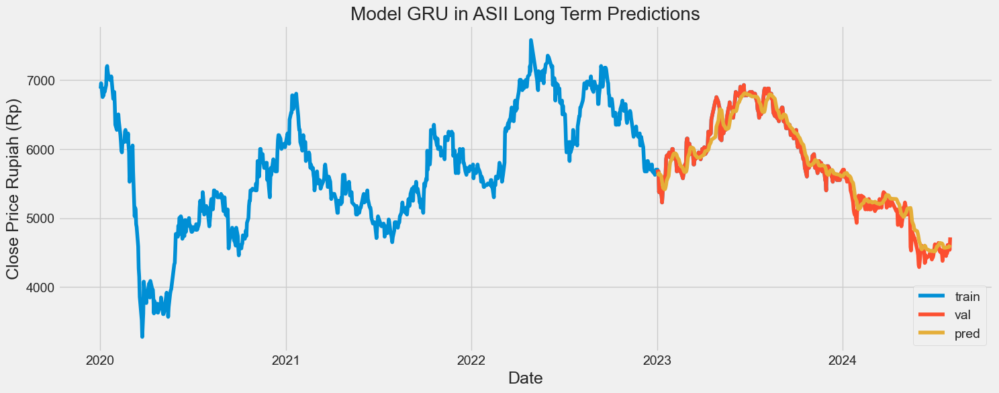

In [1319]:
# Visualize the data
# Visualize the data
# Plot the data
train = ASII[:"2023"]
valid = ASII["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in ASII Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1320]:
# Evaluating the sequence
rmse = return_rmse(ASII_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 164.2748083809242.
The root mean squared error after normalization is 0.06480268575184386.


#### RNN Predictions

In [1321]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 2s 54ms/step - loss: 0.0023 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 2s 56ms/step - loss: 0.0021 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 2s 57ms/step - loss: 0.0020 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 3s 96ms/step - loss: 0.0020 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0020 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0021 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0020 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0018 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 2s 53ms/step - loss: 0.0016 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 2s 52ms/step - loss: 0.0019 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 15ms/step


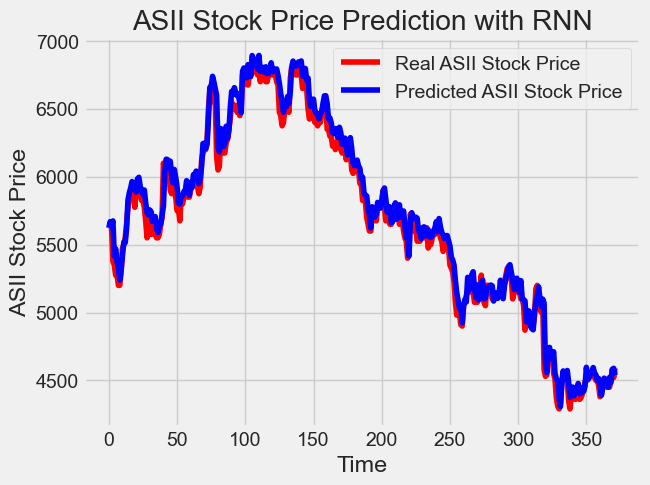

In [1322]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((ASII["close"][:"2023"],ASII["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(ASII_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('ASII', ASII_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2411556250.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


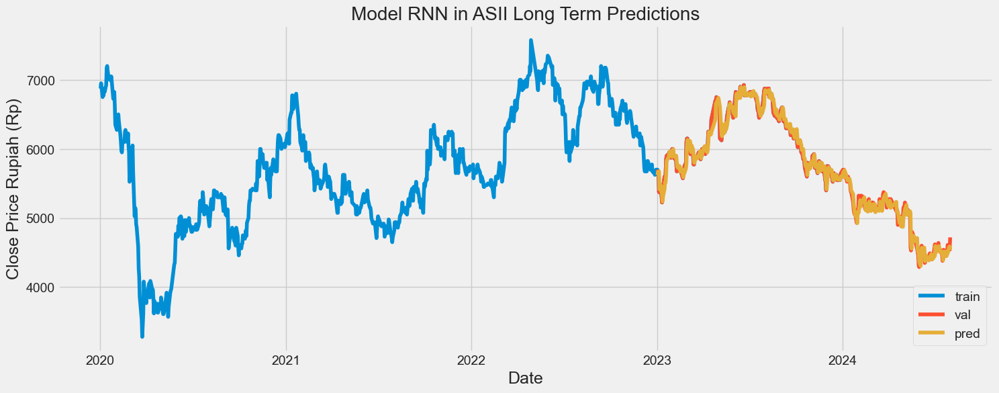

In [1323]:
# Visualize the data
# Visualize the data
# Plot the data
train = ASII[:"2023"]
valid = ASII["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in ASII Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1324]:
# Evaluating the sequence
rmse = return_rmse(ASII_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(ASII_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('ASII')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 90.11883126611882.
The root mean squared error after normalization is 0.03461810887080575.


### GOTO

#### Data Split

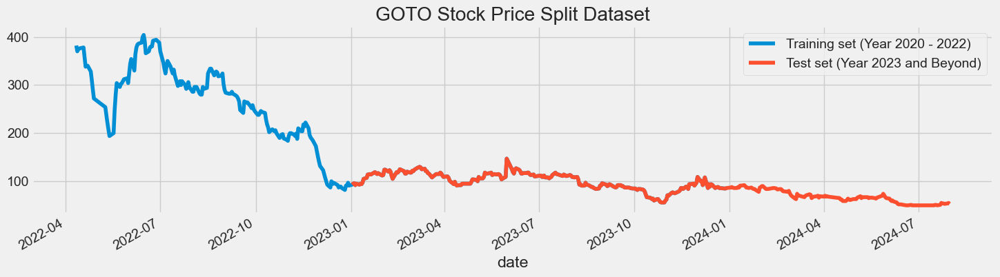

In [1325]:
GOTO_long_train = GOTO[:"2023"].iloc[:,3:4].values
GOTO_long_test = GOTO["2023":].iloc[:,3:4].values
GOTO["close"][:"2023"].plot(figsize=(16,4), legend=True)
GOTO["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('GOTO Stock Price Split Dataset')
plt.show()

In [1326]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(GOTO_long_train)
len_train = len(GOTO_long_train)
len_test = len(GOTO_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

418 372


#### LSTM Predictions

In [1327]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
12/12 [==============================] - 1s 114ms/step - loss: 0.0017
Epoch 2/50
12/12 [==============================] - 1s 119ms/step - loss: 0.0019
Epoch 3/50
12/12 [==============================] - 1s 111ms/step - loss: 0.0026
Epoch 4/50
12/12 [==============================] - 1s 102ms/step - loss: 0.0017
Epoch 5/50
12/12 [==============================] - 1s 98ms/step - loss: 0.0022
Epoch 6/50
12/12 [==============================] - 1s 101ms/step - loss: 0.0016
Epoch 7/50
12/12 [==============================] - 2s 126ms/step - loss: 0.0018
Epoch 8/50
12/12 [==============================] - 2s 133ms/step - loss: 0.0014
Epoch 9/50
12/12 [==============================] - 1s 88ms/step - loss: 0.0023
Epoch 10/50
12/12 [==============================] - 1s 91ms/step - loss: 0.0020
Epoch 11/50
12/12 [==============================] - 1s 98ms/step - loss: 0.0018
Epoch 12/50
12/12 [==============================] - 1s 83ms/step - loss: 0.0015
Epoch 13/50
12/12 [===========

12/12 [==============================] - 0s 34ms/step


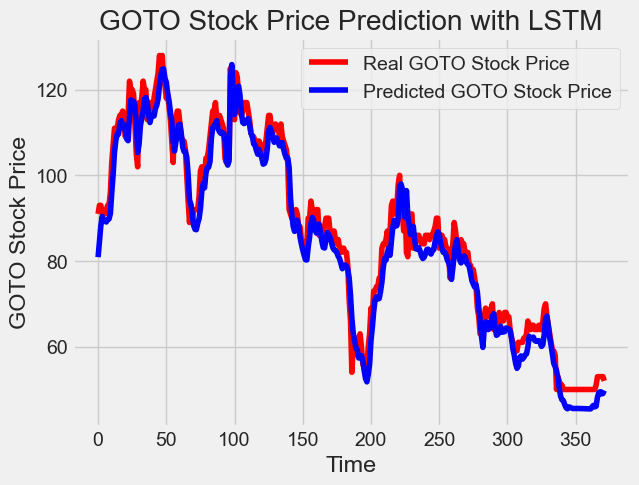

In [1328]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"][:"2023"],GOTO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('GOTO', GOTO_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1677187012.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


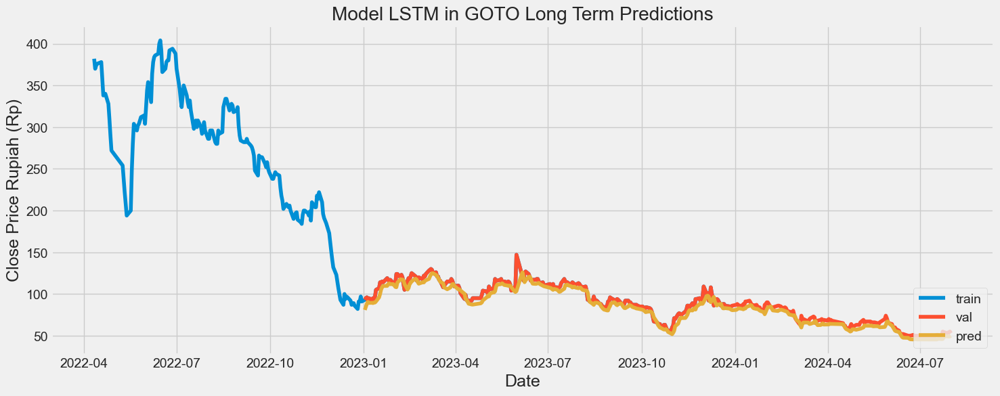

In [1329]:
# Visualize the data
# Plot the data
train = GOTO[:"2023"]
valid = GOTO["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in GOTO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1330]:
# Evaluating the sequence
rmse = return_rmse(GOTO_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 3.9642008663731563.
The root mean squared error after normalization is 0.04802872059323743.


#### GRU Predictions


In [1331]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
3/3 [==============================] - 1s 178ms/step - loss: 0.0038
Epoch 2/50
3/3 [==============================] - 1s 160ms/step - loss: 0.0037
Epoch 3/50
3/3 [==============================] - 1s 146ms/step - loss: 0.0035
Epoch 4/50
3/3 [==============================] - 0s 153ms/step - loss: 0.0032
Epoch 5/50
3/3 [==============================] - 1s 153ms/step - loss: 0.0034
Epoch 6/50
3/3 [==============================] - 0s 151ms/step - loss: 0.0035
Epoch 7/50
3/3 [==============================] - 0s 147ms/step - loss: 0.0033
Epoch 8/50
3/3 [==============================] - 1s 160ms/step - loss: 0.0034
Epoch 9/50
3/3 [==============================] - 1s 166ms/step - loss: 0.0033
Epoch 10/50
3/3 [==============================] - 1s 167ms/step - loss: 0.0031
Epoch 11/50
3/3 [==============================] - 1s 169ms/step - loss: 0.0029
Epoch 12/50
3/3 [==============================] - 1s 166ms/step - loss: 0.0033
Epoch 13/50
3/3 [==============================] 

12/12 [==============================] - 0s 34ms/step


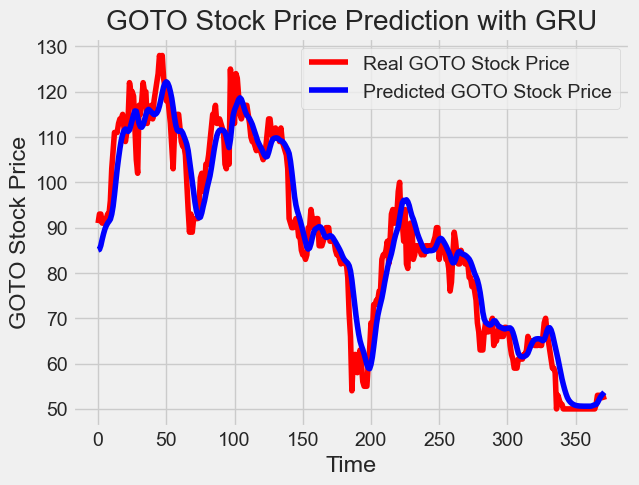

In [1332]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"][:"2023"],GOTO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('GOTO', GOTO_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\2023922229.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


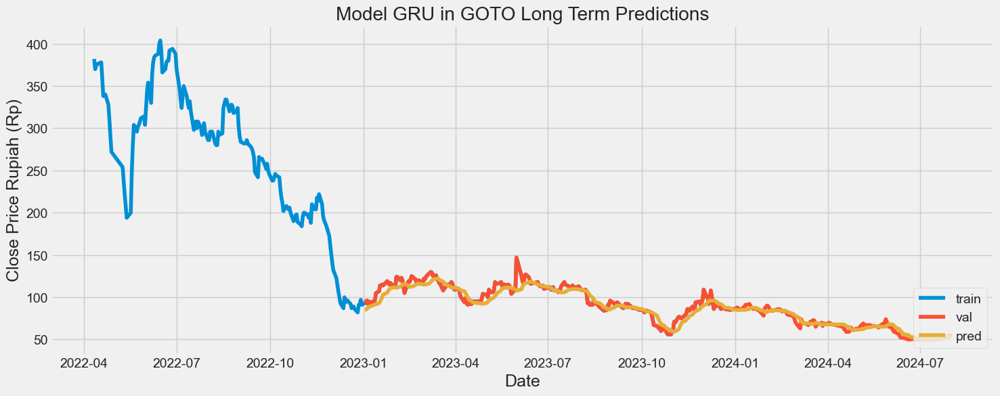

In [1333]:
# Visualize the data
# Plot the data
train = GOTO[:"2023"]
valid = GOTO["2023":]
valid['pred'] = GRU_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model GRU in GOTO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1334]:
# Evaluating the sequence
rmse = return_rmse(GOTO_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 5.424106400825208.
The root mean squared error after normalization is 0.06953982565160524.


#### RNN Predictions

In [1335]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
12/12 [==============================] - 1s 55ms/step - loss: 0.0018 - accuracy: 0.0028
Epoch 2/50
12/12 [==============================] - 1s 43ms/step - loss: 0.0018 - accuracy: 0.0028
Epoch 3/50
12/12 [==============================] - 1s 43ms/step - loss: 0.0027 - accuracy: 0.0028
Epoch 4/50
12/12 [==============================] - 1s 44ms/step - loss: 0.0020 - accuracy: 0.0028
Epoch 5/50
12/12 [==============================] - 0s 41ms/step - loss: 0.0020 - accuracy: 0.0028
Epoch 6/50
12/12 [==============================] - 0s 41ms/step - loss: 0.0017 - accuracy: 0.0028
Epoch 7/50
12/12 [==============================] - 1s 43ms/step - loss: 0.0017 - accuracy: 0.0028
Epoch 8/50
12/12 [==============================] - 1s 42ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 9/50
12/12 [==============================] - 1s 44ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 10/50
12/12 [==============================] - 1s 42ms/step - loss: 0.0015 - accuracy: 0.0028
Epoch 11/

12/12 [==============================] - 0s 13ms/step


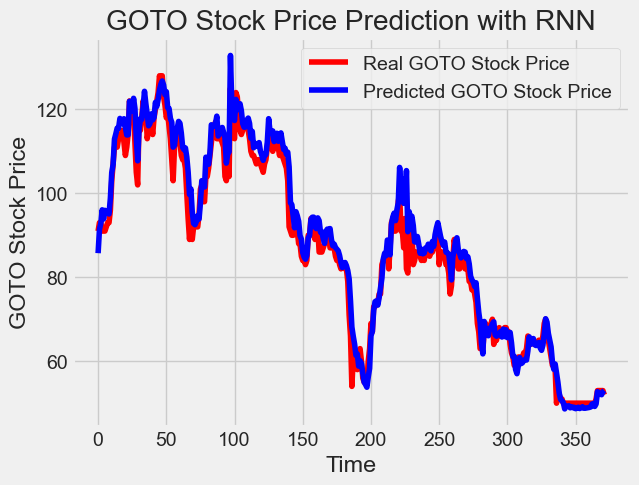

In [1336]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((GOTO["close"][:"2023"],GOTO["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(GOTO_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('GOTO', GOTO_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\223507426.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


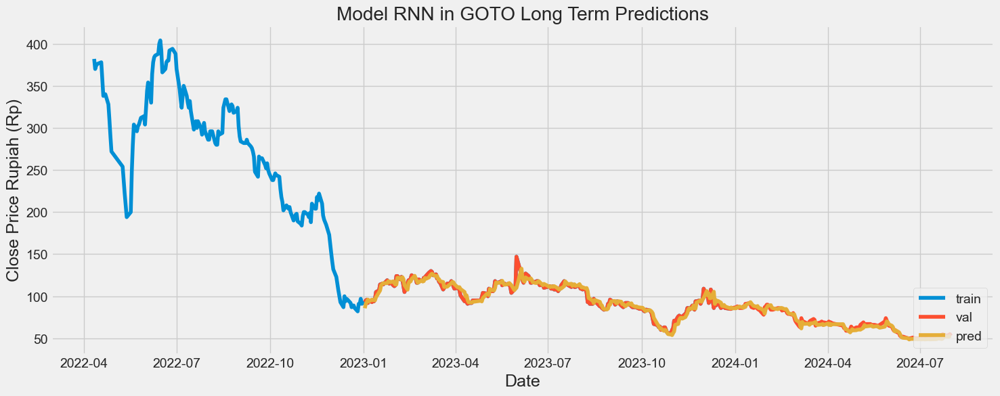

In [1337]:
# Visualize the data
# Visualize the data
# Plot the data
train = GOTO[:"2023"]
valid = GOTO["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in GOTO Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1338]:
# Evaluating the sequence
rmse = return_rmse(GOTO_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(GOTO_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('GOTO')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 3.7935942260339526.
The root mean squared error after normalization is 0.04505498946234027.


### KLBF

#### Data Split

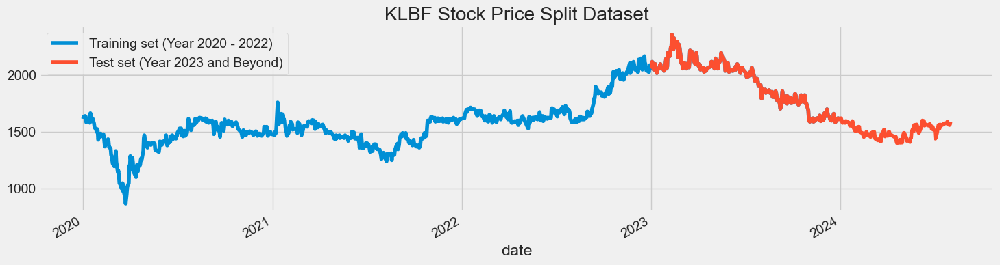

In [1339]:
KLBF_long_train = KLBF[:"2023"].iloc[:,3:4].values
KLBF_long_test = KLBF["2023":].iloc[:,3:4].values
KLBF["close"][:"2023"].plot(figsize=(16,4), legend=True)
KLBF["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('KLBF Stock Price Split Dataset')
plt.show()

In [1340]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(KLBF_long_train)
len_train = len(KLBF_long_train)
len_test = len(KLBF_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [1341]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50


29/29 [==============================] - 3s 87ms/step - loss: 0.0012
Epoch 2/50
29/29 [==============================] - 3s 96ms/step - loss: 0.0012
Epoch 3/50
29/29 [==============================] - 3s 103ms/step - loss: 0.0012
Epoch 4/50
29/29 [==============================] - 3s 112ms/step - loss: 0.0011
Epoch 5/50
29/29 [==============================] - 2s 85ms/step - loss: 0.0011
Epoch 6/50
29/29 [==============================] - 3s 100ms/step - loss: 0.0011
Epoch 7/50
29/29 [==============================] - 3s 95ms/step - loss: 9.4243e-04
Epoch 8/50
29/29 [==============================] - 4s 127ms/step - loss: 0.0011
Epoch 9/50
29/29 [==============================] - 3s 98ms/step - loss: 9.9694e-04
Epoch 10/50
29/29 [==============================] - 3s 100ms/step - loss: 9.9533e-04
Epoch 11/50
29/29 [==============================] - 3s 88ms/step - loss: 9.8169e-04
Epoch 12/50
29/29 [==============================] - 3s 91ms/step - loss: 0.0010
Epoch 13/50
29/29 [========

12/12 [==============================] - 0s 29ms/step


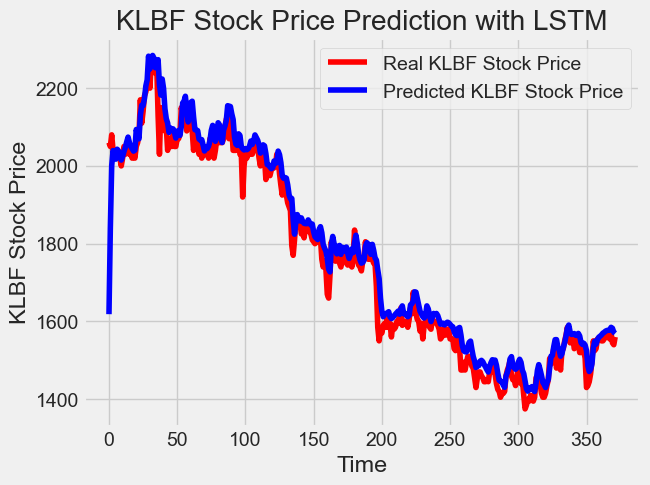

In [1342]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"][:"2023"],KLBF["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('KLBF', KLBF_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1644974751.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


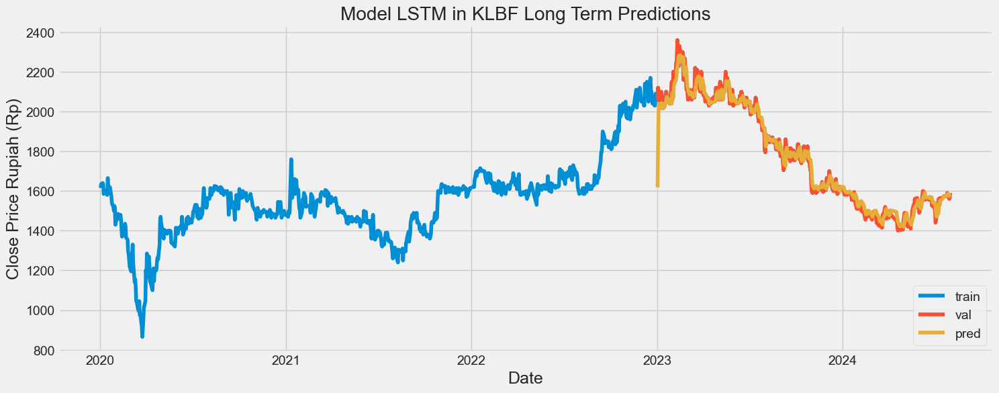

In [1343]:
# Visualize the data
# Plot the data
train = KLBF[:"2023"]
valid = KLBF["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in KLBF Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1344]:
# Evaluating the sequence
rmse = return_rmse(KLBF_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 45.98392640454346.
The root mean squared error after normalization is 0.05058146819950001.


#### GRU Predictions

In [1345]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 2s 215ms/step - loss: 0.0020
Epoch 2/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0017
Epoch 3/50
7/7 [==============================] - 2s 253ms/step - loss: 0.0019
Epoch 4/50
7/7 [==============================] - 2s 209ms/step - loss: 0.0017
Epoch 5/50
7/7 [==============================] - 2s 223ms/step - loss: 0.0017
Epoch 6/50
7/7 [==============================] - 2s 221ms/step - loss: 0.0015
Epoch 7/50
7/7 [==============================] - 2s 298ms/step - loss: 0.0017
Epoch 8/50
7/7 [==============================] - 2s 219ms/step - loss: 0.0018
Epoch 9/50
7/7 [==============================] - 1s 190ms/step - loss: 0.0017
Epoch 10/50
7/7 [==============================] - 1s 192ms/step - loss: 0.0017
Epoch 11/50
7/7 [==============================] - 2s 231ms/step - loss: 0.0017
Epoch 12/50
7/7 [==============================] - 1s 188ms/step - loss: 0.0015
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 1s 49ms/step


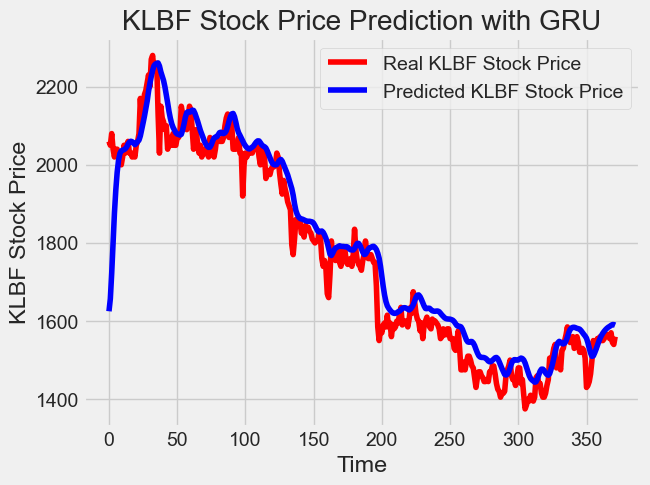

In [1346]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"][:"2023"],KLBF["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('KLBF', KLBF_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\4045285853.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


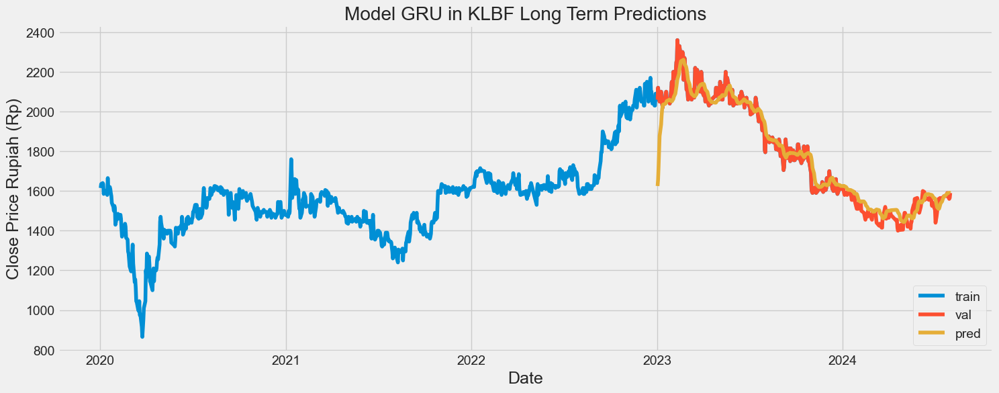

In [1347]:
# Visualize the data
# Visualize the data
# Plot the data
train = KLBF[:"2023"]
valid = KLBF["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in KLBF Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1348]:
# Evaluating the sequence
rmse = return_rmse(KLBF_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 66.02503400129554.
The root mean squared error after normalization is 0.0729558386754647.


#### RNN Predictions

In [1349]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50


29/29 [==============================] - 2s 62ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 2s 52ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 49ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 2s 56ms/step - loss: 9.7673e-04 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 2s 55ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 44ms/step - loss: 0.0011 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 47ms/step - loss: 9.8653e-04 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 49ms/step - loss: 0.0011 - accuracy: 0.0011
Epoch 11/50


12/12 [==============================] - 0s 15ms/step


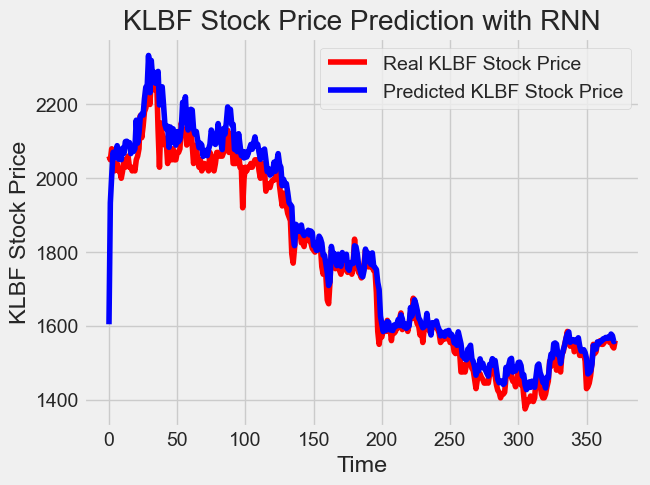

In [1350]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((KLBF["close"][:"2023"],KLBF["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(KLBF_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('KLBF', KLBF_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\449212558.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


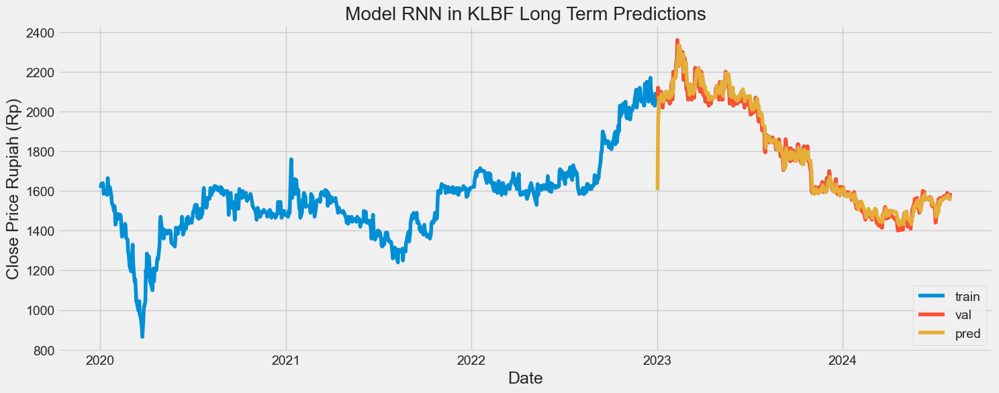

In [1351]:
# Visualize the data
# Visualize the data
# Plot the data
train = KLBF[:"2023"]
valid = KLBF["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in KLBF Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1352]:
# Evaluating the sequence
rmse = return_rmse(KLBF_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(KLBF_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('KLBF')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 49.48766072744712.
The root mean squared error after normalization is 0.051667694322055244.


### MAPI

#### Data Split

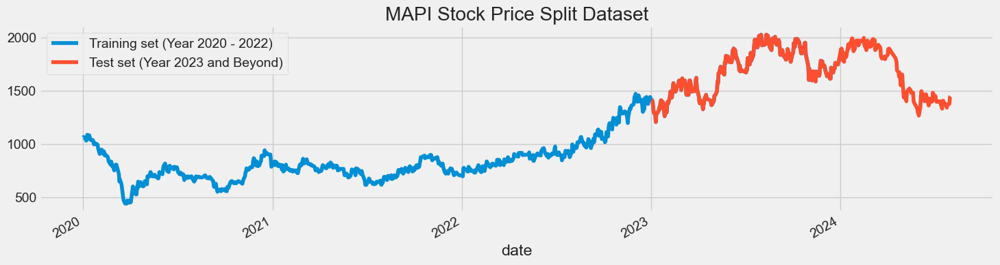

In [1353]:
MAPI_long_train = MAPI[:"2023"].iloc[:,3:4].values
MAPI_long_test = MAPI["2023":].iloc[:,3:4].values
MAPI["close"][:"2023"].plot(figsize=(16,4), legend=True)
MAPI["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('MAPI Stock Price Split Dataset')
plt.show()

In [1354]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(MAPI_long_train)
len_train = len(MAPI_long_train)
len_test = len(MAPI_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [1355]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0013
Epoch 2/50
29/29 [==============================] - 4s 128ms/step - loss: 0.0013
Epoch 3/50
29/29 [==============================] - 3s 118ms/step - loss: 0.0012
Epoch 4/50
29/29 [==============================] - 3s 102ms/step - loss: 0.0011
Epoch 5/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0014
Epoch 6/50
29/29 [==============================] - 3s 93ms/step - loss: 0.0014
Epoch 7/50
29/29 [==============================] - 2s 84ms/step - loss: 0.0012
Epoch 8/50
29/29 [==============================] - 2s 83ms/step - loss: 0.0013
Epoch 9/50
29/29 [==============================] - 3s 90ms/step - loss: 0.0012
Epoch 10/50
29/29 [==============================] - 3s 97ms/step - loss: 0.0012
Epoch 11/50
29/29 [==============================] - 3s 94ms/step - loss: 0.0012
Epoch 12/50
29/29 [==============================] - 3s 89ms/step - loss: 0.0013
Epoch 13/50
29/29 [===============

12/12 [==============================] - 1s 38ms/step


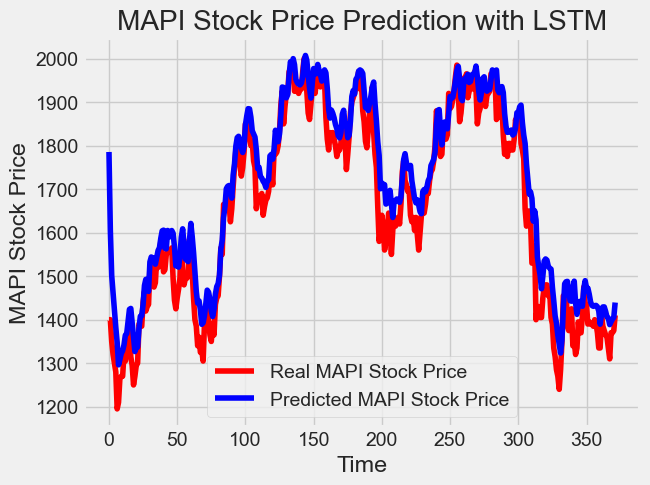

In [1356]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"][:"2023"],MAPI["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('MAPI', MAPI_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\843151874.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


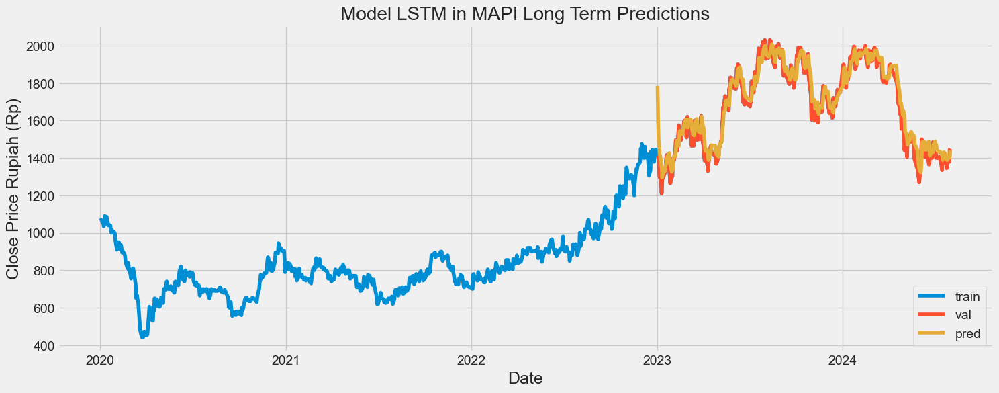

In [1357]:
# Visualize the data
# Plot the data
train = MAPI[:"2023"]
valid = MAPI["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in MAPI Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1358]:
# Evaluating the sequence
rmse = return_rmse(MAPI_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 66.28021112644811.
The root mean squared error after normalization is 0.0816030825190115.


#### GRU Predictions

In [1359]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 2s 280ms/step - loss: 0.0023
Epoch 2/50
7/7 [==============================] - 1s 183ms/step - loss: 0.0021
Epoch 3/50
7/7 [==============================] - 1s 187ms/step - loss: 0.0024
Epoch 4/50
7/7 [==============================] - 1s 200ms/step - loss: 0.0022
Epoch 5/50
7/7 [==============================] - 1s 201ms/step - loss: 0.0023
Epoch 6/50
7/7 [==============================] - 1s 186ms/step - loss: 0.0022
Epoch 7/50
7/7 [==============================] - 1s 186ms/step - loss: 0.0023
Epoch 8/50
7/7 [==============================] - 1s 189ms/step - loss: 0.0021
Epoch 9/50
7/7 [==============================] - 1s 196ms/step - loss: 0.0022
Epoch 10/50
7/7 [==============================] - 1s 191ms/step - loss: 0.0022
Epoch 11/50
7/7 [==============================] - 1s 199ms/step - loss: 0.0023
Epoch 12/50
7/7 [==============================] - 1s 185ms/step - loss: 0.0022
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 33ms/step


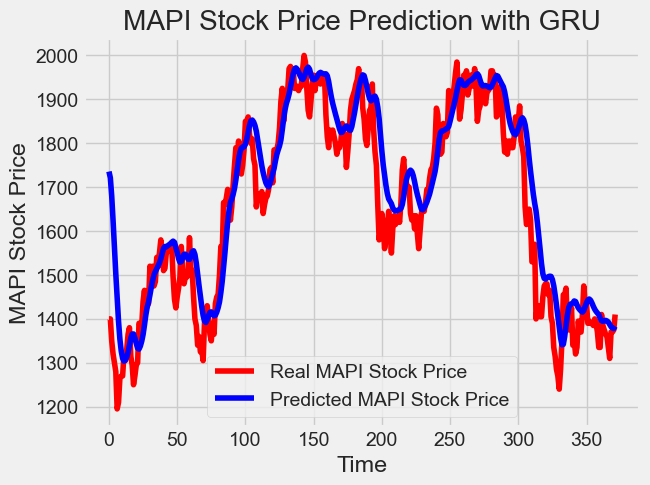

In [1360]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"][:"2023"],MAPI["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('MAPI', MAPI_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3299424182.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


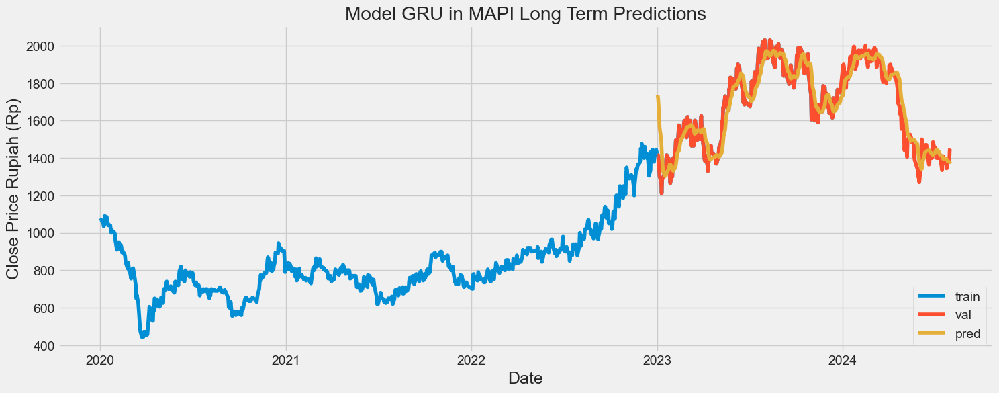

In [1361]:
# Visualize the data
# Visualize the data
# Plot the data
train = MAPI[:"2023"]
valid = MAPI["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in MAPI Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1362]:
# Evaluating the sequence
rmse = return_rmse(MAPI_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 83.66107261039299.
The root mean squared error after normalization is 0.10392679827378011.


#### RNN Predictions

In [1363]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 40ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 41ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 45ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 48ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 47ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 22ms/step


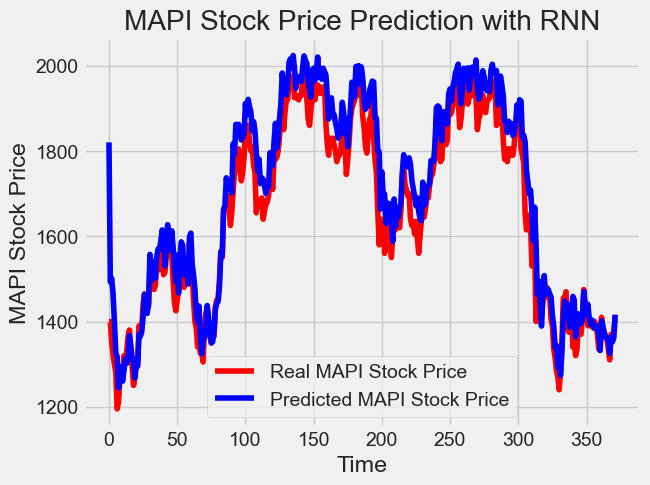

In [1364]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((MAPI["close"][:"2023"],MAPI["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(MAPI_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('MAPI', MAPI_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\3221763024.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


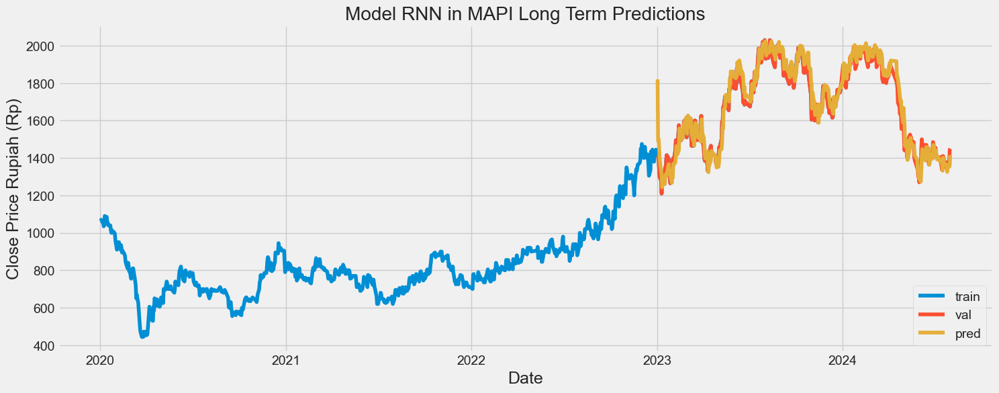

In [1365]:
# Visualize the data
# Visualize the data
# Plot the data
train = MAPI[:"2023"]
valid = MAPI["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in MAPI Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1366]:
# Evaluating the sequence
rmse = return_rmse(MAPI_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(MAPI_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('MAPI')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 63.624569195736356.
The root mean squared error after normalization is 0.07673625926039207.


### TLKM

#### Data Split

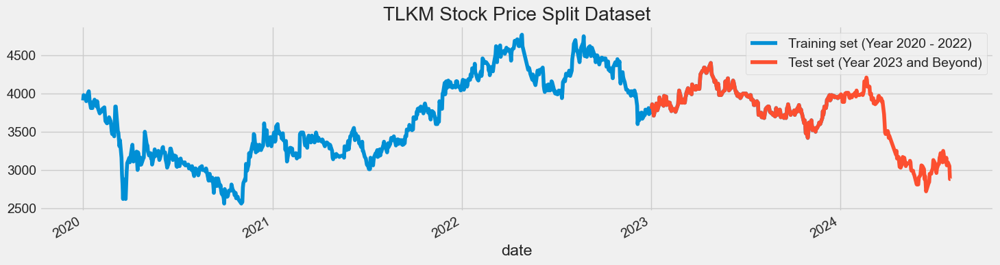

In [1367]:
TLKM_long_train = TLKM[:"2023"].iloc[:,3:4].values
TLKM_long_test = TLKM["2023":].iloc[:,3:4].values
TLKM["close"][:"2023"].plot(figsize=(16,4), legend=True)
TLKM["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('TLKM Stock Price Split Dataset')
plt.show()

In [1368]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_long_train)
len_train = len(TLKM_long_train)
len_test = len(TLKM_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [1369]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 2s 79ms/step - loss: 0.0017
Epoch 2/50
29/29 [==============================] - 2s 78ms/step - loss: 0.0016
Epoch 3/50
29/29 [==============================] - 2s 78ms/step - loss: 0.0015
Epoch 4/50
29/29 [==============================] - 2s 78ms/step - loss: 0.0015
Epoch 5/50
29/29 [==============================] - 2s 80ms/step - loss: 0.0014
Epoch 6/50
29/29 [==============================] - 2s 80ms/step - loss: 0.0015
Epoch 7/50
29/29 [==============================] - 2s 78ms/step - loss: 0.0015
Epoch 8/50
29/29 [==============================] - 2s 77ms/step - loss: 0.0014
Epoch 9/50
29/29 [==============================] - 2s 77ms/step - loss: 0.0016
Epoch 10/50
29/29 [==============================] - 2s 77ms/step - loss: 0.0015
Epoch 11/50
29/29 [==============================] - 2s 77ms/step - loss: 0.0016
Epoch 12/50
29/29 [==============================] - 2s 77ms/step - loss: 0.0014
Epoch 13/50
29/29 [==================

12/12 [==============================] - 0s 34ms/step


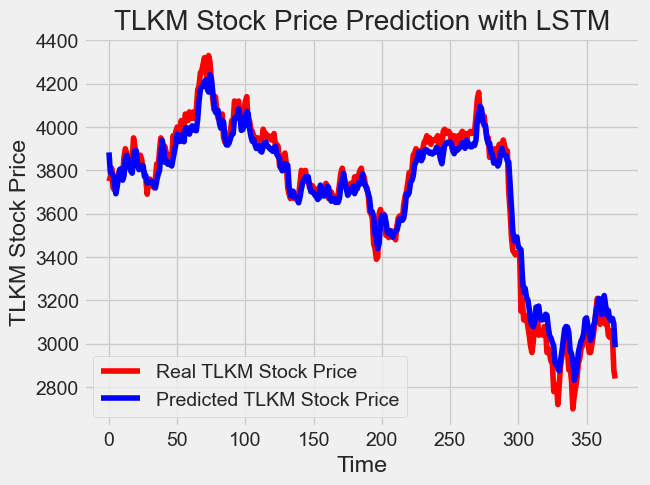

In [1370]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"][:"2023"],TLKM["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('TLKM', TLKM_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\879148995.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


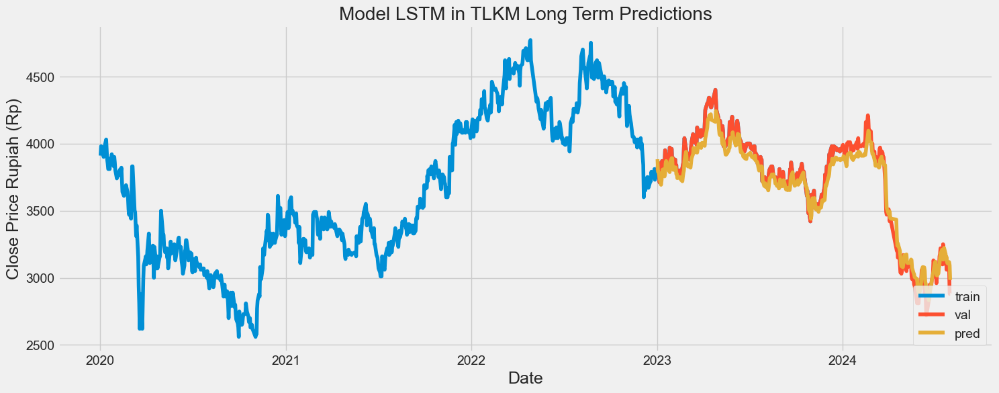

In [1371]:
# Visualize the data
# Plot the data
train = TLKM[:"2023"]
valid = TLKM["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in TLKM Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1372]:
# Evaluating the sequence
rmse = return_rmse(TLKM_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 64.21033549096408.
The root mean squared error after normalization is 0.03939284385948718.


#### GRU Predictions

In [1373]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 1s 196ms/step - loss: 0.0027
Epoch 2/50
7/7 [==============================] - 1s 190ms/step - loss: 0.0026
Epoch 3/50
7/7 [==============================] - 1s 191ms/step - loss: 0.0026
Epoch 4/50
7/7 [==============================] - 1s 200ms/step - loss: 0.0026
Epoch 5/50
7/7 [==============================] - 1s 203ms/step - loss: 0.0025
Epoch 6/50
7/7 [==============================] - 1s 193ms/step - loss: 0.0027
Epoch 7/50
7/7 [==============================] - 1s 193ms/step - loss: 0.0027
Epoch 8/50
7/7 [==============================] - 1s 189ms/step - loss: 0.0028
Epoch 9/50
7/7 [==============================] - 1s 195ms/step - loss: 0.0027
Epoch 10/50
7/7 [==============================] - 1s 198ms/step - loss: 0.0027
Epoch 11/50
7/7 [==============================] - 1s 190ms/step - loss: 0.0027
Epoch 12/50
7/7 [==============================] - 1s 198ms/step - loss: 0.0025
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 0s 32ms/step


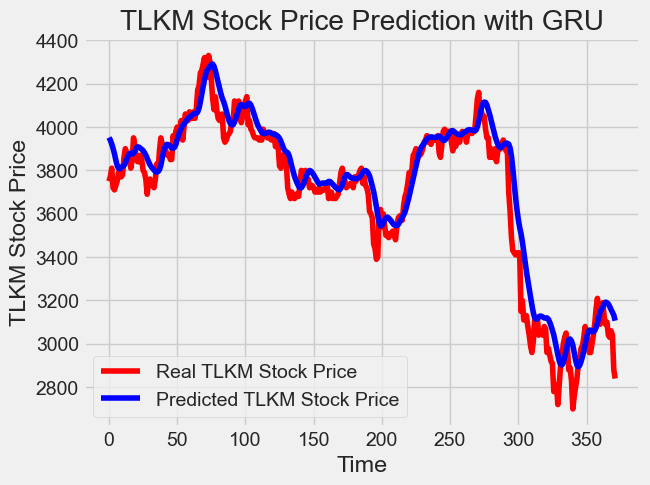

In [1374]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"][:"2023"],TLKM["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('TLKM', TLKM_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1496867046.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


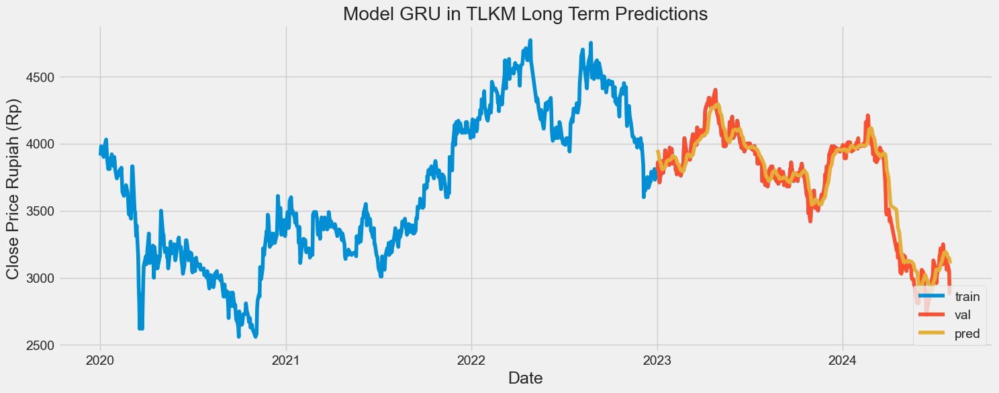

In [1375]:
# Visualize the data
# Visualize the data
# Plot the data
train = TLKM[:"2023"]
valid = TLKM["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in TLKM Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1376]:
# Evaluating the sequence
rmse = return_rmse(TLKM_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 102.79228517759827.
The root mean squared error after normalization is 0.06306275164269833.


#### RNN Predictions

In [1377]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 41ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0016 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0018 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 41ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 48ms/step - loss: 0.0016 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 49ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 43ms/step - loss: 0.0015 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 44ms/step - loss: 0.0014 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 13ms/step


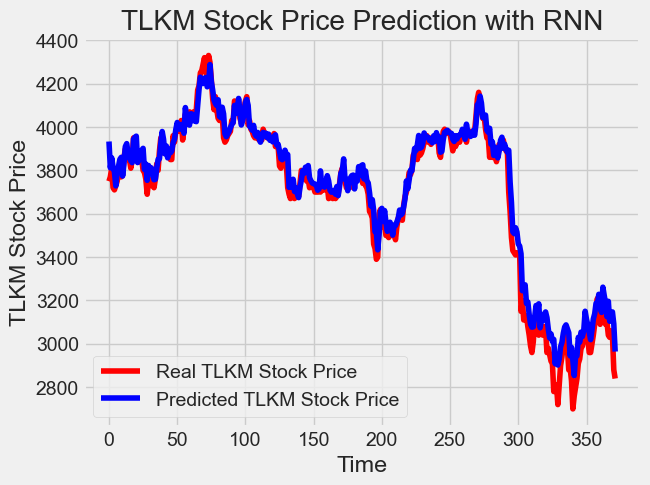

In [1378]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((TLKM["close"][:"2023"],TLKM["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(TLKM_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('TLKM', TLKM_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1235161846.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


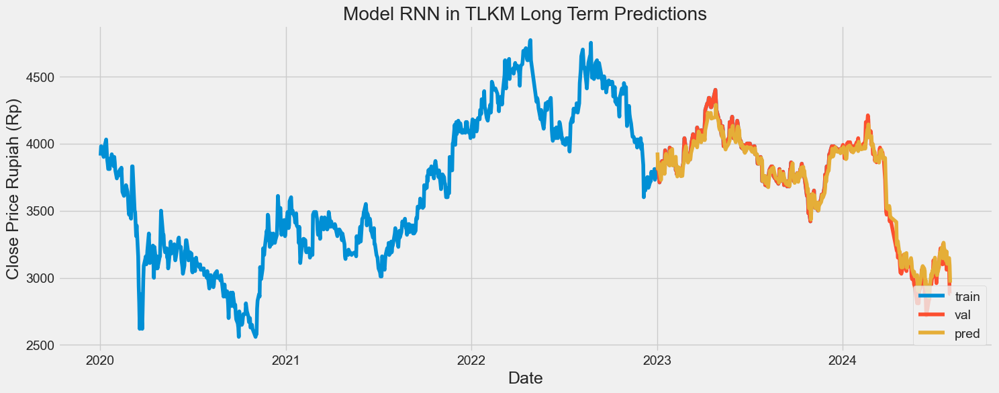

In [1379]:
# Visualize the data
# Visualize the data
# Plot the data
train = TLKM[:"2023"]
valid = TLKM["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in TLKM Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1380]:
# Evaluating the sequence
rmse = return_rmse(TLKM_long_test,RNN_predicted_stock_price)
norm_rmse = return_rmse_norm(TLKM_long_test,RNN_predicted_stock_price)
dic_res['stock'].append('TLKM')
dic_res['term'].append('long')
dic_res['algorithm'].append('RNN')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 63.60440373820951.
The root mean squared error after normalization is 0.039021106587858595.


### BBCA (Non Adjusted Stock Split)

#### Data Split

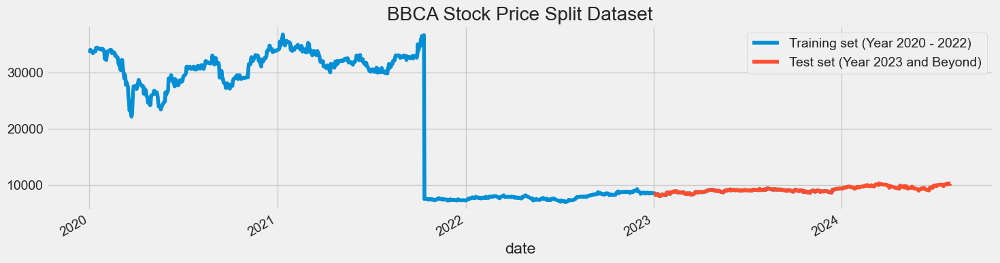

In [1476]:
BBCA_long_train = BBCA[:"2023"].iloc[:,3:4].values
BBCA_long_test = BBCA["2023":].iloc[:,3:4].values
BBCA["close"][:"2023"].plot(figsize=(16,4), legend=True)
BBCA["close"]["2023":].plot(figsize=(16,4), legend=True)
plt.legend(["Training set (Year 2020 - 2022)","Test set (Year 2023 and Beyond)"])
plt.title('BBCA Stock Price Split Dataset')
plt.show()

In [1477]:
#Scaling the training set
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(TLKM_long_train)
len_train = len(TLKM_long_train)
len_test = len(TLKM_long_test)
print(len_train, len_test)
# Since LSTMs store long term memory state, we create a data structure with 60 timesteps and 1 output
# So for each element of training set, we have 60 previous training set elements 
X_train = []
y_train = []
for i in range(60,len_train):
    X_train.append(training_set_scaled[i-60:i,0])
    y_train.append(training_set_scaled[i,0])
X_train, y_train = np.array(X_train), np.array(y_train)
# Reshaping X_train for efficient modelling
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

974 372


#### LSTM Predictions

In [1478]:
regressorLSTM.fit(X_train,y_train,epochs=50,batch_size=32)

Epoch 1/50
29/29 [==============================] - 2s 78ms/step - loss: 0.0014
Epoch 2/50
29/29 [==============================] - 2s 82ms/step - loss: 0.0014
Epoch 3/50
29/29 [==============================] - 2s 78ms/step - loss: 0.0013
Epoch 4/50
29/29 [==============================] - 2s 72ms/step - loss: 0.0015
Epoch 5/50
29/29 [==============================] - 2s 86ms/step - loss: 0.0013
Epoch 6/50
29/29 [==============================] - 2s 84ms/step - loss: 0.0013
Epoch 7/50
29/29 [==============================] - 3s 92ms/step - loss: 0.0014
Epoch 8/50
29/29 [==============================] - 3s 96ms/step - loss: 0.0014
Epoch 9/50
29/29 [==============================] - 3s 93ms/step - loss: 0.0012
Epoch 10/50
29/29 [==============================] - 3s 104ms/step - loss: 0.0014
Epoch 11/50
29/29 [==============================] - 4s 122ms/step - loss: 0.0014
Epoch 12/50
29/29 [==============================] - 3s 101ms/step - loss: 0.0012
Epoch 13/50
29/29 [===============

12/12 [==============================] - 1s 42ms/step


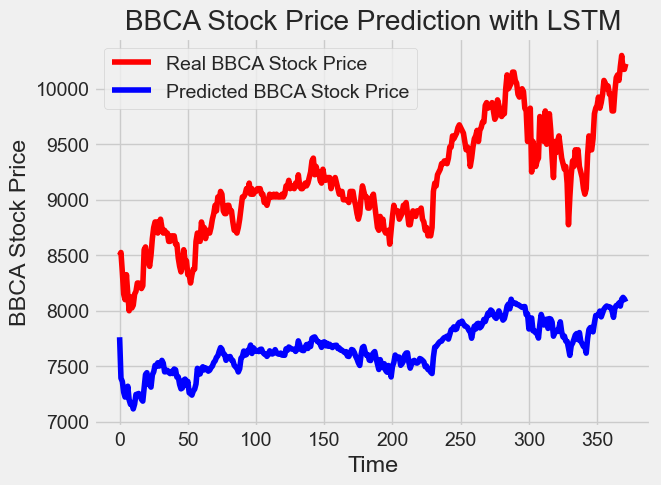

In [1479]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"][:"2023"],BBCA["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
LSTM_predicted_stock_price = regressorLSTM.predict(X_test)
LSTM_predicted_stock_price = sc.inverse_transform(LSTM_predicted_stock_price)
# Visualizing the results for LSTM
lstm_title = "with LSTM"
plot_predictions('BBCA', BBCA_long_test,LSTM_predicted_stock_price, lstm_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1663685250.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = LSTM_predicted_stock_price


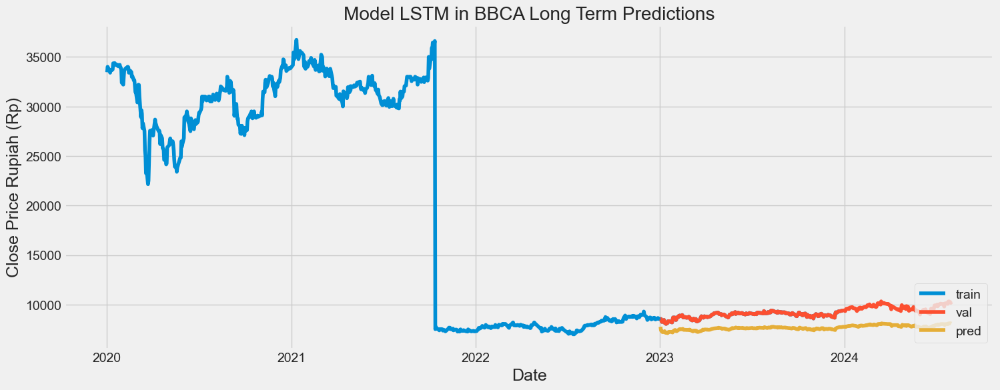

In [1480]:
# Visualize the data
# Plot the data
train = BBCA[:"2023"]
valid = BBCA["2023":]
valid['pred'] = LSTM_predicted_stock_price
# Visualize the data
plt.figure(figsize=(16,6))
plt.title('Model LSTM in BBCA Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()


In [1481]:
# Evaluating the sequence
rmse = return_rmse(BBCA_long_test,LSTM_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_long_test,LSTM_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('long')
dic_res['algorithm'].append('LSTM')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 1501.314314674843.
The root mean squared error after normalization is 0.4714929356305562.


#### GRU Predictions

In [1482]:
# Fitting to the training set
regressorGRU.fit(X_train,y_train,epochs=50,batch_size=150)

Epoch 1/50
7/7 [==============================] - 1s 204ms/step - loss: 0.0026
Epoch 2/50
7/7 [==============================] - 1s 198ms/step - loss: 0.0024
Epoch 3/50
7/7 [==============================] - 1s 171ms/step - loss: 0.0026
Epoch 4/50
7/7 [==============================] - 1s 169ms/step - loss: 0.0025
Epoch 5/50
7/7 [==============================] - 1s 169ms/step - loss: 0.0024
Epoch 6/50
7/7 [==============================] - 1s 168ms/step - loss: 0.0027
Epoch 7/50
7/7 [==============================] - 1s 174ms/step - loss: 0.0025
Epoch 8/50
7/7 [==============================] - 1s 173ms/step - loss: 0.0025
Epoch 9/50
7/7 [==============================] - 1s 188ms/step - loss: 0.0024
Epoch 10/50
7/7 [==============================] - 1s 194ms/step - loss: 0.0025
Epoch 11/50
7/7 [==============================] - 1s 195ms/step - loss: 0.0023
Epoch 12/50
7/7 [==============================] - 1s 194ms/step - loss: 0.0027
Epoch 13/50
7/7 [==============================] 

12/12 [==============================] - 1s 43ms/step


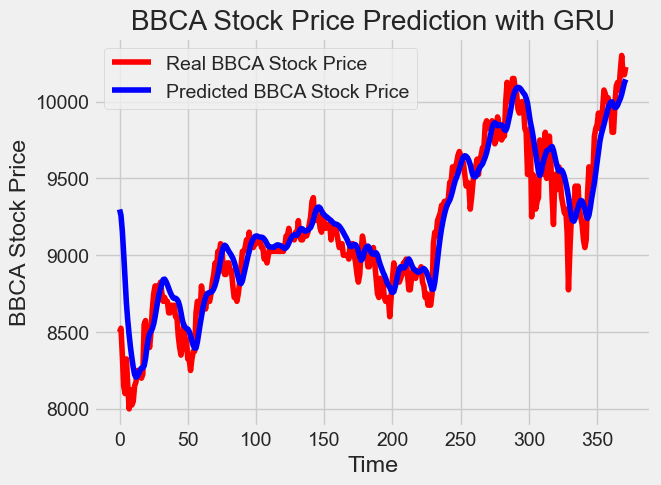

In [1483]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"][:"2023"],BBCA["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
GRU_predicted_stock_price = regressorGRU.predict(X_test)
GRU_predicted_stock_price = sc.inverse_transform(GRU_predicted_stock_price)
# Visualizing the results for GRU
GRU_title = "with GRU"
plot_predictions('BBCA', BBCA_long_test,GRU_predicted_stock_price, GRU_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\1402792504.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = GRU_predicted_stock_price


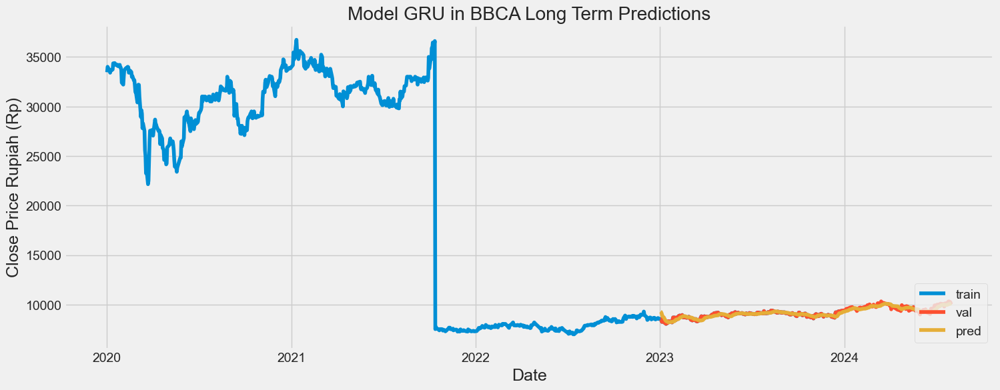

In [1484]:
# Visualize the data
# Visualize the data
# Plot the data
train = BBCA[:"2023"]
valid = BBCA["2023":]
valid['pred'] = GRU_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model GRU in BBCA Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



In [1485]:
# Evaluating the sequence
rmse = return_rmse(BBCA_long_test,GRU_predicted_stock_price)
norm_rmse = return_rmse_norm(BBCA_long_test,GRU_predicted_stock_price)
dic_res['stock'].append('BBCA')
dic_res['term'].append('long')
dic_res['algorithm'].append('GRU')
dic_res['rmse'].append(rmse)
dic_res['rmse_norm'].append(norm_rmse)


The root mean squared error is 173.74854850807543.
The root mean squared error after normalization is 0.07554284717742411.


#### RNN Predictions

In [1486]:
regressorRNN.fit(X_train, y_train, epochs = 50, batch_size = 32)

Epoch 1/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0016 - accuracy: 0.0011
Epoch 2/50
29/29 [==============================] - 1s 46ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 3/50
29/29 [==============================] - 1s 39ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 4/50
29/29 [==============================] - 1s 39ms/step - loss: 0.0012 - accuracy: 0.0011
Epoch 5/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 6/50
29/29 [==============================] - 1s 42ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 7/50
29/29 [==============================] - 1s 39ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 8/50
29/29 [==============================] - 1s 38ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 9/50
29/29 [==============================] - 1s 38ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 10/50
29/29 [==============================] - 1s 39ms/step - loss: 0.0013 - accuracy: 0.0011
Epoch 11/

12/12 [==============================] - 0s 14ms/step


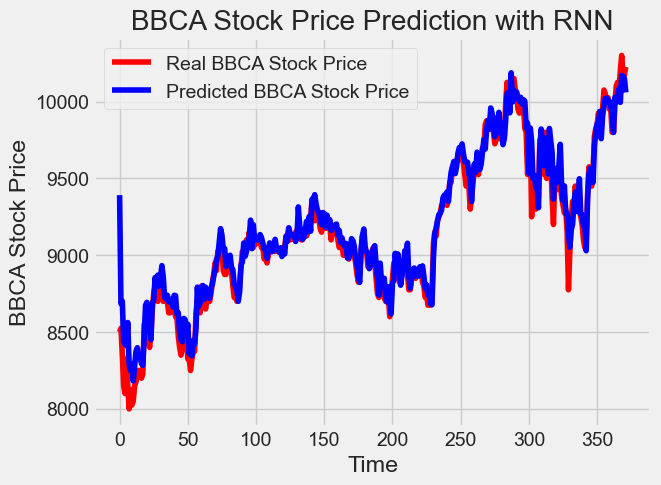

In [1487]:
# Now to get the test set ready in a similar way as the training set.
# The following has been done so forst 60 entires of test set have 60 previous values which is impossible to get unless we take the whole 
# 'High' attribute data for processing

dataset_total = pd.concat((BBCA["close"][:"2023"],BBCA["close"]["2023":]),axis=0)
inputs = dataset_total[len(dataset_total)-len(BBCA_long_test) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = sc.transform(inputs)

# Preparing X_test and predicting the prices
X_test = []
for i in range(60,len_test+60):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
RNN_predicted_stock_price = regressorRNN.predict(X_test)
RNN_predicted_stock_price = sc.inverse_transform(RNN_predicted_stock_price)
# Visualizing the results for RNN
RNN_title = "with RNN"
plot_predictions('BBCA', BBCA_long_test,RNN_predicted_stock_price, RNN_title)

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_6668\105106935.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['pred'] = RNN_predicted_stock_price


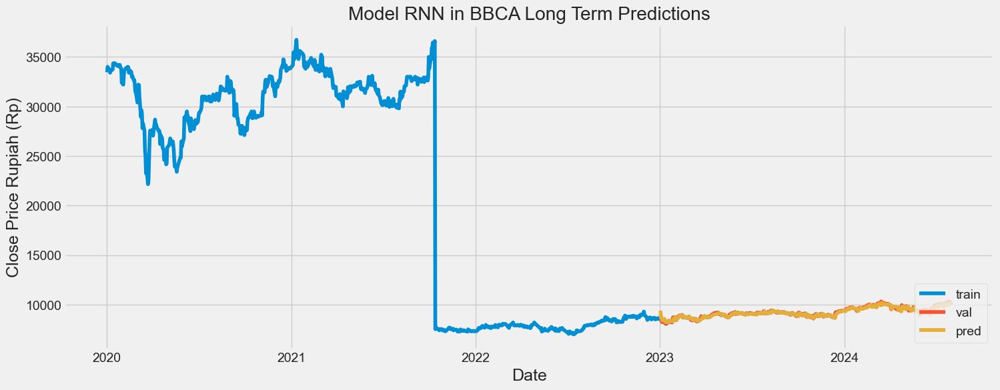

In [1488]:
# Visualize the data
# Visualize the data
# Plot the data
train = BBCA[:"2023"]
valid = BBCA["2023":]
valid['pred'] = RNN_predicted_stock_price
plt.figure(figsize=(16,6))
plt.title('Model RNN in BBCA Long Term Predictions')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price Rupiah (Rp)', fontsize=18)
plt.plot(train['close'])
plt.plot(valid[['close', 'pred']])
plt.legend(['train', 'val', 'pred'], loc='lower right')
plt.show()



### BBCA (Adjust Stock Split)

#### Data Preparation

In [1423]:
before_ss =BBCA["close"][:"2021-10-12"]
after_ss = BBCA["close"]["2021-10-13":]

In [1425]:
before_ss.tail()
after_ss.head()

date
2021-10-13    7525
2021-10-14    7750
2021-10-15    7650
2021-10-18    7525
2021-10-19    7500
Name: close, dtype: int64

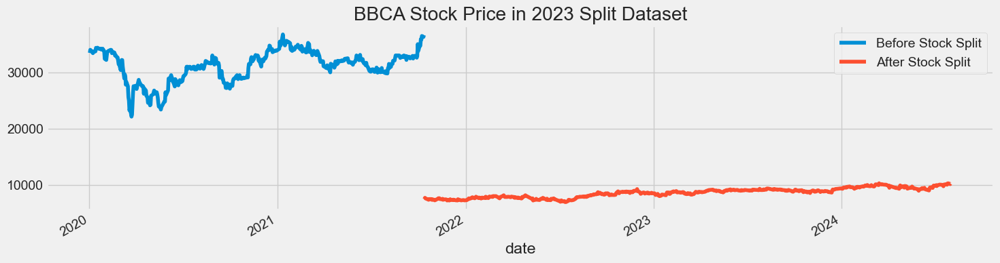

In [1427]:
BBCA["close"][:"2021-10-12"].plot(figsize=(16,4), legend=True)
BBCA["close"]["2021-10-13":].plot(figsize=(16,4), legend=True)
plt.legend(["Before Stock Split","After Stock Split"])
plt.title('BBCA Stock Price in 2023 Split Dataset')
plt.show()

In [1428]:
before_stocksplit = BBCA[:"2021-10-12"].iloc[:,3:4].values
after_stocksplit = BBCA["2021-10-13":].iloc[:,3:4].values

In [1430]:
norm_before = sc.fit_transform(before_stocksplit)
norm_after =  sc.fit_transform(after_stocksplit)

In [1434]:
print(norm_before.shape,
norm_after.shape)

(433, 1) (674, 1)


In [1435]:
before_norm_list = list(norm_before.reshape(433))
after_norm_list = list(norm_after.reshape(674))

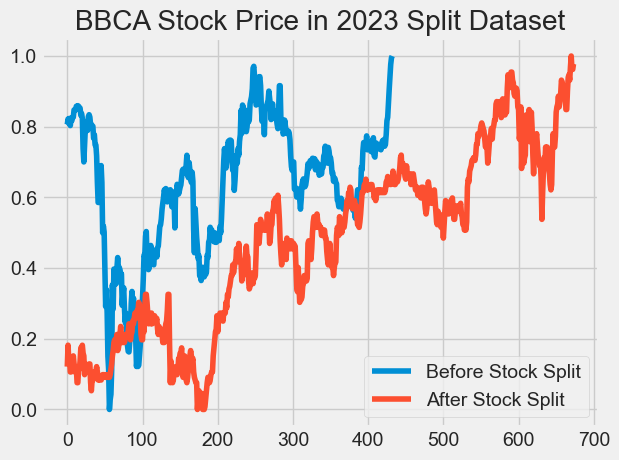

In [1437]:
plt.plot(before_norm_list)
plt.plot(after_norm_list)
plt.legend(["Before Stock Split","After Stock Split"])
plt.title('BBCA Stock Price in 2023 Split Dataset')
plt.show()

In [1443]:
bef_af_ss_change = before_norm_list[-1] - after_norm_list[0]
print(before_norm_list[-1], after_norm_list[0], bef_af_ss_change)

0.9999999999999998 0.1212121212121211 0.8787878787878787


In [1454]:
adjust_after = []
for num in after_norm_list:
    adjust_after.append(num + bef_af_ss_change)

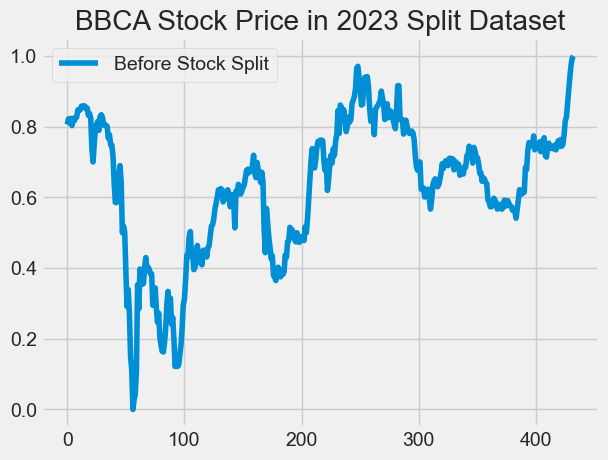

In [1458]:
norm_before = sc.inverse_transform(norm_before)


In [1467]:
norm_before

array([[1.05236544e+11],
       [1.05790367e+11],
       [1.05359616e+11],
       [1.05851903e+11],
       [1.05113472e+11],
       [1.05851903e+11],
       [1.05605759e+11],
       [1.05913439e+11],
       [1.05974975e+11],
       [1.06713407e+11],
       [1.06651871e+11],
       [1.06713407e+11],
       [1.07082622e+11],
       [1.07021086e+11],
       [1.07144158e+11],
       [1.07082622e+11],
       [1.06836479e+11],
       [1.06898015e+11],
       [1.06159583e+11],
       [1.06344191e+11],
       [1.05851903e+11],
       [1.02775105e+11],
       [1.01421314e+11],
       [1.03267393e+11],
       [1.04867328e+11],
       [1.05236544e+11],
       [1.05544223e+11],
       [1.04621184e+11],
       [1.06036511e+11],
       [1.06221119e+11],
       [1.05974975e+11],
       [1.05175008e+11],
       [1.05236544e+11],
       [1.05113472e+11],
       [1.05051936e+11],
       [1.03821217e+11],
       [1.04190432e+11],
       [1.03144321e+11],
       [1.03144321e+11],
       [1.02036674e+11],


In [1463]:
after = np.array(adjust_after).reshape(674, 1)


In [1464]:
after

array([[1.        ],
       [1.06060606],
       [1.01515152],
       [1.02272727],
       [0.98484848],
       [0.98484848],
       [1.00757576],
       [1.        ],
       [1.03030303],
       [1.00757576],
       [0.98484848],
       [0.99242424],
       [1.        ],
       [0.95454545],
       [0.95454545],
       [0.99242424],
       [0.99242424],
       [1.01515152],
       [1.0530303 ],
       [1.0530303 ],
       [1.06060606],
       [1.03787879],
       [1.03030303],
       [0.97727273],
       [1.00757576],
       [1.        ],
       [0.99242424],
       [1.        ],
       [1.        ],
       [1.00757576],
       [1.00757576],
       [0.95454545],
       [0.93181818],
       [0.96212121],
       [0.96212121],
       [0.96969697],
       [0.98484848],
       [0.98484848],
       [0.98484848],
       [1.        ],
       [0.98484848],
       [0.96212121],
       [0.96969697],
       [0.96212121],
       [0.96212121],
       [0.96212121],
       [0.96969697],
       [0.977

In [1466]:
after = sc.inverse_transform(norm_before)
after

array([[3.47280594e+14],
       [3.49108212e+14],
       [3.47686731e+14],
       [3.49311281e+14],
       [3.46874457e+14],
       [3.49311281e+14],
       [3.48499006e+14],
       [3.49514349e+14],
       [3.49717418e+14],
       [3.52154242e+14],
       [3.51951173e+14],
       [3.52154242e+14],
       [3.53372654e+14],
       [3.53169585e+14],
       [3.53575723e+14],
       [3.53372654e+14],
       [3.52560379e+14],
       [3.52763448e+14],
       [3.50326624e+14],
       [3.50935830e+14],
       [3.49311281e+14],
       [3.39157847e+14],
       [3.34690337e+14],
       [3.40782397e+14],
       [3.46062182e+14],
       [3.47280594e+14],
       [3.48295937e+14],
       [3.45249907e+14],
       [3.49920487e+14],
       [3.50529693e+14],
       [3.49717418e+14],
       [3.47077525e+14],
       [3.47280594e+14],
       [3.46874457e+14],
       [3.46671388e+14],
       [3.42610015e+14],
       [3.43828427e+14],
       [3.40376259e+14],
       [3.40376259e+14],
       [3.36721023e+14],


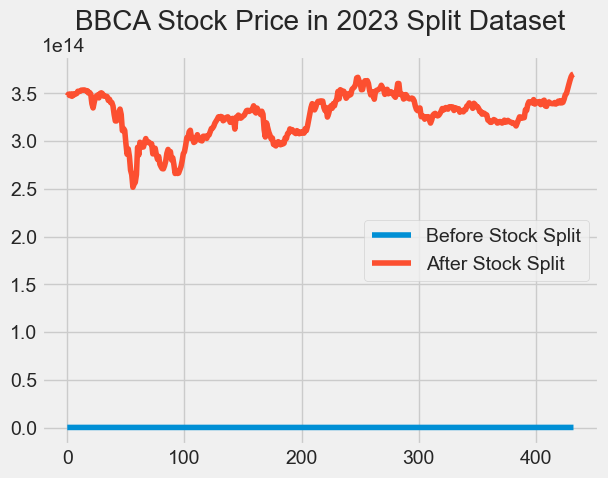

#### Data Split

#### LSTM Predictions

#### GRU Predictions

#### RNN Predictions